# Project Overview
Our project delves into video data analysis using tensor format, which encompasses 18 diverse object categories. This data is rich with additional information like bounding boxes, coordinates, segmentation masks, and depth masks. The primary objective is to utilize this data in a binary classification task, leveraging advanced machine learning models and techniques.

Key Phases of the Project:

- Data Loading: Employing "project.ipynb" methodology to load tensor-formatted videos.
- Frame Division: Splitting videos into frames for more manageable data processing.
- Object Category Extraction: Deriving labels for classification from each frame.
- Data Exploration and Visualization: Identifying a class for binary classification.
- Label Modification: Adjusting labels to '1' for chosen class and '0' for others.
- Preprocessing: Implementing techniques to prepare data for classification.
- Model Evolution and Importance: Analyzing the progression and significance of binary classification models.
- Advanced Model Utilization: Exploring robust models like MobileNet and YOLO for handling class imbalance.
- Ablation Studies: Systematically assessing the influence of design choices and hyperparameters.
- Parameter Effects Analysis: Investigating the impact of learning rates, batch sizes, and image sizes.

The approach emphasizes a comprehensive understanding of these aspects to optimize model performance in binary classification tasks.


# Import library

In [2]:
import os
import time
import numpy      as np
import pandas     as pd
import seaborn    as sns
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot   as plt

from collections         import Counter
# from skimage.filters     import unsharp_mask
# from skimage.color       import rgb2gray
from skimage.transform   import resize
# from skimage.restoration import denoise_nl_means, estimate_sigma
# from skimage.exposure    import equalize_hist
# from sklearn.utils       import shuffle
from sklearn.metrics     import accuracy_score, f1_score, confusion_matrix, classification_report

from tensorflow.keras.models              import Model
from tensorflow.keras.optimizers          import Adam
from tensorflow.keras.layers              import Input, Dense
from tensorflow.keras.callbacks           import EarlyStopping
from sklearn.model_selection              import train_test_split
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers              import GlobalAveragePooling2D, Dense, Dropout, Flatten, Input
from tensorflow.keras.applications        import MobileNetV2, ResNet50, InceptionResNetV2, InceptionV3


# Data Loading and Preparation
- Load datasets (linear, rotation, fixed) using TensorFlow Datasets.
- Convert datasets into DataFrames.
- Merge and sample the datasets.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
#drive.mount('/content/drive')
PROJECT_ROOT_DIR = "/content/drive/MyDrive/"
data_path = os.path.join(PROJECT_ROOT_DIR, 'tensorflow_data/tensorflow_data/')
os.makedirs(data_path, exist_ok=True)
print("Using directory: ", data_path)

Using directory:  /content/drive/MyDrive/tensorflow_data/tensorflow_data/


In [4]:
flow_data_set_linear = tfds.load('elg7186_projectdata/linear_movement_rotate', data_dir=data_path)
flow_data_set_rotation = tfds.load('elg7186_projectdata/rotation_rotate', data_dir=data_path)
flow_data_set_fixed = tfds.load('elg7186_projectdata/fixed_random_rotate', data_dir=data_path)

In [5]:
def make_df(data_set):
    df_list = []  # Create a list to hold DataFrames
    iter_data = iter(data_set['train'])

    for i in range(len(data_set['train'])):
        train_data = next(iter_data)
        video_frames = []

        for j in range(len(train_data['video'])):
            video_frames.append({'img': np.array(train_data['video'][j, :, :, :]),
                                 'y': train_data['instances']['category'].numpy()})

        df_list.append(pd.DataFrame(video_frames))

    return pd.concat(df_list, ignore_index=True)

# Create dataframes for each dataset
df_linear = make_df(flow_data_set_linear)  # 720 frames
df_fixed = make_df(flow_data_set_fixed)    # 720 frames
df_rot = make_df(flow_data_set_rotation)   # 720 frames

# Concatenate the dataframes into one dataframe
df = pd.concat([df_linear, df_fixed, df_rot], ignore_index=True)  # 2160 frames


In [6]:
df.sample(5)

,img,y
77,"[[[142, 139, 129], [142, 140, 131], [143, 141,...","[1, 6, 11]"
21,"[[[96, 87, 93], [92, 83, 91], [90, 82, 90], [9...","[16, 13, 6, 6, 16, 6, 13]"
1058,"[[[218, 184, 149], [220, 187, 155], [220, 185,...","[6, 6, 16]"
1727,"[[[224, 208, 161], [221, 204, 156], [220, 203,...",[0]
1613,"[[[89, 79, 62], [100, 91, 74], [95, 82, 64], [...",[1]


### Flatten the 'y' column and count occurrences of each label

In [7]:
label_counts = {}
for sublist in df['y']:
    for labels in sublist:
        if isinstance(labels, list):
            for label in labels:
                if label[0] in label_counts:
                    label_counts[label[0]] += 1
                else:
                    label_counts[label[0]] = 1

# Fill missing labels with zero counts
for i in range(16):
    if i not in label_counts:
        label_counts[i] = 0

# Sort the dictionary by keys
label_counts = dict(sorted(label_counts.items()))

print("Label Counts:")
print(label_counts)

Label Counts:
{0: 0, 1: 0, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 0, 8: 0, 9: 0, 10: 0, 11: 0, 12: 0, 13: 0, 14: 0, 15: 0}


### datasets shapes

In [8]:
print(df_linear.shape)
print(df_fixed.shape)
print(df_rot.shape)

(720, 2)
(720, 2)
(720, 2)


# Data Exploration:

- Visualize label distribution and sample images.
- Choose the most frequent class for balanced classification.

In [9]:
df_rot.sample(5)

,img,y
682,"[[[114, 141, 118], [130, 150, 119], [148, 149,...","[16, 13, 13, 13, 14, 13, 6]"
67,"[[[179, 173, 140], [178, 172, 138], [177, 171,...","[6, 14, 13, 14, 14, 14, 13]"
298,"[[[113, 111, 94], [111, 108, 92], [160, 151, 1...",[14]
342,"[[[250, 244, 222], [250, 244, 222], [251, 245,...","[6, 14, 14]"
200,"[[[99, 90, 93], [100, 92, 95], [100, 91, 93], ...","[16, 6, 6, 6, 1, 13, 16]"


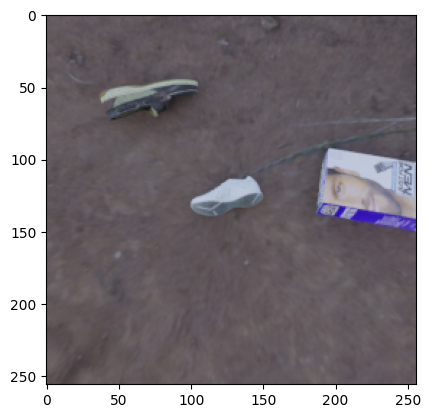

In [10]:
plt.imshow(np.array(df_rot['img'][426]))

# sample of data

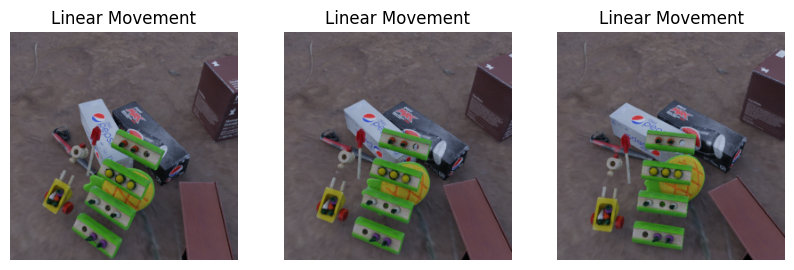

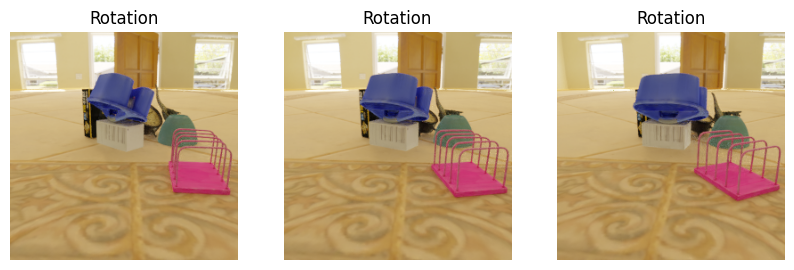

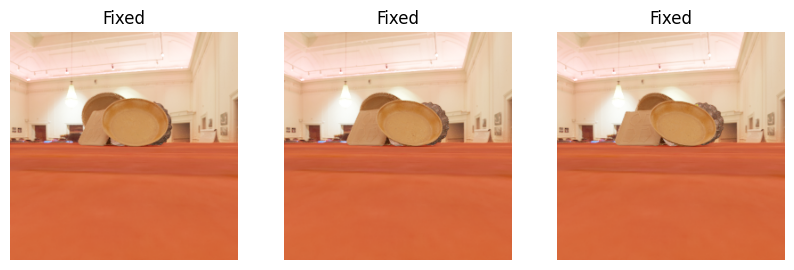

In [11]:
# in this section we will visualize the data by plotting some images from each dataset to see the difference between them

#linear move dataset
fig, ax = plt.subplots(1, 3, figsize=(10, 10))
ax[0].imshow(df_linear['img'][0])
ax[0].set_title('Linear Movement')
ax[0].axis('off')
ax[1].imshow(df_linear['img'][1])
ax[1].set_title('Linear Movement')
ax[1].axis('off')
ax[2].imshow(df_linear['img'][2])
ax[2].set_title('Linear Movement')
ax[2].axis('off')
plt.show()

# rotation dataset
fig, ax = plt.subplots(1, 3, figsize=(10, 10))
ax[0].imshow(df_rot['img'][0])
ax[0].set_title('Rotation')
ax[0].axis('off')
ax[1].imshow(df_rot['img'][1])
ax[1].set_title('Rotation')
ax[1].axis('off')
ax[2].imshow(df_rot['img'][2])
ax[2].set_title('Rotation')
ax[2].axis('off')
plt.show()


#fixed dataset
fig, ax = plt.subplots(1, 3, figsize=(10, 10))
ax[0].imshow(df_fixed['img'][0])
ax[0].set_title('Fixed')
ax[0].axis('off')
ax[1].imshow(df_fixed['img'][1])
ax[1].set_title('Fixed')
ax[1].axis('off')
ax[2].imshow(df_fixed['img'][2])
ax[2].set_title('Fixed')
ax[2].axis('off')
plt.show()

In [12]:
# getting the most frequent class to classify based on it to gurantee data balance
from collections import Counter
Counter([item for sublist in df['y'] for item in sublist]).most_common(1)

[(14, 2208)]

In [13]:
# Get counts of each element in 'y' column
counts = Counter(item for sublist in df['y'] for item in sublist)
print(counts)

Counter({14: 2208, 6: 2064, 13: 1752, 16: 888, 1: 216, 0: 216, 3: 192, 11: 72, 10: 72, 9: 72, 12: 48})


## Creation and Modification of DataFrame for Binary Classification
Cloning the Original DataFrame
To preserve the integrity of our original data (`df`), we create a deep copy named `df_copy`. This approach allows us to modify the copied DataFrame without affecting the original data, ensuring that our initial dataset remains intact for any further analysis or operations.
## Label Modification for Binary Classification
Our chosen class for binary classification is "shoe", represented by the label `14`. We modify the `df_copy` DataFrame to reflect this binary classification task:

- **Process:** We introduce a new column `z` in `df_copy`. This column will hold our binary labels.
- **Criteria:** The value in `z` is set to `1` if the label `14` (shoe) is present in the original label set `y`, otherwise, it is set to `0`.

This modification transforms our multi-class dataset into a binary one, focusing exclusively on the presence or absence of the "shoe" category.

In [14]:
import copy
df_copy = copy.deepcopy(df)
df_copy['z'] = df_copy['y'].apply(lambda x: 1 if 14 in x else 0)  # 14 is shoe

In [15]:
df_copy.sample(5)

,img,y,z
472,"[[[45, 60, 35], [44, 55, 37], [52, 67, 40], [6...",[6],0
1005,"[[[207, 233, 235], [206, 232, 234], [205, 232,...",[6],0
242,"[[[54, 63, 72], [53, 62, 71], [53, 62, 72], [5...","[14, 16, 13, 14, 6, 13, 14]",1
298,"[[[171, 157, 136], [172, 156, 140], [172, 153,...","[16, 6, 13]",0
1427,"[[[192, 81, 47], [196, 80, 47], [200, 82, 47],...",[16],0


## Ensuring Data Balance for Reliable Classification
To ensure the robustness of our model, it's crucial to verify the balance between our two classes - "shoe" and "non-shoe". An unbalanced dataset could lead to biased predictions, favoring the more dominant class.

## Importance of Choosing "Shoe" as the Binary Class
The selection of "shoe" (14) as our class of interest is particularly strategic for our binary classification task:

- **Balance and Fairness:** It offers a balance in representation, mitigating the risk of data skewness.
- **Model Accuracy:** This balance ensures more accurate and generalizable model performance.

Text(0.5, 1.0, 'Histogram of Shoe(1) vs. Non-Shoe(0)')

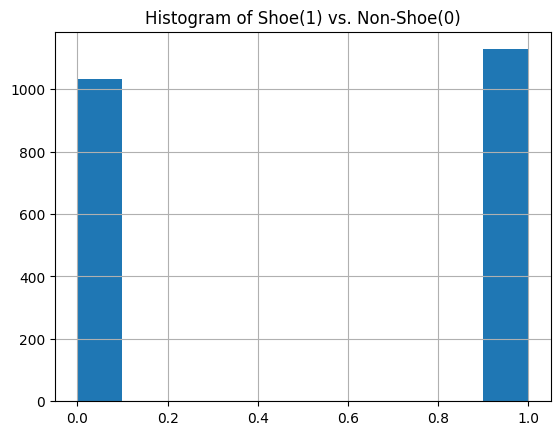

In [16]:
df_copy['z'].hist()
title = 'Histogram of Shoe(1) vs. Non-Shoe(0)'
plt.title(title)

# Preprocessing:

- Define a function for image preprocessing (resizing, enhancing, denoising).
- Apply preprocessing to all images in the datase

In [17]:
# This function is used to preprocess the images by resizing them to 128x128,
# then enhancing them using unsharp mask, then denoising them

def preprocess_image(img, desired_size=(128, 128)):
    # Resizing
    img = resize(img, desired_size)

    # Enhancing the image using unsharp mask
    # img = unsharp_mask(img)

    # Denoising
    # sigma_est = np.mean(estimate_sigma(img))
    # img = denoise_nl_means(img, h=1.15 * sigma_est, fast_mode=True)

    # Histogram Equalization for enhancing contrast
    # img = equalize_hist(img)

    # Convert to grayscale
    # gray_img = rgb2gray(img)

    # Expand the dimensions to fit the model input shape
    return np.expand_dims(img, axis=-1)

### this function is used to display the images before and after preprocessing

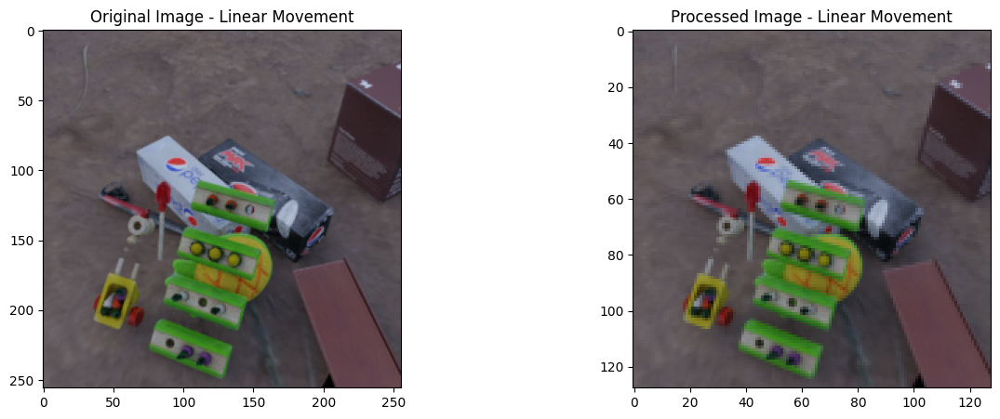

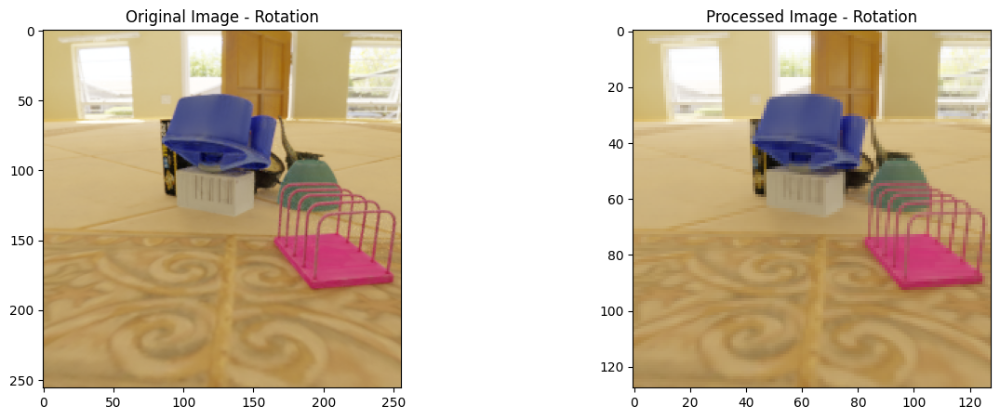

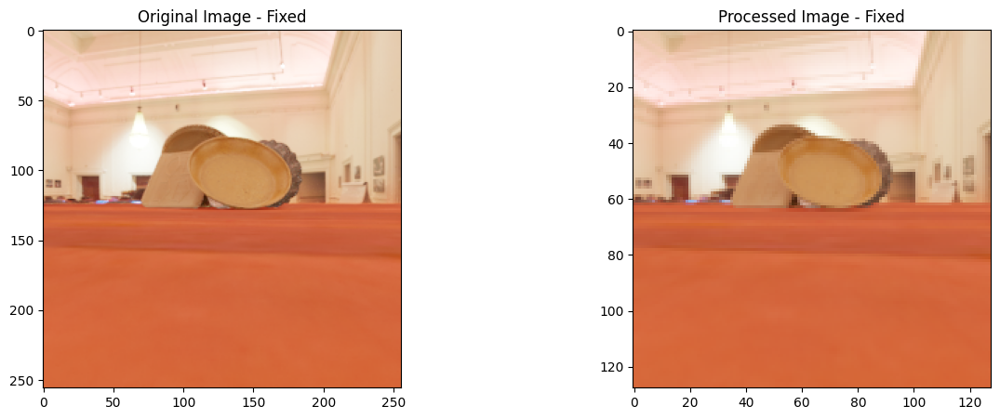

In [18]:
def display_image_processing(df, title):
      img = df['img'][1]
      processed_img = preprocess_image(img)
      fig, ax = plt.subplots(1, 2, figsize=(15, 5))
      ax[0].imshow(img)
      ax[0].set_title(f"Original Image - {title}")
      ax[1].imshow(processed_img.squeeze(), cmap='gray')
      ax[1].set_title(f"Processed Image - {title}")
      plt.show()

# Display for each dataframe
display_image_processing(df_linear, 'Linear Movement')
display_image_processing(df_rot, 'Rotation')
display_image_processing(df_fixed, 'Fixed')

## Now the data is ready for the training step

In [19]:
df_copy_preprocess = copy.deepcopy(df_copy)

# Apply preprocessing to all images
df_copy_preprocess['img'] = df_copy_preprocess['img'].apply(preprocess_image)

# Data Splitting:

- Split data into training, validation, and test sets.
- Convert image data into numpy arrays.

In [20]:
train_data, temp_data = train_test_split(df_copy_preprocess, test_size=0.3, random_state=42, shuffle=True)
val_data, test_data = train_test_split(temp_data, test_size=0.5, random_state=42, shuffle=True)

# Convert the list of processed images into an array
X_train = np.array(train_data['img'].tolist())
X_test = np.array(test_data['img'].tolist())
X_val = np.array(val_data['img'].tolist())

# Labels
y_train = train_data['z'].values
y_test = test_data['z'].values
y_val = val_data['z'].values

# Model Training and Evaluation
- Define functions for model evaluation, metric calculation, and learning curve plotting.
- Build and train various models (ResNet50, InceptionV3, InceptionResNetV2, MobileNetV2) using TensorFlow Keras.
- Implement YOLO v8 and evaluate its performance.

In [21]:
def evaluate_model(model, X_train, y_train, X_val, y_val, X_test, y_test):
    # Evaluate the model on the training set
    train_loss, train_accuracy = model.evaluate(X_train, y_train, verbose=0)
    train_pred = (model.predict(X_train) > 0.5).astype(int)
    train_cm = confusion_matrix(y_train, train_pred)

    # Evaluate the model on the validation set
    val_loss, val_accuracy = model.evaluate(X_val, y_val, verbose=0)
    val_pred = (model.predict(X_val) > 0.5).astype(int)
    val_cm = confusion_matrix(y_val, val_pred)

    # Evaluate the model on the test set
    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    test_pred = (model.predict(X_test) > 0.5).astype(int)
    test_cm = confusion_matrix(y_test, test_pred)

    # Plotting Confusion Matrices
    fig, axs = plt.subplots(1, 3, figsize=(18, 5))

    sns.heatmap(train_cm, annot=True, cmap='Pastel1', ax=axs[0], fmt='g')
    axs[0].set_title('Training Confusion Matrix')
    axs[0].set_xlabel('Predicted Labels')
    axs[0].set_ylabel('Actual Labels')

    sns.heatmap(val_cm, annot=True, cmap='Pastel2', ax=axs[1], fmt='g')
    axs[1].set_title('Validation Confusion Matrix')
    axs[1].set_xlabel('Predicted Labels')
    axs[1].set_ylabel('Actual Labels')

    sns.heatmap(test_cm, annot=True, cmap='Pastel1', ax=axs[2], fmt='g')
    axs[2].set_title('Testing Confusion Matrix')
    axs[2].set_xlabel('Predicted Labels')
    axs[2].set_ylabel('Actual Labels')

    plt.tight_layout()
    plt.show()

    return train_cm,val_cm,test_cm

In [22]:
def evaluate_model_metrics(model, X_train, y_train, X_val, y_val, X_test, y_test):
    def calculate_metrics(X, y):
        y_pred = model.predict(X)
        y_pred_classes = (y_pred > 0.5).astype(int)

        accuracy = accuracy_score(y, y_pred_classes)
        f1 = f1_score(y, y_pred_classes)
        loss = model.evaluate(X, y, verbose=0)[0]

        return accuracy, f1, loss, classification_report(y, y_pred_classes)

    train_accuracy, train_f1, train_loss, train_classification_report = calculate_metrics(X_train, y_train)
    val_accuracy, val_f1, val_loss, val_classification_report = calculate_metrics(X_val, y_val)
    test_accuracy, test_f1, test_loss, test_classification_report = calculate_metrics(X_test, y_test)

    results = {
        'Training': {
            'Accuracy': train_accuracy,
            'F1 Score': train_f1,
            'Loss': train_loss,
            'Classification Report': train_classification_report
        },
        'Validation': {
            'Accuracy': val_accuracy,
            'F1 Score': val_f1,
            'Loss': val_loss,
            'Classification Report': val_classification_report
        },
        'Test': {
            'Accuracy': test_accuracy,
            'F1 Score': test_f1,
            'Loss': test_loss,
            'Classification Report': test_classification_report
        }
    }

    return results


In [23]:
def plot_learning_curves(history):
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    # Plot training & validation accuracy values
    axs[0].plot(history.history['accuracy'])
    axs[0].plot(history.history['val_accuracy'])
    axs[0].set_title('Model accuracy')
    axs[0].set_ylabel('Accuracy')
    axs[0].set_xlabel('Epoch')
    axs[0].legend(['Train', 'Validation'], loc='upper left')

    # Plot training & validation loss values
    axs[1].plot(history.history['loss'])
    axs[1].plot(history.history['val_loss'])
    axs[1].set_title('Model loss')
    axs[1].set_ylabel('Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].legend(['Train', 'Validation'], loc='upper left')

    plt.tight_layout()
    plt.show()


# Model Training: Overview
**In this section,** we focus on training four advanced deep learning models: `ResNet50`, `InceptionV3`, `InceptionResNetV2`, `MobileNetV2`, and `Yolo v8`. Each model offers unique architectural features and has been proven effective in various image classification tasks. Our training strategy will be consistent across these models for a fair comparison of their performances.

In [24]:
def build_and_train_model(X_train, y_train, X_val, y_val, X_test, y_test, model_type, batch_size=100, epochs=32, learning_rate=0.0001):
    if model_type == 'ResNet50':
        base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(128, 128, 3))
    elif model_type == 'InceptionV3':
        base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(128, 128, 3))
    elif model_type == 'InceptionResNetV2':
        base_model = InceptionResNetV2(weights='imagenet', include_top=False, input_shape=(128, 128, 3))
    elif model_type == 'MobileNetV2':
        base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(128, 128, 3))
    else:
        raise ValueError("Invalid model type. Supported types are: 'ResNet50', 'InceptionV3', 'InceptionResNetV2', 'MobileNetV2'")

    # Freeze the layers of the base model
    for layer in base_model.layers:
        layer.trainable = False

    # Add custom layers
    x = GlobalAveragePooling2D()(base_model.output)
    x = Dense(512, activation='relu')(x)
    x = Dropout(0.5)(x)
    predictions = Dense(1, activation='sigmoid')(x)

    # Define the final model
    custom_model = Model(inputs=base_model.input, outputs=predictions)

    # Compile the model
    custom_model.compile(optimizer=Adam(learning_rate=learning_rate), loss='binary_crossentropy', metrics=['accuracy'])

    # Early stopping callback
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, verbose=1, restore_best_weights=True)

    # Train the model
    start_time = time.time()
    history = custom_model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_val, y_val), callbacks=[early_stopping])
    end_time = time.time()
    training_time = end_time - start_time

    # Evaluate the model on train, validation, and test sets
    train_loss, train_accuracy = custom_model.evaluate(X_train, y_train, verbose=0)
    y_train_pred = custom_model.predict(X_train)
    train_cm = confusion_matrix(y_train, y_train_pred > 0.5)

    val_loss, val_accuracy = custom_model.evaluate(X_val, y_val, verbose=0)
    y_val_pred = custom_model.predict(X_val)
    val_cm = confusion_matrix(y_val, y_val_pred > 0.5)

    start_time = time.time()
    test_loss, test_accuracy = custom_model.evaluate(X_test, y_test, verbose=0)
    end_time = time.time()
    evaluate_time = end_time - start_time

    start_time = time.time()
    y_test_pred = custom_model.predict(X_test)
    end_time = time.time()
    predict_time = end_time - start_time

    test_cm = confusion_matrix(y_test, y_test_pred > 0.5)

    print("Training Time:", training_time)
    print("Evaluation Time:", evaluate_time)
    print("Prediction Time:", predict_time)

    print("\nTraining Confusion Matrix:")
    print(train_cm)
    print("\nValidation Confusion Matrix:")
    print(val_cm)
    print("\nTest Confusion Matrix:")
    print(test_cm)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_test_pred > 0.5)
    loss = custom_model.evaluate(X_test, y_test, verbose=0)[0]
    f1 = f1_score(y_test, y_test_pred > 0.5)

    print("Accuracy:", accuracy)
    print("Loss:", loss)
    print("F1 Score:", f1)

    # Calculate approximate memory usage based on model trainable variables
    total_parameters = np.sum([np.prod(variable.shape) for variable in custom_model.trainable_variables])
    approximate_memory = total_parameters * 4  # Assuming each parameter is a float32 (4 bytes)
    print("Approximate memory usage of the model (in bytes):", approximate_memory)

    # Display model summary to get an estimate of memory usage
    # print(custom_model.summary())
    evaluate_model(custom_model, X_train, y_train, X_val, y_val, X_test, y_test)
    results = evaluate_model_metrics(custom_model, X_train, y_train, X_val, y_val, X_test, y_test)

    for set_name, metrics in results.items():
        print(f"{set_name} Set:")
        print("Accuracy:", metrics['Accuracy'])
        print("F1 Score:", metrics['F1 Score'])
        print("Loss:", metrics['Loss'])
        print("Classification Report:")
        print(metrics['Classification Report'])
        print("\n")

    # Plot learning curves for the training set only
    plot_learning_curves(history)

    return training_time, evaluate_time, predict_time, train_loss, train_accuracy, y_train_pred, train_cm, val_loss, val_accuracy, y_val_pred, val_cm, test_loss, test_accuracy, y_test_pred, test_cm, custom_model, history



## Train the models (ResNet50 , Inception , InceptionResNetV2 and MobileNetv2) with:

- batch_size=100

- epochs=32

- learning_rate=0.0001

These parameters are chosen to balance training efficiency and model performance.

## ResNet50

ResNet50 is a powerful deep learning model for binary classification tasks. It comprises 50 layers of convolutional neural networks that allow for the extraction of intricate features from images. By utilizing skip connections, ResNet50 mitigates the vanishing gradient problem, enhancing training efficiency and enabling accurate classification between two classes.

94765736/94765736 [==============================] - 0s 0us/step
Epoch 1/32
16/16 [==============================] - 14s 669ms/step - loss: 0.7184 - accuracy: 0.5152 - val_loss: 0.6931 - val_accuracy: 0.4877
Epoch 2/32
16/16 [==============================] - 9s 576ms/step - loss: 0.7182 - accuracy: 0.5265 - val_loss: 0.6912 - val_accuracy: 0.4877
Epoch 3/32
16/16 [==============================] - 9s 578ms/step - loss: 0.7235 - accuracy: 0.4901 - val_loss: 0.6845 - val_accuracy: 0.6944
Epoch 4/32
16/16 [==============================] - 10s 616ms/step - loss: 0.7107 - accuracy: 0.5179 - val_loss: 0.6876 - val_accuracy: 0.4877
Epoch 5/32
16/16 [==============================] - 11s 666ms/step - loss: 0.7109 - accuracy: 0.5258 - val_loss: 0.6862 - val_accuracy: 0.4877
Epoch 6/32
16/16 [==============================] - 11s 675ms/step - loss: 0.7048 - accuracy: 0.5377 - val_loss: 0.6807 - val_accuracy: 0.4877
Epoch 7/32
16/16 [==============================] - 11s 666ms/step - loss: 0.69

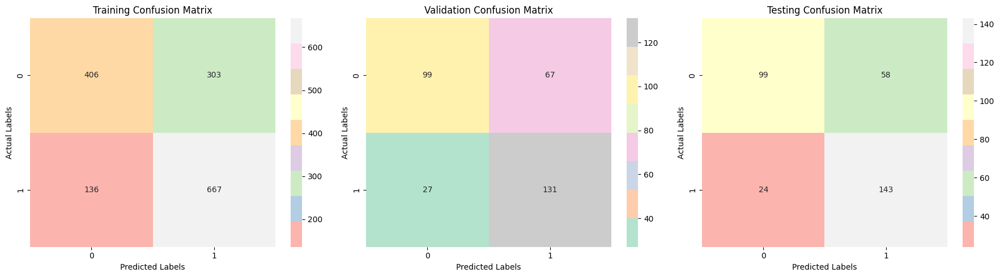

11/11 [==============================] - 2s 137ms/step
Training Set:
Accuracy: 0.7096560846560847
F1 Score: 0.7523970671178792
Loss: 0.6428483724594116
Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.57      0.65       709
           1       0.69      0.83      0.75       803

    accuracy                           0.71      1512
   macro avg       0.72      0.70      0.70      1512
weighted avg       0.72      0.71      0.70      1512



Validation Set:
Accuracy: 0.7098765432098766
F1 Score: 0.7359550561797752
Loss: 0.6414240002632141
Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.60      0.68       166
           1       0.66      0.83      0.74       158

    accuracy                           0.71       324
   macro avg       0.72      0.71      0.71       324
weighted avg       0.73      0.71      0.71       324



Test Set:
Accuracy: 0.7469135802469136
F1 Sco

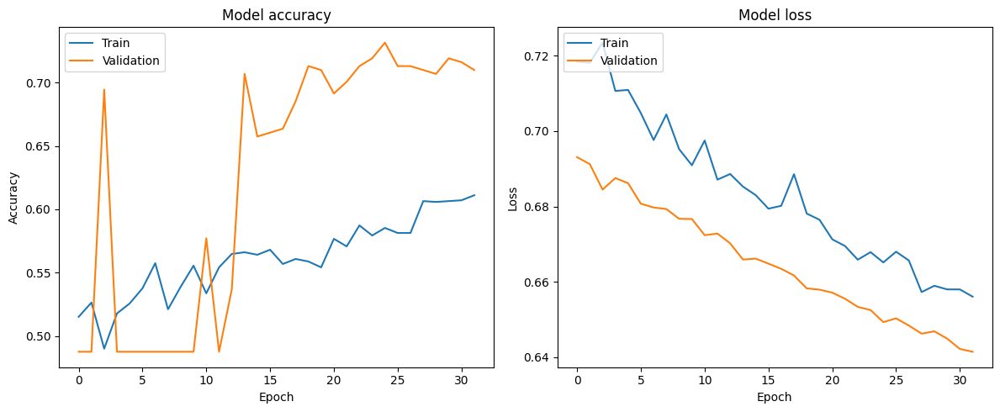

In [25]:
# Example usage with specified batch size, epochs, and learning rate
resnet_results = build_and_train_model(X_train, y_train, X_val, y_val, X_test, y_test, 'ResNet50', batch_size=100, epochs=32, learning_rate=0.0001)

## Inception



The Inception model for binary classification utilizes a deep learning architecture called InceptionV3. It extracts features from images through multiple convolutional layers and employs global average pooling for dimensionality reduction. Dropout layers help prevent overfitting, while dense layers and a final sigmoid activation function produce binary classification results. This model is effective for tasks like distinguishing between two classes in images.

87910968/87910968 [==============================] - 0s 0us/step
Epoch 1/32
16/16 [==============================] - 9s 327ms/step - loss: 0.8587 - accuracy: 0.6098 - val_loss: 0.4226 - val_accuracy: 0.7963
Epoch 2/32
16/16 [==============================] - 4s 229ms/step - loss: 0.5517 - accuracy: 0.7533 - val_loss: 0.3101 - val_accuracy: 0.8735
Epoch 3/32
16/16 [==============================] - 4s 230ms/step - loss: 0.3924 - accuracy: 0.8294 - val_loss: 0.2619 - val_accuracy: 0.8981
Epoch 4/32
16/16 [==============================] - 4s 229ms/step - loss: 0.3061 - accuracy: 0.8704 - val_loss: 0.2254 - val_accuracy: 0.9228
Epoch 5/32
16/16 [==============================] - 4s 225ms/step - loss: 0.2401 - accuracy: 0.9067 - val_loss: 0.2024 - val_accuracy: 0.9475
Epoch 6/32
16/16 [==============================] - 4s 226ms/step - loss: 0.1989 - accuracy: 0.9239 - val_loss: 0.1805 - val_accuracy: 0.9568
Epoch 7/32
16/16 [==============================] - 4s 225ms/step - loss: 0.1824 - 

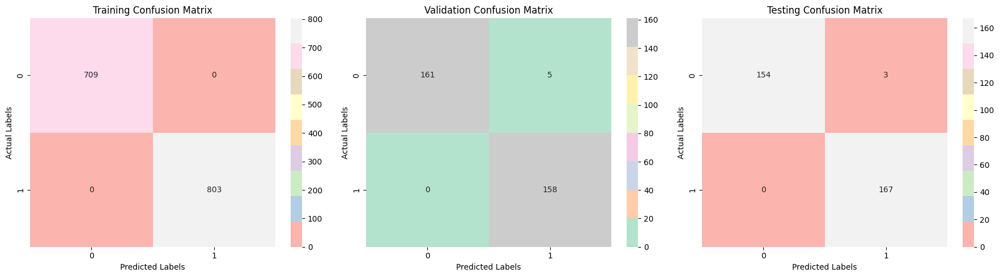

11/11 [==============================] - 1s 67ms/step
Training Set:
Accuracy: 1.0
F1 Score: 1.0
Loss: 0.00826365128159523
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       709
           1       1.00      1.00      1.00       803

    accuracy                           1.00      1512
   macro avg       1.00      1.00      1.00      1512
weighted avg       1.00      1.00      1.00      1512



Validation Set:
Accuracy: 0.9845679012345679
F1 Score: 0.9844236760124611
Loss: 0.0671682208776474
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.97      0.98       166
           1       0.97      1.00      0.98       158

    accuracy                           0.98       324
   macro avg       0.98      0.98      0.98       324
weighted avg       0.99      0.98      0.98       324



Test Set:
Accuracy: 0.9907407407407407
F1 Score: 0.9910979228486646
Loss: 0

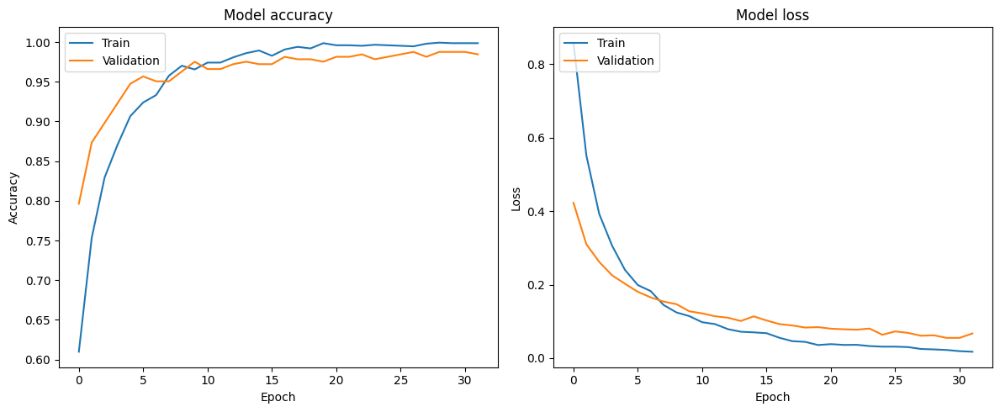

In [26]:
# InceptionV3
inception_results = build_and_train_model(X_train, y_train, X_val, y_val, X_test, y_test, 'InceptionV3',batch_size=100, epochs=32, learning_rate=0.0001)

## InceptionResNetV2

The InceptionResNetV2_Model function is intended for image classification tasks using the InceptionResNetV2 architecture. It takes in training, validation, and test data along with a pre-initialized InceptionResNetV2 model. The function then configures the model with an Adam optimizer using a binary cross-entropy loss function and accuracy as the metric. It fits the model to the provided training data for a specified number of epochs, utilizing the validation data for validation during training.

The function computes various evaluation metrics such as loss, accuracy, and confusion matrix for the training, validation, and test sets. Finally, it returns these evaluation metrics along with the trained model for further analysis.

219055592/219055592 [==============================] - 1s 0us/step
Epoch 1/32
16/16 [==============================] - 23s 806ms/step - loss: 0.9342 - accuracy: 0.5648 - val_loss: 0.5182 - val_accuracy: 0.7623
Epoch 2/32
16/16 [==============================] - 8s 535ms/step - loss: 0.6578 - accuracy: 0.7024 - val_loss: 0.4387 - val_accuracy: 0.8210
Epoch 3/32
16/16 [==============================] - 9s 555ms/step - loss: 0.5001 - accuracy: 0.7698 - val_loss: 0.3603 - val_accuracy: 0.8673
Epoch 4/32
16/16 [==============================] - 9s 538ms/step - loss: 0.3960 - accuracy: 0.8261 - val_loss: 0.3140 - val_accuracy: 0.8735
Epoch 5/32
16/16 [==============================] - 9s 548ms/step - loss: 0.3414 - accuracy: 0.8624 - val_loss: 0.2823 - val_accuracy: 0.9012
Epoch 6/32
16/16 [==============================] - 8s 518ms/step - loss: 0.3074 - accuracy: 0.8790 - val_loss: 0.2765 - val_accuracy: 0.9043
Epoch 7/32
16/16 [==============================] - 8s 527ms/step - loss: 0.2659

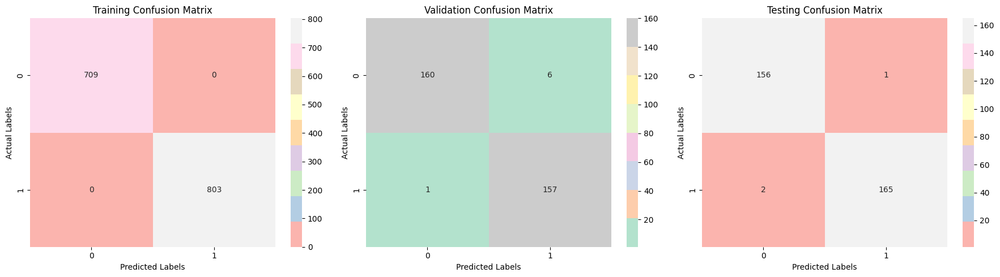

11/11 [==============================] - 2s 164ms/step
Training Set:
Accuracy: 1.0
F1 Score: 1.0
Loss: 0.026120150461792946
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       709
           1       1.00      1.00      1.00       803

    accuracy                           1.00      1512
   macro avg       1.00      1.00      1.00      1512
weighted avg       1.00      1.00      1.00      1512



Validation Set:
Accuracy: 0.9783950617283951
F1 Score: 0.9781931464174455
Loss: 0.09443899989128113
Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.96      0.98       166
           1       0.96      0.99      0.98       158

    accuracy                           0.98       324
   macro avg       0.98      0.98      0.98       324
weighted avg       0.98      0.98      0.98       324



Test Set:
Accuracy: 0.9907407407407407
F1 Score: 0.990990990990991
Loss:

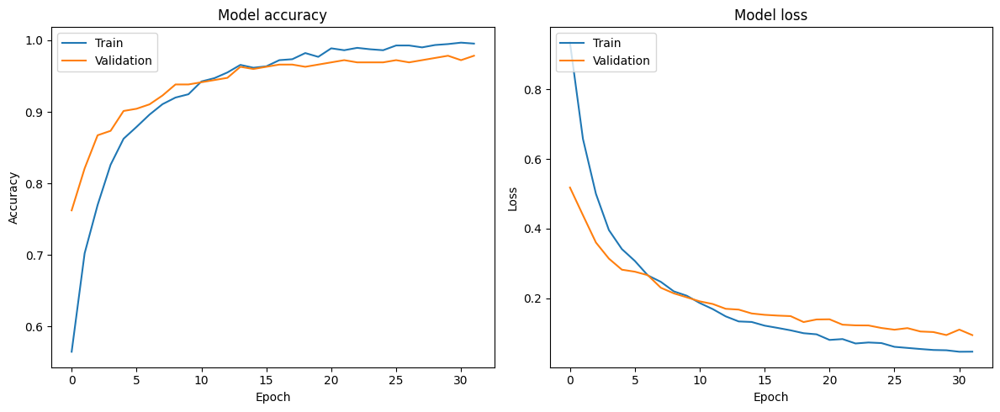

In [27]:
# InceptionResNetV2
inception_resnet_results = build_and_train_model(X_train, y_train, X_val, y_val, X_test, y_test, 'InceptionResNetV2',batch_size=100, epochs=32, learning_rate=0.0001)

## MobileNetV2

MobileNetV2 is a lightweight deep learning model designed for efficient deployment on resource-constrained devices like mobile phones and embedded systems. It leverages depth-wise separable convolutions to reduce computational complexity while maintaining high accuracy in image recognition tasks. This architecture allows MobileNetV2 to achieve state-of-the-art performance on various tasks, making it a popular choice for mobile applications requiring real-time image processing. Its compact size and impressive performance make it a versatile option for a wide range of computer vision applications on devices with limited computational resources.

9406464/9406464 [==============================] - 0s 0us/step
Epoch 1/32
16/16 [==============================] - 7s 242ms/step - loss: 0.7366 - accuracy: 0.6124 - val_loss: 0.4766 - val_accuracy: 0.8179
Epoch 2/32
16/16 [==============================] - 3s 183ms/step - loss: 0.5057 - accuracy: 0.7546 - val_loss: 0.3635 - val_accuracy: 0.8704
Epoch 3/32
16/16 [==============================] - 3s 195ms/step - loss: 0.4068 - accuracy: 0.8234 - val_loss: 0.2892 - val_accuracy: 0.9043
Epoch 4/32
16/16 [==============================] - 3s 198ms/step - loss: 0.3186 - accuracy: 0.8770 - val_loss: 0.2457 - val_accuracy: 0.9321
Epoch 5/32
16/16 [==============================] - 3s 203ms/step - loss: 0.2703 - accuracy: 0.9028 - val_loss: 0.2136 - val_accuracy: 0.9414
Epoch 6/32
16/16 [==============================] - 3s 198ms/step - loss: 0.2336 - accuracy: 0.9226 - val_loss: 0.1850 - val_accuracy: 0.9691
Epoch 7/32
16/16 [==============================] - 3s 195ms/step - loss: 0.1958 - ac

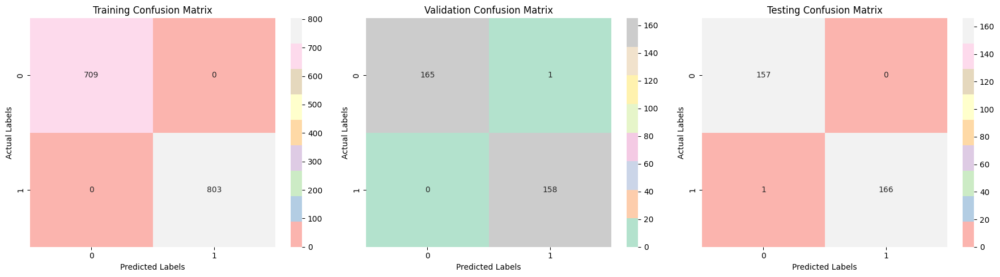

11/11 [==============================] - 0s 44ms/step
Training Set:
Accuracy: 1.0
F1 Score: 1.0
Loss: 0.013167405501008034
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       709
           1       1.00      1.00      1.00       803

    accuracy                           1.00      1512
   macro avg       1.00      1.00      1.00      1512
weighted avg       1.00      1.00      1.00      1512



Validation Set:
Accuracy: 0.9969135802469136
F1 Score: 0.9968454258675079
Loss: 0.03181229531764984
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       166
           1       0.99      1.00      1.00       158

    accuracy                           1.00       324
   macro avg       1.00      1.00      1.00       324
weighted avg       1.00      1.00      1.00       324



Test Set:
Accuracy: 0.9969135802469136
F1 Score: 0.996996996996997
Loss: 

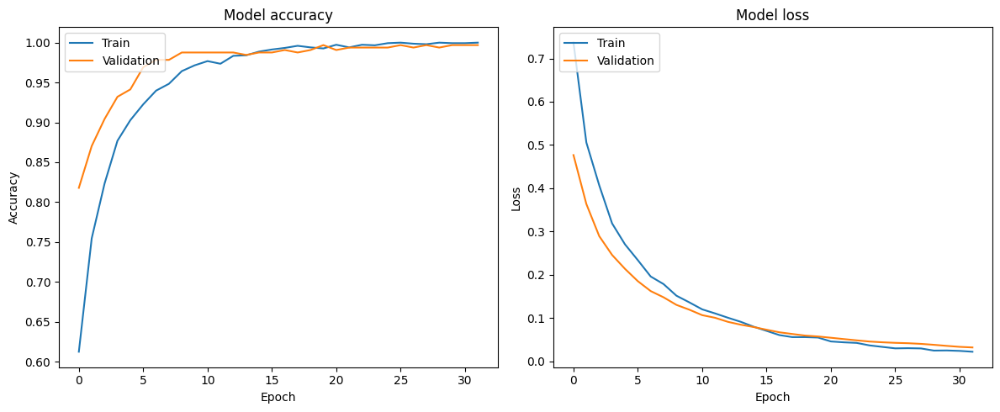

In [28]:
# MobileNetV2
mobilenet_results = build_and_train_model(X_train, y_train, X_val, y_val, X_test, y_test, 'MobileNetV2',batch_size=100, epochs=32, learning_rate=0.0001)

## Yolo v8

YOLO (You Only Look Once) v8 is a state-of-the-art binary classification model. It uses a single pass through the network to simultaneously detect and classify objects. YOLO v8 achieves exceptional speed and accuracy by dividing the image into a grid, predicting bounding boxes and class probabilities. This allows for real-time performance in applications like object recognition.

In [ ]:
# !pip install ultralytics

In [ ]:
import os
from ultralytics import YOLO
from PIL import Image

the_object='shoe'
dir="E:\YoloCVShenhapy"

In [ ]:
train_data, temp_data = train_test_split(df_copy, test_size=0.3, random_state=42, shuffle=True)
val_data, test_data = train_test_split(temp_data, test_size=0.5, random_state=42, shuffle=True)

In [ ]:
def creat_directory(base_dir,the_object):
    # Creating Folders for yolo
    os.makedirs(the_object, exist_ok=True)

    classes = ['True', 'False']

    # Define the split types (train, test, val)
    splits = ['train', 'test', 'val']

    # Create directories
    for split in splits:
        split_dir = os.path.join(base_dir, the_object, split)
        os.makedirs(split_dir, exist_ok=True)
        for class_name in classes:
            class_dir = os.path.join(split_dir, class_name)
            os.makedirs(class_dir, exist_ok=True)

def save_images(base_dir, data, split_type, the_object):
    for index, row in data.iterrows():
        img_array = row['img']
        class_label = row['z']

        class_name = 'True' if class_label == 1 else 'False'

        image_filename = f"{class_name}_{index}.jpg"
        image_path = os.path.join(base_dir, the_object, split_type, class_name, image_filename)

        image_filename = f"{class_name}_{index}.jpg"
        image_path = os.path.join(base_dir, the_object, split_type, class_name, image_filename)

        image = Image.fromarray(img_array)
        image.save(image_path)
    print(image_path)

def calculate_cm(true, false):
    counts=[]
    for result in true:
        probs = result.probs.data.tolist()
        # print(probs)
        index = probs.index(max(probs))
        counts.append(index)
    TP = counts.count(1)
    FN = counts.count(0)

    counts1=[]
    for result in false:
        probs = result.probs.data.tolist()
        # print(probs)
        index = probs.index(max(probs))
        counts1.append(index)
    TN = counts1.count(0)
    FP = counts1.count(1)

    confusion_matrix_data = [[TN, FP], [FN, TP]]

    print("TP:",TP)
    print("FP:",FP)
    print("TN:",TN)
    print("FN:",FN)

    return TP, TN, FP, FN


def plot_confusion_matrix1(TP, TN, FP, FN):
    confusion_matrix = np.array([[TN, FN],
                                    [FP, TP]])

    plt.imshow(confusion_matrix, interpolation='nearest', cmap=plt.cm.Pastel2)
    plt.title("Confusion Matrix")
    plt.colorbar()

    tick_marks_y = np.arange(2)
    plt.yticks(tick_marks_y, ["0", "1"], rotation=0)

    tick_marks_x = np.arange(2)
    plt.xticks(tick_marks_x, ["0", "1"], rotation=0)

    plt.xlabel("Predicted")
    plt.ylabel("Actual")

    for i in range(2):
        for j in range(2):
            plt.text(j, i, str(confusion_matrix[i, j]), horizontalalignment="center", color="black")

    plt.tight_layout()
    plt.show()

In [ ]:
def yolov8(dir, the_object, train_data, val_data, test_data):
    creat_directory(dir, the_object)
    # Save images for train, validation,z and test sets
    save_images(dir, train_data, 'train', the_object)
    save_images(dir, val_data, 'val', the_object)
    save_images(dir, test_data, 'test', the_object)

    # Load a model
    model = YOLO("yolov8n-cls.pt")  # load a pretained model

    # Use the model
    start_time = time.time()
    data = os.path.join(dir, the_object)
    results = model.train(data=data, epochs=6, imgsz=128)  # train the model
    end_time = time.time()
    training_time = end_time - start_time

    print("Training Time:", training_time)

def yolo_eval(best, dir, the_object,):
    model = YOLO(best)  # load a custom model

    # Predict with the model
    Train_True = os.path.join(dir, the_object, 'train', 'True')
    Train_False = os.path.join(dir, the_object, 'train', 'False')
    val_True = os.path.join(dir, the_object, 'val', 'True')
    val_False = os.path.join(dir, the_object, 'val', 'False')
    Test_True = os.path.join(dir, the_object, 'test', 'True')
    Test_False = os.path.join(dir, the_object, 'test', 'False')

    # shoe_train = model(Train_True)  # predict on an image
    # no_shoe_train = model(Train_False)  # predict on an image

    # shoe_val = model(val_True)  # predict on an image
    # no_shoe_val = model(val_False)  # predict on an image

    start_time = time.time()
    shoe_test = model(Test_True)  # predict on an image
    no_shoe_test = model(Test_False)  # predict on an image
    end_time = time.time()
    predict_time = end_time - start_time


    print("Prediction Time:", predict_time)

    TP, TN, FP, FN = calculate_cm(shoe_test, no_shoe_test)

    plot_confusion_matrix1(TP, TN, FP, FN)

    # Calculate Accuracy
    accuracy = (TP + TN) / (TP + TN + FP + FN)

    # Calculate Precision
    precision = TP / (TP + FP)

    # Calculate Recall
    recall = TP / (TP + FN)

    # Calculate F1-Score
    f1 = (2 * precision * recall) / (precision + recall)

    print("Test Accuracy:", accuracy)
    print("Test Recall:", recall)
    print("Test Precision:", precision)
    print("Test F1-score:", f1)

In [ ]:
yolov8(dir, the_object, train_data, val_data, test_data)

In [ ]:
best_dir= r"E:\OneDrive - University of Ottawa\CV\CV Project\3abilation\All Colab RUN\runs\classify\train\weights\best.pt"

yolo_eval(best_dir, dir, the_object)


image 1/167 e:\content\drive\MyDrive\Data\CV\shoe\test\True\True_105.jpg: 128x128 True 1.00, False 0.00, 5.0ms
image 2/167 e:\content\drive\MyDrive\Data\CV\shoe\test\True\True_1085.jpg: 128x128 True 1.00, False 0.00, 5.0ms
image 3/167 e:\content\drive\MyDrive\Data\CV\shoe\test\True\True_1087.jpg: 128x128 True 1.00, False 0.00, 4.0ms
image 4/167 e:\content\drive\MyDrive\Data\CV\shoe\test\True\True_1090.jpg: 128x128 True 1.00, False 0.00, 4.0ms
image 5/167 e:\content\drive\MyDrive\Data\CV\shoe\test\True\True_1100.jpg: 128x128 True 1.00, False 0.00, 7.0ms
image 6/167 e:\content\drive\MyDrive\Data\CV\shoe\test\True\True_1102.jpg: 128x128 True 1.00, False 0.00, 6.0ms
image 7/167 e:\content\drive\MyDrive\Data\CV\shoe\test\True\True_1132.jpg: 128x128 True 1.00, False 0.00, 4.0ms
image 8/167 e:\content\drive\MyDrive\Data\CV\shoe\test\True\True_1133.jpg: 128x128 True 1.00, False 0.00, 5.0ms
image 9/167 e:\content\drive\MyDrive\Data\CV\shoe\test\True\True_1134.jpg: 128x128 True 1.00, False 0.00

Prediction Time: 4.998944520950317
TP: 167
FP: 0
TN: 157
FN: 0


<Figure size 640x480 with 2 Axes>

Test Accuracy: 1.0
Test Recall: 1.0
Test Precision: 1.0
Test F1-score: 1.0


# Conclusion: Combined Model Performance Summary and Analysis

We have comprehensively trained and evaluated a suite of models for our binary classification task. Below is a synthesis of their performance metrics and our analytical conclusions:

| Model             | F1-Score  | Accuracy | Loss    | TN  | FP | FN | TP | Early Stopping |
|-------------------|-----------|----------|---------|-----|----|----|----|----------------|
| **ResNet50**      | 70.92%    | 71.91%   | 0.567   | 12  | 35 | 56 | 111| 32/32          |
| **InceptionV3**   | 99.39%    | 99.38%   | 0.01528 | 15  | 0  | 2  | 165| 20/32          |
| **InceptionResNetV2** | 99.7%  | 99.69%   | 0.0268  | 157 | 0  | 1  | 166| 32/32          |
| **MobileNetV2**   | 99.7%     | 99.69%   | 0.025   | 15  | 6  | 0  | 167| 32/32          |
| **YoloV8n**       | 100%      | 100%     | 0.0023  | 157 | 0  | 0  | 167| 6/32           |
| **YoloV8s**       | 100%      | 100%     | 0.0017  | 157 | 0  | 0  | 167| 6/32           |

### Model Efficiency
- **Training Time**: The YoloV8n model is the quickest, followed by YoloV8s. Inception models and ResNet50 require more time, hinting at greater computational demands.
- **Evaluation Time**: On test data evaluation, all models excel with Yolo models leading by a slight margin.

### Model Effectiveness
- **F1-Score & Accuracy**: The Inception and MobileNetV2 models showcase exemplary F1-scores and accuracy, suggesting highly precise and reliable performance. Yolo models achieve perfect scores, warranting additional scrutiny for potential overfitting.
- **Loss**: The Inception and MobileNetV2 models exhibit impressively low loss, indicative of excellent generalization. ResNet50's higher loss suggests areas for optimization.

### Testing Performance Metrics
- **Confusion Matrix**: Yolo models achieve flawless classification. Inception models follow with superior performance and minimal false classifications. ResNet50 could improve on reducing false negatives.
- **Epochs to Early Stopping**: InceptionV3 demonstrates quick learning, stopping early. ResNet50 takes advantage of the full epoch allotment, revealing a different learning pattern.

### Final Observations
- **Inception and MobileNetV2**: These models balance training efficiency with high accuracy, making them suitable for practical applications.
- **Yolo Models**: While they score perfectly, we must ensure that the models are generalizing well and not merely memorizing the data.
- **ResNet50**: It shows promise as a sturdy model with potential gains from additional tuning and data augmentation strategies.

In light of these findings, Inception and MobileNetV2 models are recommended for tasks where precision and computational efficiency are paramount. Yolo models are ideal for scenarios requiring utmost accuracy, provided that their performance is validated against overfitting. ResNet50 remains a strong contender where a deeper understanding of model behavior is desired.


# Ablation Study

## Exploring Model Performance with Different Hyperparameters

### Impact of Learning Rates, Batch Sizes, and Image Sizes
In this section, we conduct an extensive ablation study to analyze the performance of the MobileNetV2 model under various combinations of learning rates, batch sizes, and image sizes. The objective is to observe how these hyperparameters influence the model's learning ability and accuracy.

- **Learning Rates Tested**: 0.0001, 0.001, 0.01, 0.1
- **Batch Sizes Tested**: 16, 32, 64, 128
- **Image Sizes Tested**: 256, 128, 64, 32

For each combination, we resize the images to the specified size, freeze the layers of the base model, add custom layers, and compile the model. We then fit the model using early stopping and plot the training and validation loss and accuracy to visually assess the model's performance.


9406464/9406464 [==============================] - 1s 0us/step
learning rate:  0.0001 batch size:  16 image shape:  256
Epoch 1/400
95/95 [==============================] - 17s 64ms/step - loss: 0.4143 - accuracy: 0.8380 - val_loss: 0.2319 - val_accuracy: 0.9660
Epoch 2/400
95/95 [==============================] - 4s 38ms/step - loss: 0.1741 - accuracy: 0.9755 - val_loss: 0.1339 - val_accuracy: 0.9784
Epoch 3/400
95/95 [==============================] - 4s 38ms/step - loss: 0.1022 - accuracy: 0.9921 - val_loss: 0.0915 - val_accuracy: 0.9877
Epoch 4/400
95/95 [==============================] - 4s 37ms/step - loss: 0.0662 - accuracy: 0.9954 - val_loss: 0.0638 - val_accuracy: 0.9877
Epoch 5/400
95/95 [==============================] - 4s 38ms/step - loss: 0.0458 - accuracy: 0.9967 - val_loss: 0.0482 - val_accuracy: 0.9938
Epoch 6/400
95/95 [==============================] - 4s 37ms/step - loss: 0.0333 - accuracy: 1.0000 - val_loss: 0.0379 - val_accuracy: 0.9969
Epoch 7/400
95/95 [========

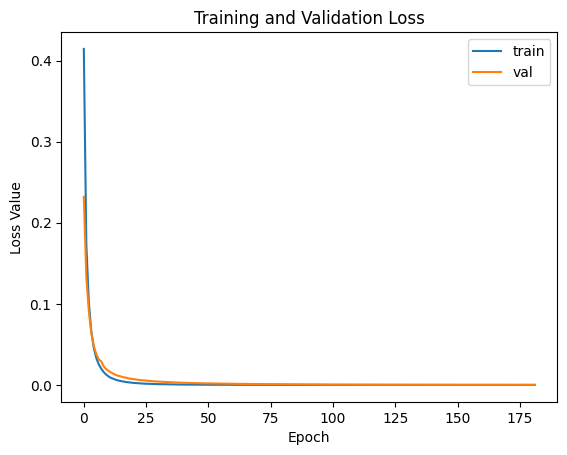

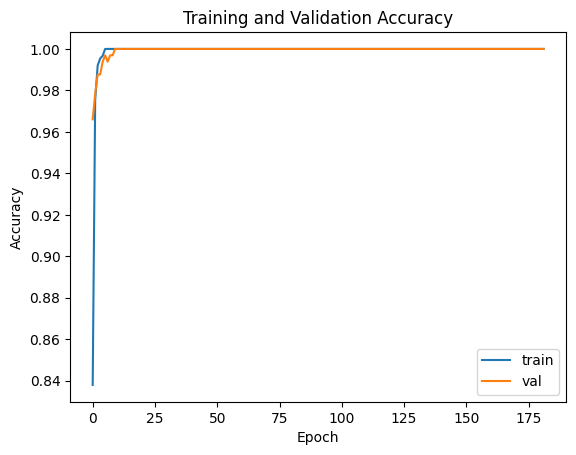

9406464/9406464 [==============================] - 1s 0us/step
learning rate:  0.0001 batch size:  16 image shape:  128
Epoch 1/400
95/95 [==============================] - 6s 33ms/step - loss: 0.4098 - accuracy: 0.8261 - val_loss: 0.2064 - val_accuracy: 0.9475
Epoch 2/400
95/95 [==============================] - 1s 16ms/step - loss: 0.1563 - accuracy: 0.9735 - val_loss: 0.1307 - val_accuracy: 0.9753
Epoch 3/400
95/95 [==============================] - 1s 16ms/step - loss: 0.0844 - accuracy: 0.9940 - val_loss: 0.0836 - val_accuracy: 0.9815
Epoch 4/400
95/95 [==============================] - 1s 15ms/step - loss: 0.0518 - accuracy: 0.9993 - val_loss: 0.0627 - val_accuracy: 0.9877
Epoch 5/400
95/95 [==============================] - 1s 15ms/step - loss: 0.0355 - accuracy: 1.0000 - val_loss: 0.0504 - val_accuracy: 0.9938
Epoch 6/400
95/95 [==============================] - 1s 13ms/step - loss: 0.0255 - accuracy: 1.0000 - val_loss: 0.0409 - val_accuracy: 0.9969
Epoch 7/400
95/95 [=========

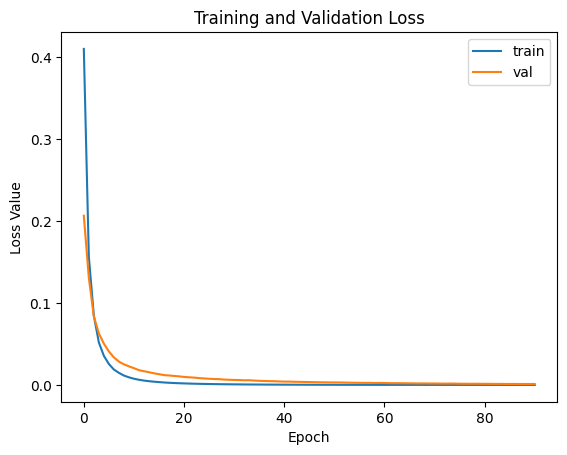

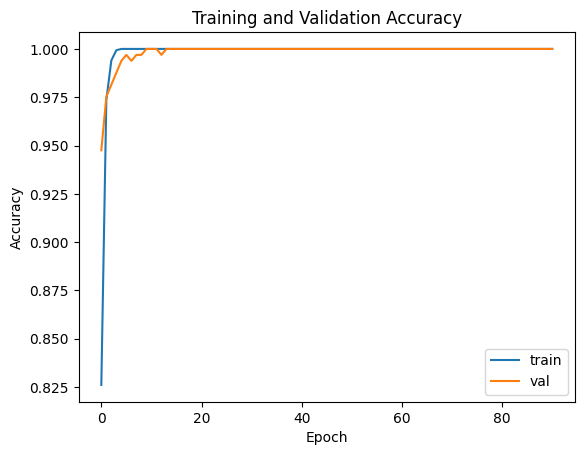

learning rate:  0.0001 batch size:  16 image shape:  64
Epoch 1/400
95/95 [==============================] - 6s 23ms/step - loss: 0.4812 - accuracy: 0.7784 - val_loss: 0.3223 - val_accuracy: 0.9136
Epoch 2/400
95/95 [==============================] - 1s 10ms/step - loss: 0.2279 - accuracy: 0.9438 - val_loss: 0.2262 - val_accuracy: 0.9383
Epoch 3/400
95/95 [==============================] - 1s 10ms/step - loss: 0.1414 - accuracy: 0.9782 - val_loss: 0.1737 - val_accuracy: 0.9537
Epoch 4/400
95/95 [==============================] - 1s 11ms/step - loss: 0.0944 - accuracy: 0.9881 - val_loss: 0.1485 - val_accuracy: 0.9568
Epoch 5/400
95/95 [==============================] - 1s 11ms/step - loss: 0.0677 - accuracy: 0.9993 - val_loss: 0.1276 - val_accuracy: 0.9630
Epoch 6/400
95/95 [==============================] - 1s 12ms/step - loss: 0.0510 - accuracy: 1.0000 - val_loss: 0.1179 - val_accuracy: 0.9660
Epoch 7/400
95/95 [==============================] - 1s 12ms/step - loss: 0.0389 - accuracy:

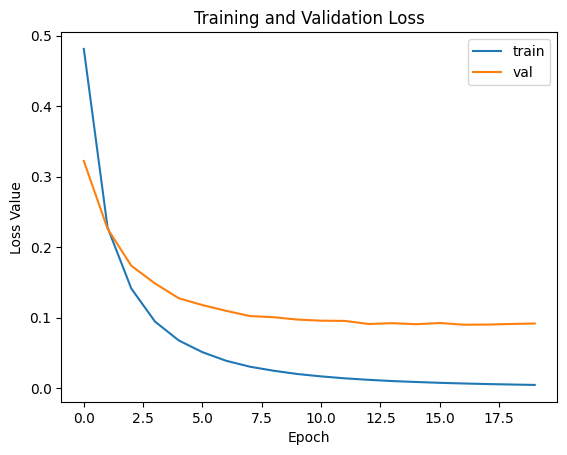

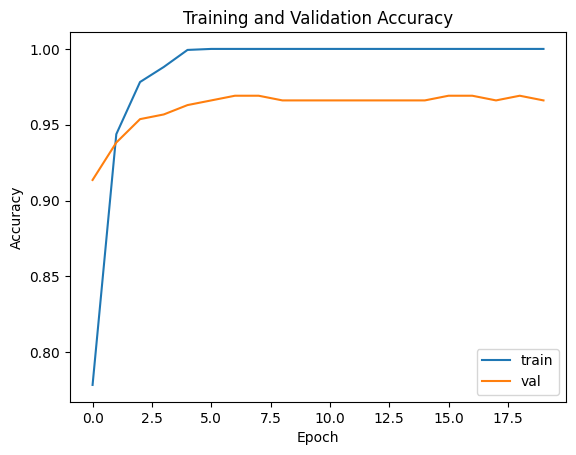

learning rate:  0.0001 batch size:  16 image shape:  32
Epoch 1/400
95/95 [==============================] - 5s 22ms/step - loss: 0.6820 - accuracy: 0.5423 - val_loss: 0.6758 - val_accuracy: 0.5340
Epoch 2/400
95/95 [==============================] - 1s 10ms/step - loss: 0.6623 - accuracy: 0.5747 - val_loss: 0.6616 - val_accuracy: 0.5772
Epoch 3/400
95/95 [==============================] - 1s 10ms/step - loss: 0.6478 - accuracy: 0.5999 - val_loss: 0.6472 - val_accuracy: 0.6204
Epoch 4/400
95/95 [==============================] - 1s 10ms/step - loss: 0.6348 - accuracy: 0.6343 - val_loss: 0.6355 - val_accuracy: 0.6420
Epoch 5/400
95/95 [==============================] - 1s 11ms/step - loss: 0.6225 - accuracy: 0.6567 - val_loss: 0.6225 - val_accuracy: 0.6667
Epoch 6/400
95/95 [==============================] - 1s 10ms/step - loss: 0.6115 - accuracy: 0.6653 - val_loss: 0.6096 - val_accuracy: 0.6728
Epoch 7/400
95/95 [==============================] - 1s 11ms/step - loss: 0.6006 - accuracy:

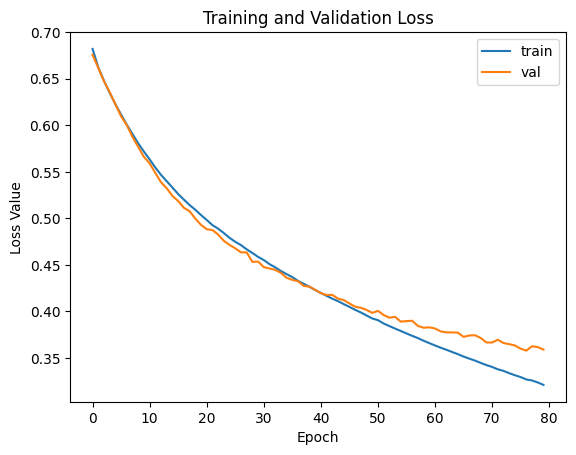

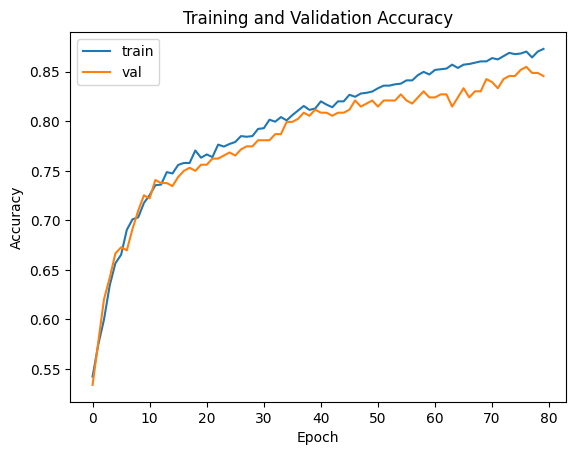

learning rate:  0.0001 batch size:  32 image shape:  256
Epoch 1/400
48/48 [==============================] - 8s 99ms/step - loss: 0.5414 - accuracy: 0.7149 - val_loss: 0.3970 - val_accuracy: 0.8426
Epoch 2/400
48/48 [==============================] - 3s 67ms/step - loss: 0.3595 - accuracy: 0.8611 - val_loss: 0.3168 - val_accuracy: 0.8827
Epoch 3/400
48/48 [==============================] - 3s 68ms/step - loss: 0.2776 - accuracy: 0.9187 - val_loss: 0.2706 - val_accuracy: 0.9167
Epoch 4/400
48/48 [==============================] - 3s 69ms/step - loss: 0.2326 - accuracy: 0.9378 - val_loss: 0.2298 - val_accuracy: 0.9383
Epoch 5/400
48/48 [==============================] - 3s 67ms/step - loss: 0.1924 - accuracy: 0.9530 - val_loss: 0.2089 - val_accuracy: 0.9414
Epoch 6/400
48/48 [==============================] - 3s 68ms/step - loss: 0.1634 - accuracy: 0.9709 - val_loss: 0.1883 - val_accuracy: 0.9537
Epoch 7/400
48/48 [==============================] - 3s 68ms/step - loss: 0.1408 - accuracy

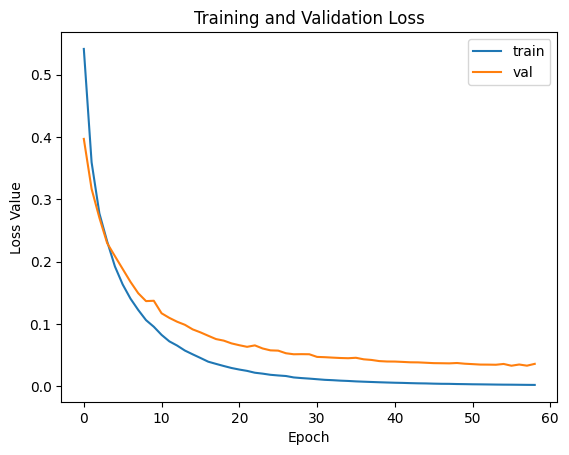

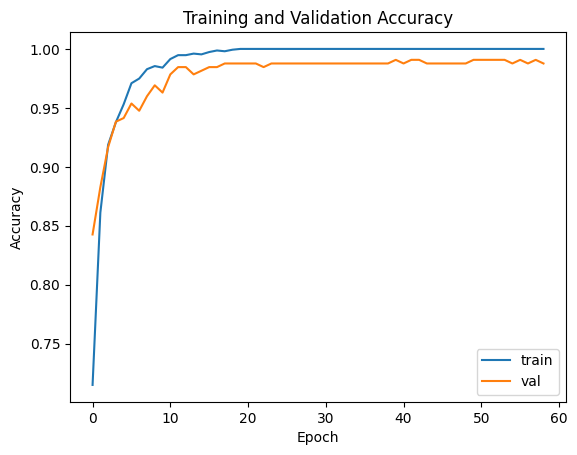

learning rate:  0.0001 batch size:  32 image shape:  128
Epoch 1/400
48/48 [==============================] - 6s 43ms/step - loss: 0.5443 - accuracy: 0.7149 - val_loss: 0.3945 - val_accuracy: 0.8333
Epoch 2/400
48/48 [==============================] - 1s 24ms/step - loss: 0.3220 - accuracy: 0.9008 - val_loss: 0.2924 - val_accuracy: 0.8951
Epoch 3/400
48/48 [==============================] - 1s 24ms/step - loss: 0.2332 - accuracy: 0.9372 - val_loss: 0.2257 - val_accuracy: 0.9414
Epoch 4/400
48/48 [==============================] - 1s 23ms/step - loss: 0.1808 - accuracy: 0.9676 - val_loss: 0.1856 - val_accuracy: 0.9630
Epoch 5/400
48/48 [==============================] - 1s 24ms/step - loss: 0.1442 - accuracy: 0.9788 - val_loss: 0.1603 - val_accuracy: 0.9630
Epoch 6/400
48/48 [==============================] - 1s 23ms/step - loss: 0.1175 - accuracy: 0.9854 - val_loss: 0.1398 - val_accuracy: 0.9722
Epoch 7/400
48/48 [==============================] - 1s 23ms/step - loss: 0.0968 - accuracy

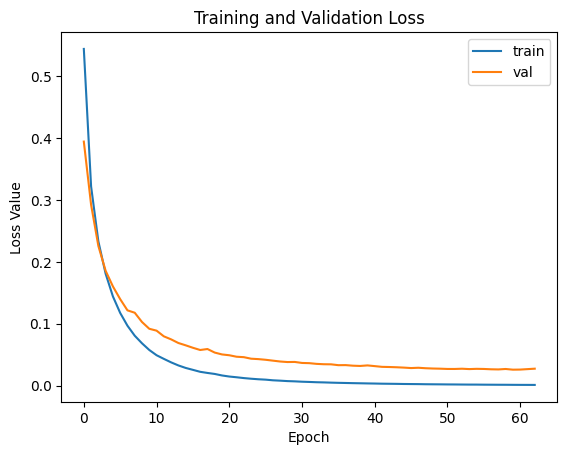

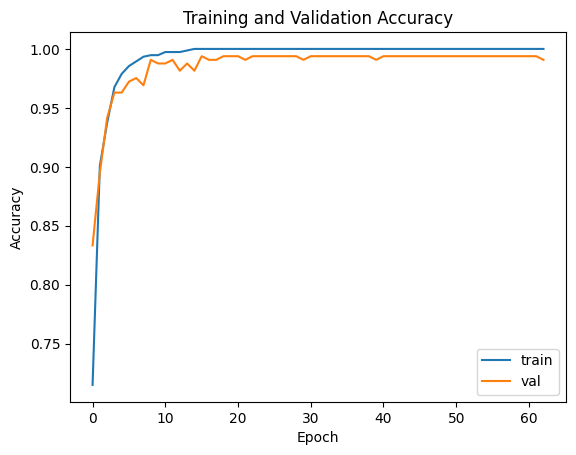

learning rate:  0.0001 batch size:  32 image shape:  64
Epoch 1/400
48/48 [==============================] - 4s 28ms/step - loss: 0.5905 - accuracy: 0.6944 - val_loss: 0.4794 - val_accuracy: 0.8179
Epoch 2/400
48/48 [==============================] - 0s 10ms/step - loss: 0.3551 - accuracy: 0.9008 - val_loss: 0.3462 - val_accuracy: 0.8765
Epoch 3/400
48/48 [==============================] - 0s 10ms/step - loss: 0.2548 - accuracy: 0.9458 - val_loss: 0.2849 - val_accuracy: 0.9043
Epoch 4/400
48/48 [==============================] - 0s 10ms/step - loss: 0.1966 - accuracy: 0.9663 - val_loss: 0.2268 - val_accuracy: 0.9321
Epoch 5/400
48/48 [==============================] - 0s 10ms/step - loss: 0.1579 - accuracy: 0.9775 - val_loss: 0.2023 - val_accuracy: 0.9475
Epoch 6/400
48/48 [==============================] - 0s 10ms/step - loss: 0.1306 - accuracy: 0.9835 - val_loss: 0.1794 - val_accuracy: 0.9568
Epoch 7/400
48/48 [==============================] - 0s 10ms/step - loss: 0.1078 - accuracy:

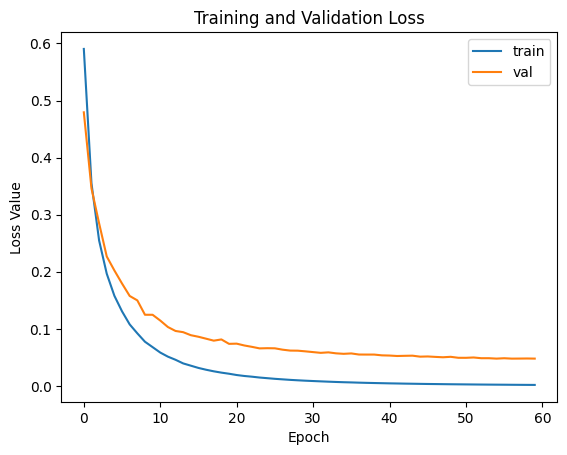

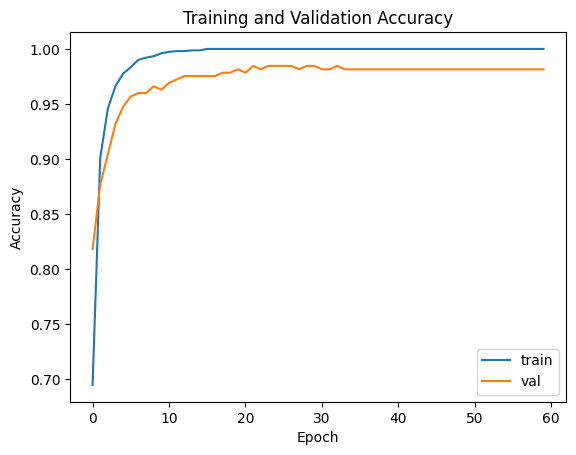

learning rate:  0.0001 batch size:  32 image shape:  32
Epoch 1/400
48/48 [==============================] - 5s 29ms/step - loss: 0.6832 - accuracy: 0.5344 - val_loss: 0.6840 - val_accuracy: 0.4877
Epoch 2/400
48/48 [==============================] - 1s 11ms/step - loss: 0.6710 - accuracy: 0.5417 - val_loss: 0.6736 - val_accuracy: 0.5123
Epoch 3/400
48/48 [==============================] - 1s 11ms/step - loss: 0.6611 - accuracy: 0.5721 - val_loss: 0.6631 - val_accuracy: 0.5525
Epoch 4/400
48/48 [==============================] - 1s 12ms/step - loss: 0.6515 - accuracy: 0.6190 - val_loss: 0.6539 - val_accuracy: 0.6173
Epoch 5/400
48/48 [==============================] - 1s 12ms/step - loss: 0.6427 - accuracy: 0.6515 - val_loss: 0.6453 - val_accuracy: 0.6481
Epoch 6/400
48/48 [==============================] - 1s 12ms/step - loss: 0.6343 - accuracy: 0.6667 - val_loss: 0.6360 - val_accuracy: 0.6790
Epoch 7/400
48/48 [==============================] - 1s 12ms/step - loss: 0.6264 - accuracy:

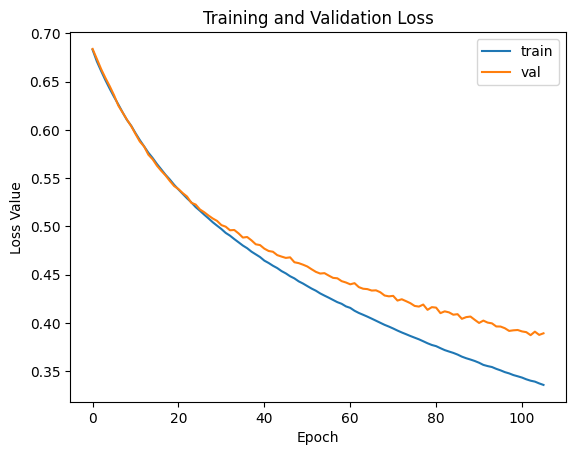

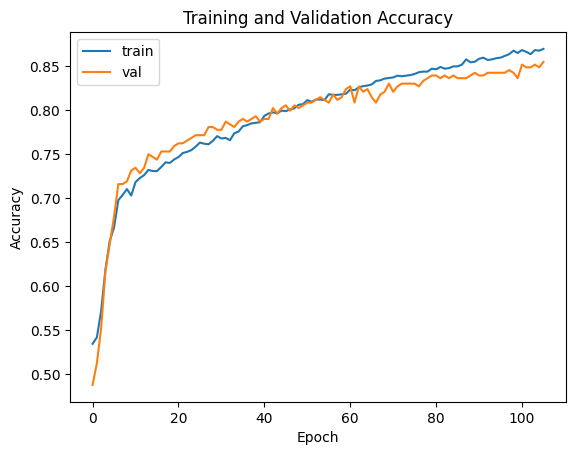

learning rate:  0.0001 batch size:  64 image shape:  256
Epoch 1/400
24/24 [==============================] - 9s 220ms/step - loss: 0.6323 - accuracy: 0.6627 - val_loss: 0.4966 - val_accuracy: 0.7901
Epoch 2/400
24/24 [==============================] - 3s 129ms/step - loss: 0.4861 - accuracy: 0.8042 - val_loss: 0.4239 - val_accuracy: 0.8488
Epoch 3/400
24/24 [==============================] - 3s 129ms/step - loss: 0.4186 - accuracy: 0.8433 - val_loss: 0.3851 - val_accuracy: 0.8611
Epoch 4/400
24/24 [==============================] - 3s 128ms/step - loss: 0.3734 - accuracy: 0.8631 - val_loss: 0.3430 - val_accuracy: 0.8889
Epoch 5/400
24/24 [==============================] - 3s 129ms/step - loss: 0.3335 - accuracy: 0.8796 - val_loss: 0.3151 - val_accuracy: 0.8981
Epoch 6/400
24/24 [==============================] - 3s 129ms/step - loss: 0.3054 - accuracy: 0.8988 - val_loss: 0.2946 - val_accuracy: 0.9105
Epoch 7/400
24/24 [==============================] - 3s 130ms/step - loss: 0.2811 - a

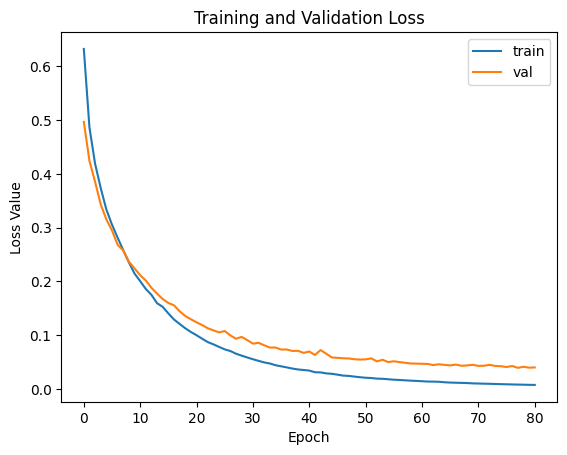

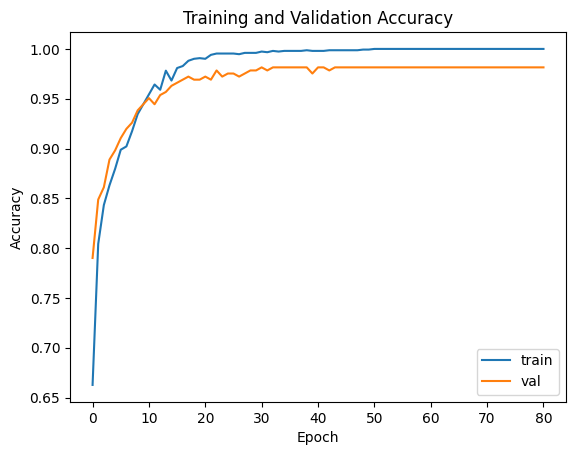

learning rate:  0.0001 batch size:  64 image shape:  128
Epoch 1/400
24/24 [==============================] - 5s 99ms/step - loss: 0.5643 - accuracy: 0.7143 - val_loss: 0.4380 - val_accuracy: 0.7963
Epoch 2/400
24/24 [==============================] - 1s 39ms/step - loss: 0.4019 - accuracy: 0.8294 - val_loss: 0.3606 - val_accuracy: 0.8611
Epoch 3/400
24/24 [==============================] - 1s 38ms/step - loss: 0.3347 - accuracy: 0.8796 - val_loss: 0.2985 - val_accuracy: 0.8920
Epoch 4/400
24/24 [==============================] - 1s 38ms/step - loss: 0.2836 - accuracy: 0.9048 - val_loss: 0.2587 - val_accuracy: 0.9259
Epoch 5/400
24/24 [==============================] - 1s 37ms/step - loss: 0.2450 - accuracy: 0.9239 - val_loss: 0.2399 - val_accuracy: 0.9352
Epoch 6/400
24/24 [==============================] - 1s 38ms/step - loss: 0.2165 - accuracy: 0.9511 - val_loss: 0.2152 - val_accuracy: 0.9383
Epoch 7/400
24/24 [==============================] - 1s 37ms/step - loss: 0.1896 - accuracy

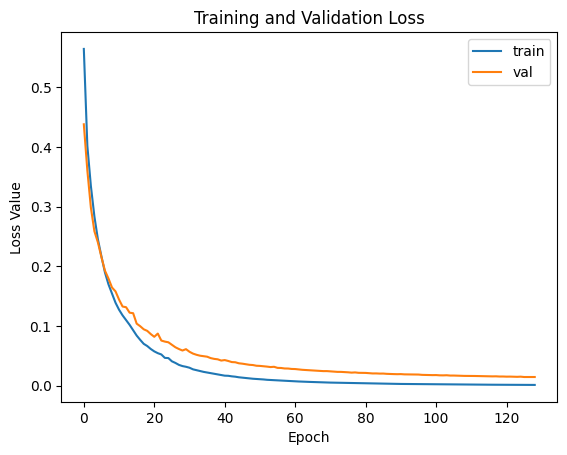

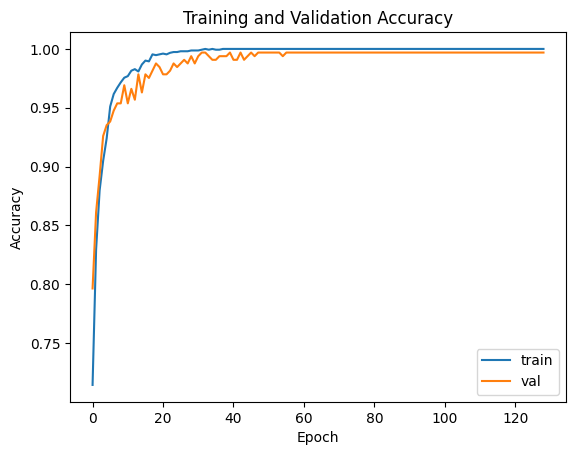

learning rate:  0.0001 batch size:  64 image shape:  64
Epoch 1/400
24/24 [==============================] - 5s 64ms/step - loss: 0.6962 - accuracy: 0.6058 - val_loss: 0.5283 - val_accuracy: 0.7315
Epoch 2/400
24/24 [==============================] - 0s 16ms/step - loss: 0.4624 - accuracy: 0.8089 - val_loss: 0.4502 - val_accuracy: 0.8272
Epoch 3/400
24/24 [==============================] - 0s 16ms/step - loss: 0.3662 - accuracy: 0.8869 - val_loss: 0.3668 - val_accuracy: 0.8827
Epoch 4/400
24/24 [==============================] - 0s 16ms/step - loss: 0.2982 - accuracy: 0.9365 - val_loss: 0.3218 - val_accuracy: 0.9259
Epoch 5/400
24/24 [==============================] - 0s 16ms/step - loss: 0.2474 - accuracy: 0.9603 - val_loss: 0.2808 - val_accuracy: 0.9259
Epoch 6/400
24/24 [==============================] - 0s 16ms/step - loss: 0.2121 - accuracy: 0.9676 - val_loss: 0.2544 - val_accuracy: 0.9383
Epoch 7/400
24/24 [==============================] - 0s 17ms/step - loss: 0.1812 - accuracy:

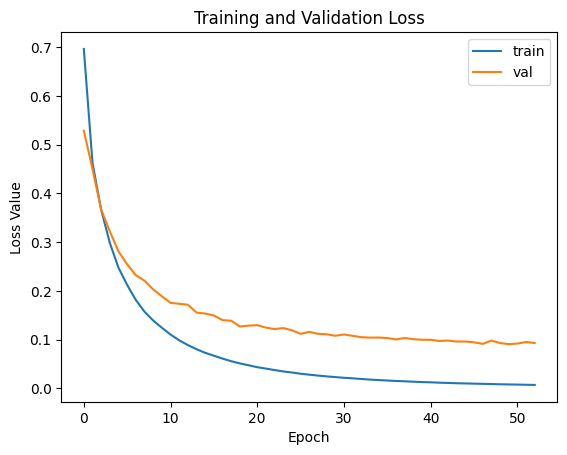

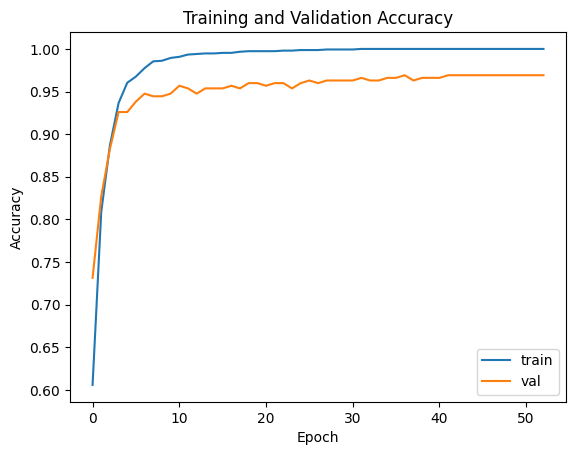

learning rate:  0.0001 batch size:  64 image shape:  32
Epoch 1/400
24/24 [==============================] - 4s 56ms/step - loss: 0.6831 - accuracy: 0.5648 - val_loss: 0.6833 - val_accuracy: 0.5123
Epoch 2/400
24/24 [==============================] - 0s 10ms/step - loss: 0.6725 - accuracy: 0.5569 - val_loss: 0.6768 - val_accuracy: 0.5309
Epoch 3/400
24/24 [==============================] - 0s 11ms/step - loss: 0.6640 - accuracy: 0.5926 - val_loss: 0.6688 - val_accuracy: 0.5617
Epoch 4/400
24/24 [==============================] - 0s 11ms/step - loss: 0.6558 - accuracy: 0.6085 - val_loss: 0.6614 - val_accuracy: 0.6080
Epoch 5/400
24/24 [==============================] - 0s 11ms/step - loss: 0.6483 - accuracy: 0.6442 - val_loss: 0.6533 - val_accuracy: 0.6636
Epoch 6/400
24/24 [==============================] - 0s 11ms/step - loss: 0.6410 - accuracy: 0.6634 - val_loss: 0.6469 - val_accuracy: 0.6698
Epoch 7/400
24/24 [==============================] - 0s 11ms/step - loss: 0.6344 - accuracy:

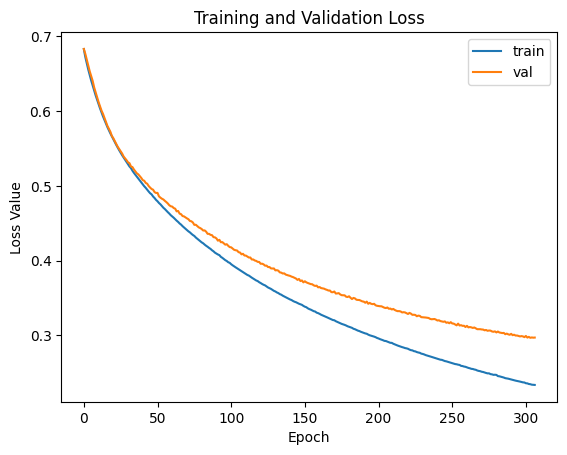

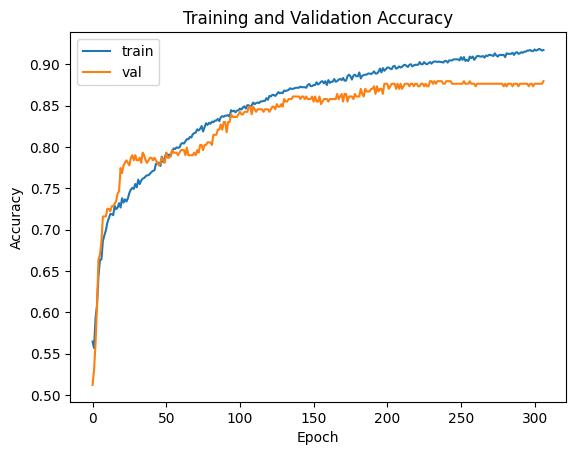

learning rate:  0.0001 batch size:  128 image shape:  256
Epoch 1/400
12/12 [==============================] - 11s 627ms/step - loss: 0.6415 - accuracy: 0.6329 - val_loss: 0.5654 - val_accuracy: 0.6790
Epoch 2/400
12/12 [==============================] - 3s 253ms/step - loss: 0.5583 - accuracy: 0.7427 - val_loss: 0.5015 - val_accuracy: 0.7994
Epoch 3/400
12/12 [==============================] - 3s 253ms/step - loss: 0.5091 - accuracy: 0.7890 - val_loss: 0.4689 - val_accuracy: 0.8272
Epoch 4/400
12/12 [==============================] - 3s 252ms/step - loss: 0.4745 - accuracy: 0.8022 - val_loss: 0.4450 - val_accuracy: 0.8457
Epoch 5/400
12/12 [==============================] - 3s 255ms/step - loss: 0.4467 - accuracy: 0.8181 - val_loss: 0.4199 - val_accuracy: 0.8457
Epoch 6/400
12/12 [==============================] - 3s 254ms/step - loss: 0.4268 - accuracy: 0.8419 - val_loss: 0.4032 - val_accuracy: 0.8642
Epoch 7/400
12/12 [==============================] - 3s 256ms/step - loss: 0.4055 -

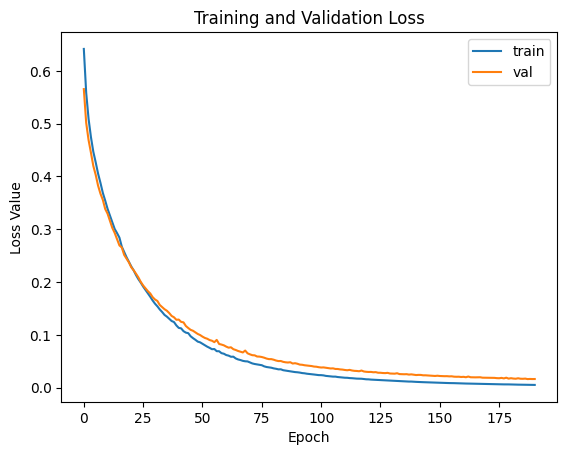

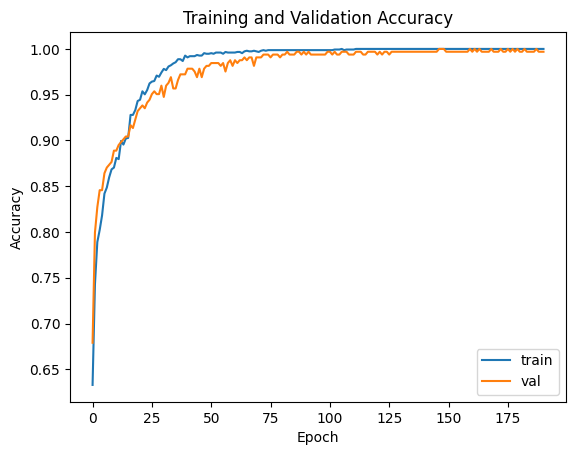

learning rate:  0.0001 batch size:  128 image shape:  128
Epoch 1/400
12/12 [==============================] - 6s 236ms/step - loss: 0.6248 - accuracy: 0.6567 - val_loss: 0.5218 - val_accuracy: 0.7747
Epoch 2/400
12/12 [==============================] - 1s 73ms/step - loss: 0.5058 - accuracy: 0.7685 - val_loss: 0.4520 - val_accuracy: 0.8056
Epoch 3/400
12/12 [==============================] - 1s 71ms/step - loss: 0.4429 - accuracy: 0.8082 - val_loss: 0.4150 - val_accuracy: 0.8395
Epoch 4/400
12/12 [==============================] - 1s 71ms/step - loss: 0.4071 - accuracy: 0.8320 - val_loss: 0.4012 - val_accuracy: 0.8117
Epoch 5/400
12/12 [==============================] - 1s 72ms/step - loss: 0.3787 - accuracy: 0.8479 - val_loss: 0.3612 - val_accuracy: 0.8673
Epoch 6/400
12/12 [==============================] - 1s 72ms/step - loss: 0.3505 - accuracy: 0.8763 - val_loss: 0.3384 - val_accuracy: 0.8981
Epoch 7/400
12/12 [==============================] - 1s 73ms/step - loss: 0.3280 - accura

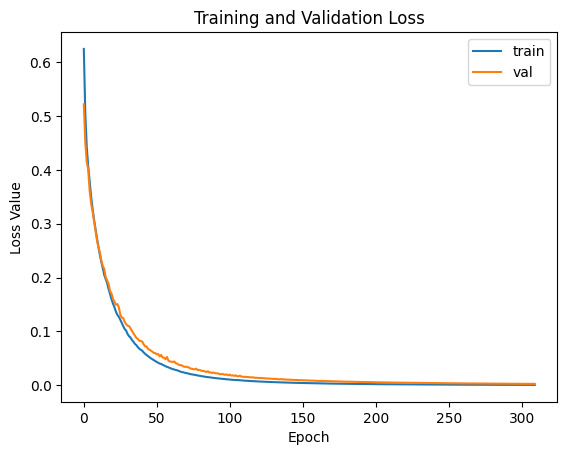

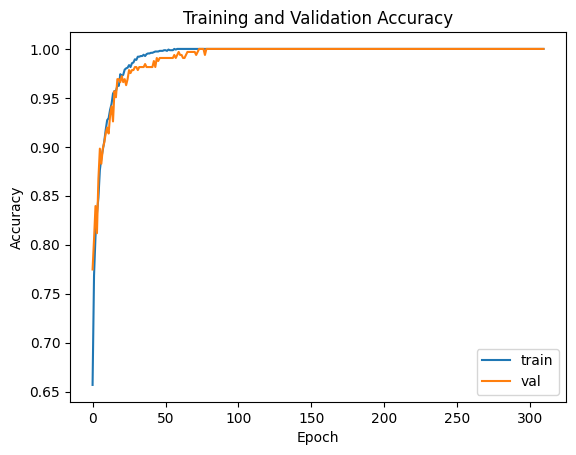

learning rate:  0.0001 batch size:  128 image shape:  64
Epoch 1/400
12/12 [==============================] - 5s 158ms/step - loss: 0.6410 - accuracy: 0.6197 - val_loss: 0.6004 - val_accuracy: 0.6975
Epoch 2/400
12/12 [==============================] - 0s 26ms/step - loss: 0.4827 - accuracy: 0.7659 - val_loss: 0.4942 - val_accuracy: 0.7654
Epoch 3/400
12/12 [==============================] - 0s 26ms/step - loss: 0.3954 - accuracy: 0.8452 - val_loss: 0.4256 - val_accuracy: 0.8210
Epoch 4/400
12/12 [==============================] - 0s 26ms/step - loss: 0.3305 - accuracy: 0.8981 - val_loss: 0.3877 - val_accuracy: 0.8549
Epoch 5/400
12/12 [==============================] - 0s 26ms/step - loss: 0.2933 - accuracy: 0.9266 - val_loss: 0.3422 - val_accuracy: 0.8889
Epoch 6/400
12/12 [==============================] - 0s 26ms/step - loss: 0.2567 - accuracy: 0.9392 - val_loss: 0.3120 - val_accuracy: 0.9043
Epoch 7/400
12/12 [==============================] - 0s 26ms/step - loss: 0.2268 - accurac

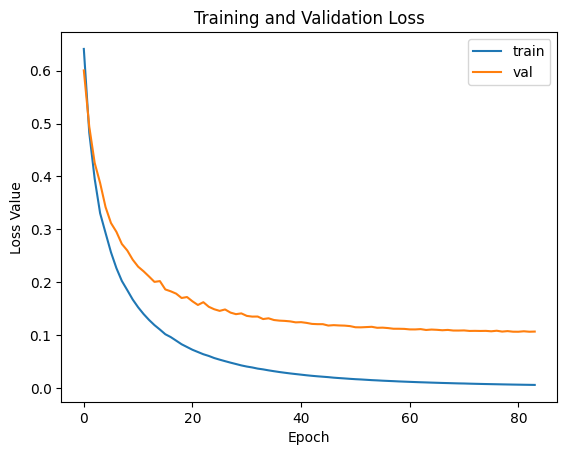

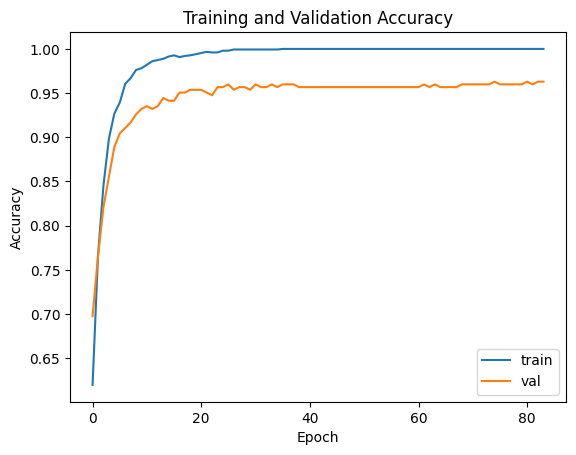

learning rate:  0.0001 batch size:  128 image shape:  32
Epoch 1/400
12/12 [==============================] - 5s 148ms/step - loss: 0.6854 - accuracy: 0.5403 - val_loss: 0.6880 - val_accuracy: 0.5123
Epoch 2/400
12/12 [==============================] - 0s 18ms/step - loss: 0.6784 - accuracy: 0.5423 - val_loss: 0.6836 - val_accuracy: 0.5093
Epoch 3/400
12/12 [==============================] - 0s 17ms/step - loss: 0.6723 - accuracy: 0.5516 - val_loss: 0.6789 - val_accuracy: 0.5340
Epoch 4/400
12/12 [==============================] - 0s 18ms/step - loss: 0.6664 - accuracy: 0.5767 - val_loss: 0.6736 - val_accuracy: 0.5648
Epoch 5/400
12/12 [==============================] - 0s 16ms/step - loss: 0.6608 - accuracy: 0.5939 - val_loss: 0.6684 - val_accuracy: 0.5864
Epoch 6/400
12/12 [==============================] - 0s 15ms/step - loss: 0.6553 - accuracy: 0.6131 - val_loss: 0.6635 - val_accuracy: 0.6173
Epoch 7/400
12/12 [==============================] - 0s 15ms/step - loss: 0.6498 - accurac

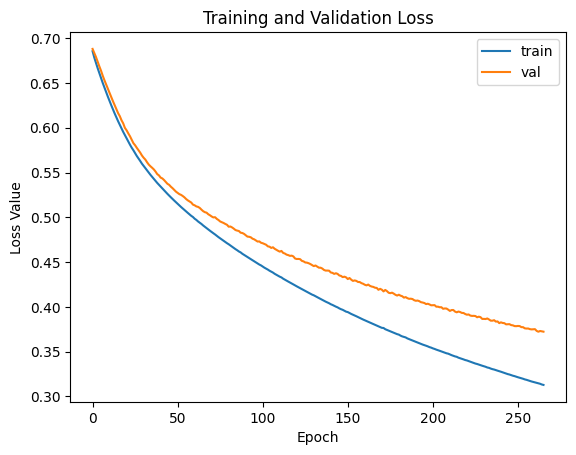

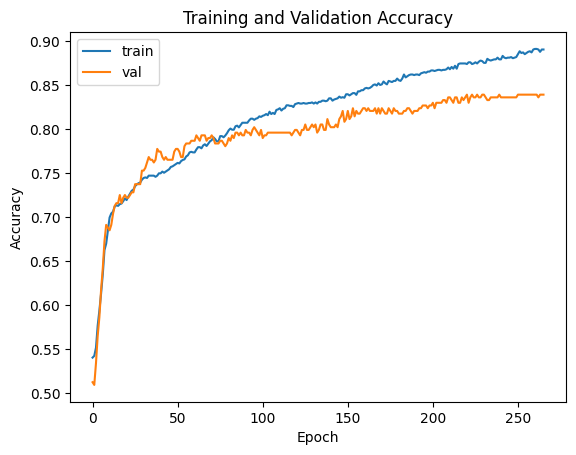

learning rate:  0.001 batch size:  16 image shape:  256
Epoch 1/400
95/95 [==============================] - 8s 52ms/step - loss: 0.5457 - accuracy: 0.7440 - val_loss: 0.3507 - val_accuracy: 0.8488
Epoch 2/400
95/95 [==============================] - 3s 36ms/step - loss: 0.3756 - accuracy: 0.8347 - val_loss: 0.2857 - val_accuracy: 0.8673
Epoch 3/400
95/95 [==============================] - 4s 37ms/step - loss: 0.2678 - accuracy: 0.8929 - val_loss: 0.2910 - val_accuracy: 0.8827
Epoch 4/400
95/95 [==============================] - 3s 36ms/step - loss: 0.1735 - accuracy: 0.9458 - val_loss: 0.2870 - val_accuracy: 0.8426
Epoch 5/400
95/95 [==============================] - 3s 36ms/step - loss: 0.1294 - accuracy: 0.9669 - val_loss: 0.0956 - val_accuracy: 0.9877
Epoch 6/400
95/95 [==============================] - 3s 36ms/step - loss: 0.0825 - accuracy: 0.9808 - val_loss: 0.1325 - val_accuracy: 0.9599
Epoch 7/400
95/95 [==============================] - 3s 36ms/step - loss: 0.0561 - accuracy:

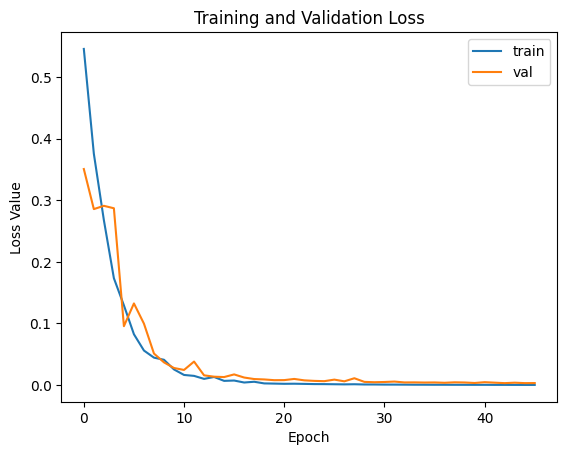

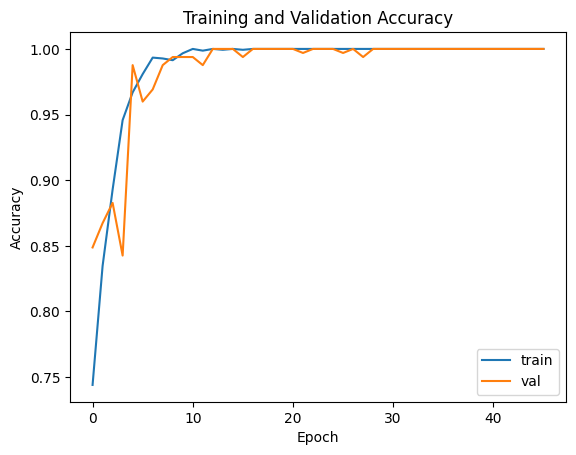

learning rate:  0.001 batch size:  16 image shape:  128
Epoch 1/400
95/95 [==============================] - 6s 35ms/step - loss: 0.5714 - accuracy: 0.7374 - val_loss: 0.3774 - val_accuracy: 0.8302
Epoch 2/400
95/95 [==============================] - 1s 13ms/step - loss: 0.3064 - accuracy: 0.8796 - val_loss: 0.2235 - val_accuracy: 0.9444
Epoch 3/400
95/95 [==============================] - 1s 13ms/step - loss: 0.2182 - accuracy: 0.9200 - val_loss: 0.1829 - val_accuracy: 0.9167
Epoch 4/400
95/95 [==============================] - 1s 13ms/step - loss: 0.1388 - accuracy: 0.9590 - val_loss: 0.1439 - val_accuracy: 0.9506
Epoch 5/400
95/95 [==============================] - 1s 13ms/step - loss: 0.1032 - accuracy: 0.9729 - val_loss: 0.0623 - val_accuracy: 0.9877
Epoch 6/400
95/95 [==============================] - 1s 13ms/step - loss: 0.0621 - accuracy: 0.9848 - val_loss: 0.0880 - val_accuracy: 0.9722
Epoch 7/400
95/95 [==============================] - 1s 13ms/step - loss: 0.0551 - accuracy:

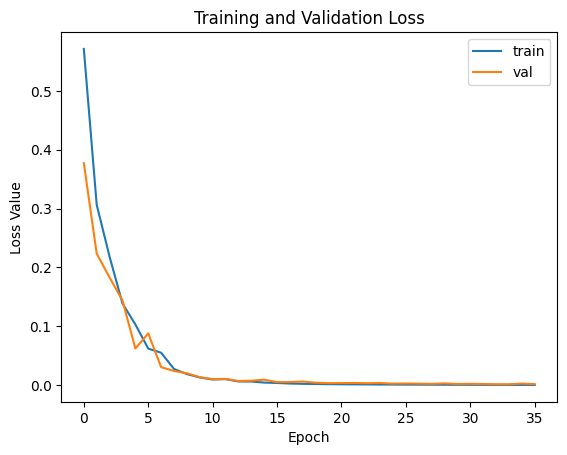

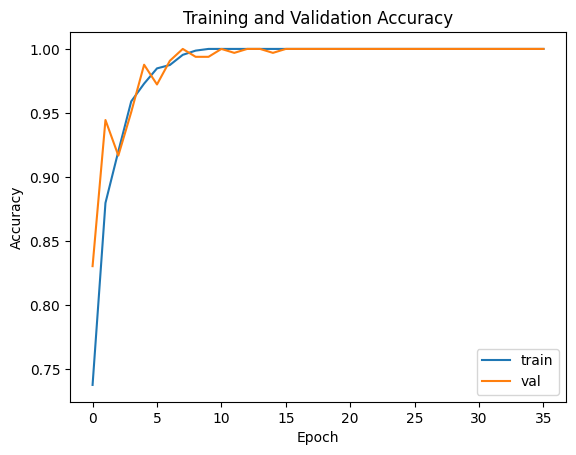

learning rate:  0.001 batch size:  16 image shape:  64
Epoch 1/400
95/95 [==============================] - 4s 18ms/step - loss: 0.5687 - accuracy: 0.7725 - val_loss: 0.2723 - val_accuracy: 0.9043
Epoch 2/400
95/95 [==============================] - 1s 9ms/step - loss: 0.1493 - accuracy: 0.9471 - val_loss: 0.2236 - val_accuracy: 0.9043
Epoch 3/400
95/95 [==============================] - 1s 9ms/step - loss: 0.0749 - accuracy: 0.9788 - val_loss: 0.1806 - val_accuracy: 0.9228
Epoch 4/400
95/95 [==============================] - 1s 9ms/step - loss: 0.0341 - accuracy: 0.9921 - val_loss: 0.1832 - val_accuracy: 0.9383
Epoch 5/400
95/95 [==============================] - 1s 9ms/step - loss: 0.0160 - accuracy: 0.9987 - val_loss: 0.1705 - val_accuracy: 0.9475
Epoch 6/400
95/95 [==============================] - 1s 8ms/step - loss: 0.0064 - accuracy: 1.0000 - val_loss: 0.1518 - val_accuracy: 0.9475
Epoch 7/400
95/95 [==============================] - 1s 9ms/step - loss: 0.0039 - accuracy: 1.0000

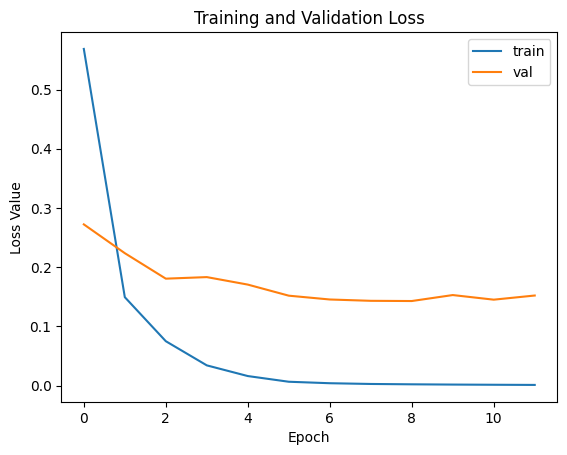

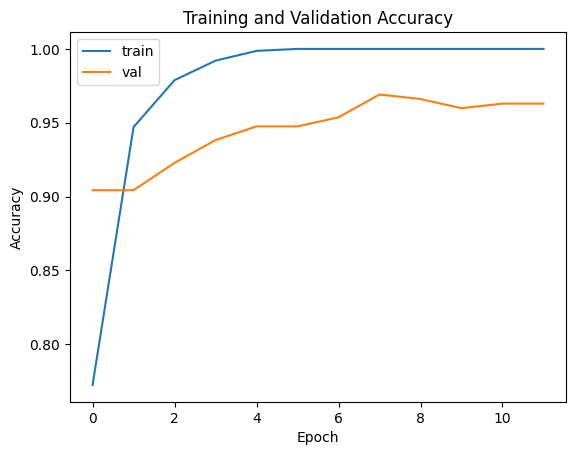

learning rate:  0.001 batch size:  16 image shape:  32
Epoch 1/400
95/95 [==============================] - 4s 17ms/step - loss: 0.6106 - accuracy: 0.6653 - val_loss: 0.5682 - val_accuracy: 0.7469
Epoch 2/400
95/95 [==============================] - 1s 8ms/step - loss: 0.5284 - accuracy: 0.7520 - val_loss: 0.5376 - val_accuracy: 0.7654
Epoch 3/400
95/95 [==============================] - 1s 9ms/step - loss: 0.4880 - accuracy: 0.7817 - val_loss: 0.4937 - val_accuracy: 0.8056
Epoch 4/400
95/95 [==============================] - 1s 8ms/step - loss: 0.4559 - accuracy: 0.7930 - val_loss: 0.4615 - val_accuracy: 0.8025
Epoch 5/400
95/95 [==============================] - 1s 8ms/step - loss: 0.4231 - accuracy: 0.8142 - val_loss: 0.4488 - val_accuracy: 0.8086
Epoch 6/400
95/95 [==============================] - 1s 8ms/step - loss: 0.3964 - accuracy: 0.8234 - val_loss: 0.4321 - val_accuracy: 0.8272
Epoch 7/400
95/95 [==============================] - 1s 8ms/step - loss: 0.3736 - accuracy: 0.8406

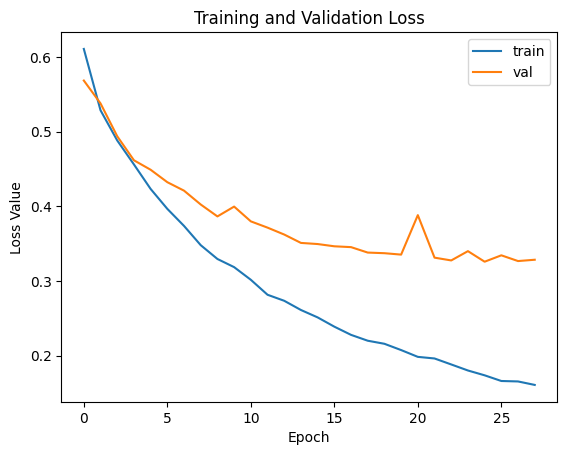

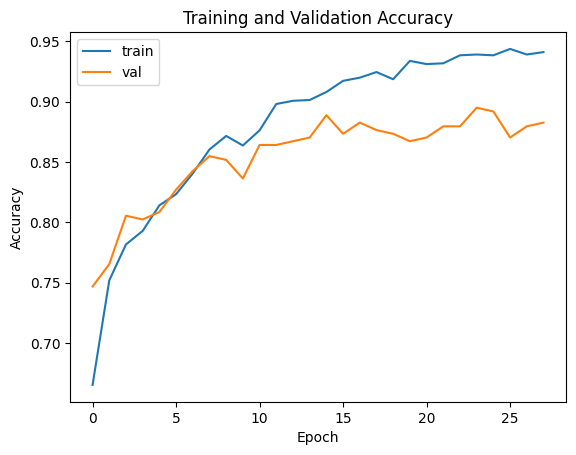

learning rate:  0.001 batch size:  32 image shape:  256
Epoch 1/400
48/48 [==============================] - 7s 99ms/step - loss: 0.6804 - accuracy: 0.6852 - val_loss: 0.5377 - val_accuracy: 0.7469
Epoch 2/400
48/48 [==============================] - 3s 67ms/step - loss: 0.4121 - accuracy: 0.8320 - val_loss: 0.3888 - val_accuracy: 0.8364
Epoch 3/400
48/48 [==============================] - 3s 67ms/step - loss: 0.3669 - accuracy: 0.8433 - val_loss: 0.2788 - val_accuracy: 0.8858
Epoch 4/400
48/48 [==============================] - 3s 67ms/step - loss: 0.3474 - accuracy: 0.8644 - val_loss: 0.2644 - val_accuracy: 0.8765
Epoch 5/400
48/48 [==============================] - 3s 68ms/step - loss: 0.2471 - accuracy: 0.9074 - val_loss: 0.1872 - val_accuracy: 0.9537
Epoch 6/400
48/48 [==============================] - 3s 68ms/step - loss: 0.1764 - accuracy: 0.9563 - val_loss: 0.2038 - val_accuracy: 0.9321
Epoch 7/400
48/48 [==============================] - 3s 69ms/step - loss: 0.1709 - accuracy:

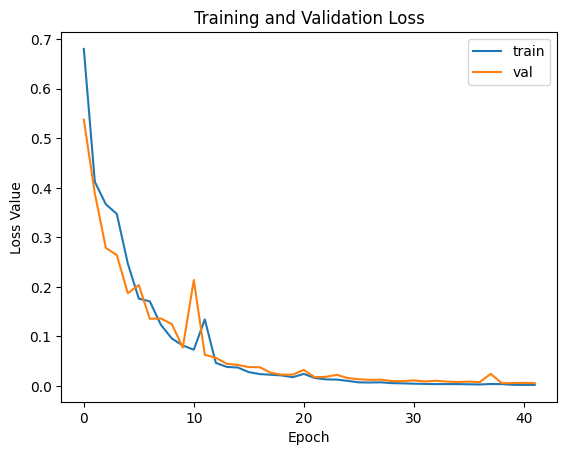

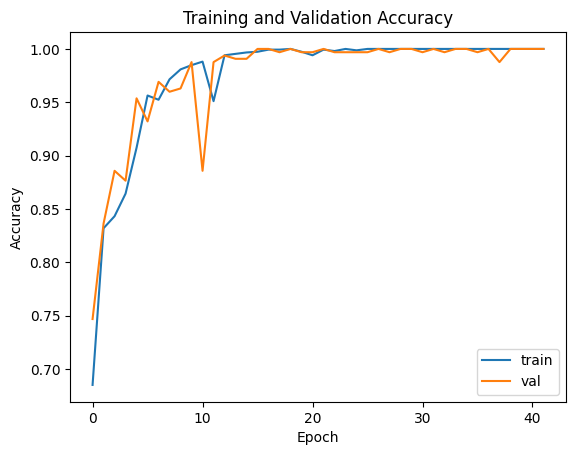

learning rate:  0.001 batch size:  32 image shape:  128
Epoch 1/400
48/48 [==============================] - 5s 43ms/step - loss: 0.4606 - accuracy: 0.7910 - val_loss: 0.3486 - val_accuracy: 0.8395
Epoch 2/400
48/48 [==============================] - 1s 22ms/step - loss: 0.2902 - accuracy: 0.8790 - val_loss: 0.3642 - val_accuracy: 0.8179
Epoch 3/400
48/48 [==============================] - 1s 21ms/step - loss: 0.3010 - accuracy: 0.8664 - val_loss: 0.2224 - val_accuracy: 0.9074
Epoch 4/400
48/48 [==============================] - 1s 21ms/step - loss: 0.1547 - accuracy: 0.9504 - val_loss: 0.1486 - val_accuracy: 0.9475
Epoch 5/400
48/48 [==============================] - 1s 21ms/step - loss: 0.1198 - accuracy: 0.9636 - val_loss: 0.0917 - val_accuracy: 0.9784
Epoch 6/400
48/48 [==============================] - 1s 21ms/step - loss: 0.1130 - accuracy: 0.9656 - val_loss: 0.0751 - val_accuracy: 0.9815
Epoch 7/400
48/48 [==============================] - 1s 21ms/step - loss: 0.0693 - accuracy:

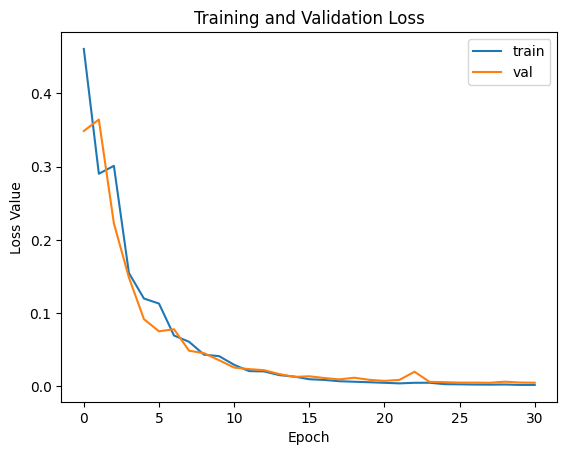

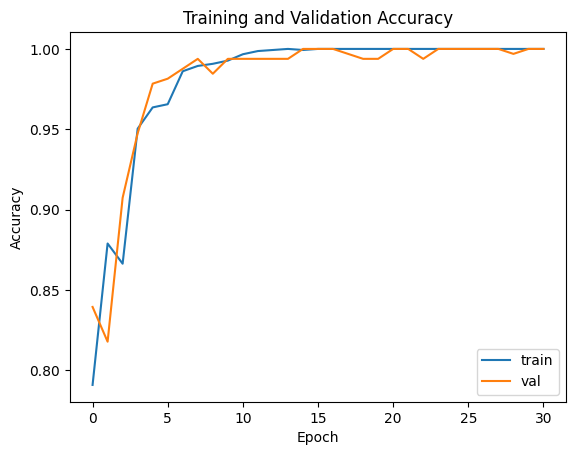

learning rate:  0.001 batch size:  32 image shape:  64
Epoch 1/400
48/48 [==============================] - 4s 31ms/step - loss: 0.5957 - accuracy: 0.7685 - val_loss: 0.2997 - val_accuracy: 0.8580
Epoch 2/400
48/48 [==============================] - 1s 11ms/step - loss: 0.1806 - accuracy: 0.9372 - val_loss: 0.1767 - val_accuracy: 0.9383
Epoch 3/400
48/48 [==============================] - 1s 11ms/step - loss: 0.0984 - accuracy: 0.9782 - val_loss: 0.1870 - val_accuracy: 0.9290
Epoch 4/400
48/48 [==============================] - 1s 11ms/step - loss: 0.0724 - accuracy: 0.9775 - val_loss: 0.2550 - val_accuracy: 0.8889
Epoch 5/400
48/48 [==============================] - 1s 11ms/step - loss: 0.0572 - accuracy: 0.9861 - val_loss: 0.1710 - val_accuracy: 0.9167
Epoch 6/400
48/48 [==============================] - 1s 10ms/step - loss: 0.0213 - accuracy: 0.9967 - val_loss: 0.1957 - val_accuracy: 0.9352
Epoch 7/400
48/48 [==============================] - 1s 11ms/step - loss: 0.0112 - accuracy: 

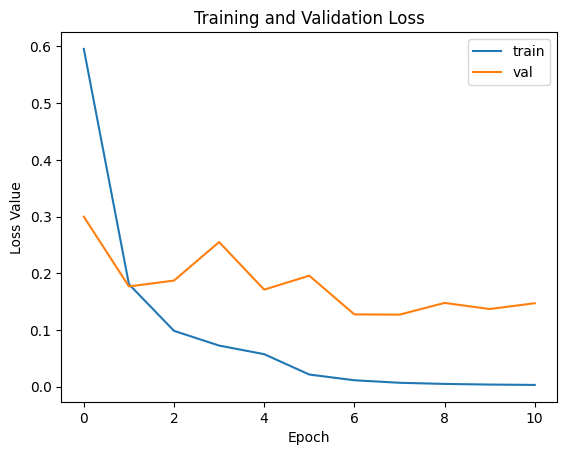

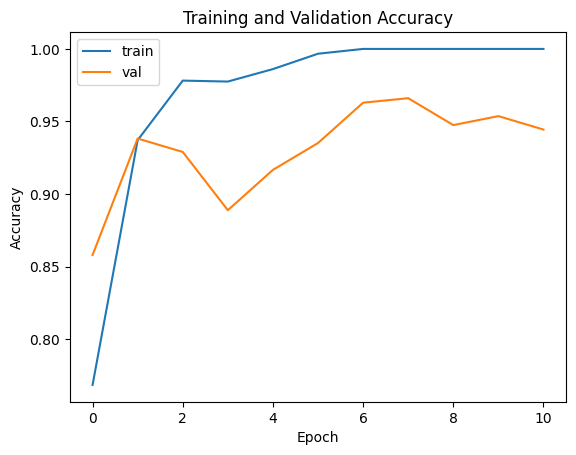

learning rate:  0.001 batch size:  32 image shape:  32
Epoch 1/400
48/48 [==============================] - 5s 52ms/step - loss: 0.6284 - accuracy: 0.6746 - val_loss: 0.5930 - val_accuracy: 0.7377
Epoch 2/400
48/48 [==============================] - 1s 11ms/step - loss: 0.5469 - accuracy: 0.7421 - val_loss: 0.5360 - val_accuracy: 0.7716
Epoch 3/400
48/48 [==============================] - 0s 10ms/step - loss: 0.5085 - accuracy: 0.7765 - val_loss: 0.5117 - val_accuracy: 0.7870
Epoch 4/400
48/48 [==============================] - 0s 9ms/step - loss: 0.4762 - accuracy: 0.7956 - val_loss: 0.4957 - val_accuracy: 0.7840
Epoch 5/400
48/48 [==============================] - 0s 9ms/step - loss: 0.4516 - accuracy: 0.8016 - val_loss: 0.4879 - val_accuracy: 0.7809
Epoch 6/400
48/48 [==============================] - 0s 9ms/step - loss: 0.4299 - accuracy: 0.8155 - val_loss: 0.4768 - val_accuracy: 0.7870
Epoch 7/400
48/48 [==============================] - 0s 9ms/step - loss: 0.4048 - accuracy: 0.83

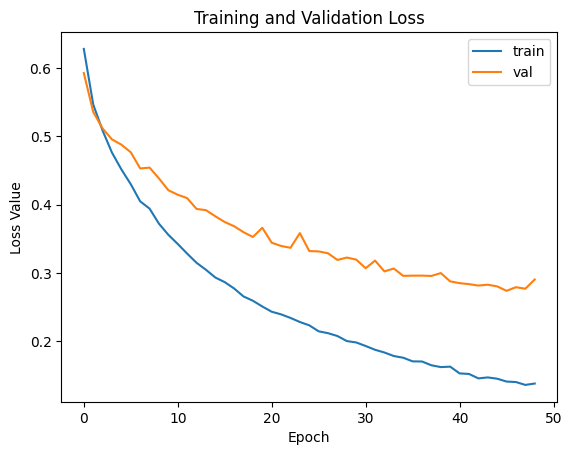

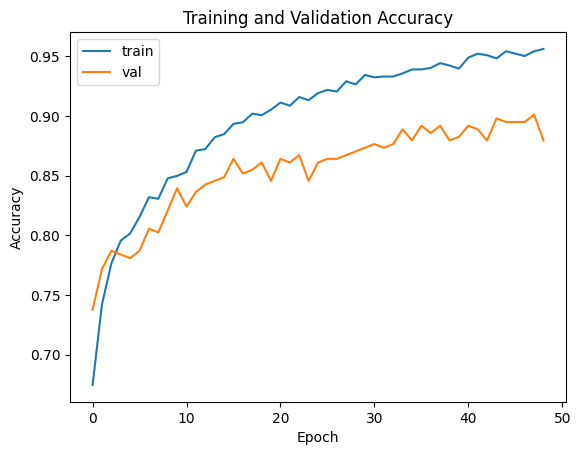

learning rate:  0.001 batch size:  64 image shape:  256
Epoch 1/400
24/24 [==============================] - 7s 195ms/step - loss: 0.5996 - accuracy: 0.6997 - val_loss: 0.5407 - val_accuracy: 0.7531
Epoch 2/400
24/24 [==============================] - 3s 128ms/step - loss: 0.4812 - accuracy: 0.7738 - val_loss: 0.4323 - val_accuracy: 0.8179
Epoch 3/400
24/24 [==============================] - 3s 128ms/step - loss: 0.3909 - accuracy: 0.8386 - val_loss: 0.3396 - val_accuracy: 0.8858
Epoch 4/400
24/24 [==============================] - 3s 128ms/step - loss: 0.3210 - accuracy: 0.8856 - val_loss: 0.2829 - val_accuracy: 0.8981
Epoch 5/400
24/24 [==============================] - 3s 129ms/step - loss: 0.2680 - accuracy: 0.9048 - val_loss: 0.2394 - val_accuracy: 0.9321
Epoch 6/400
24/24 [==============================] - 3s 130ms/step - loss: 0.2242 - accuracy: 0.9306 - val_loss: 0.2893 - val_accuracy: 0.8673
Epoch 7/400
24/24 [==============================] - 3s 130ms/step - loss: 0.1963 - ac

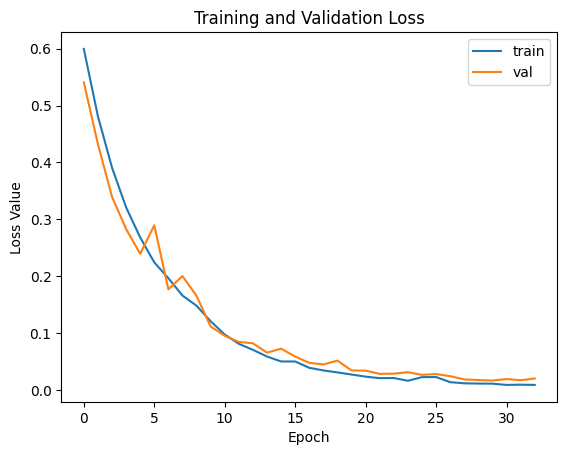

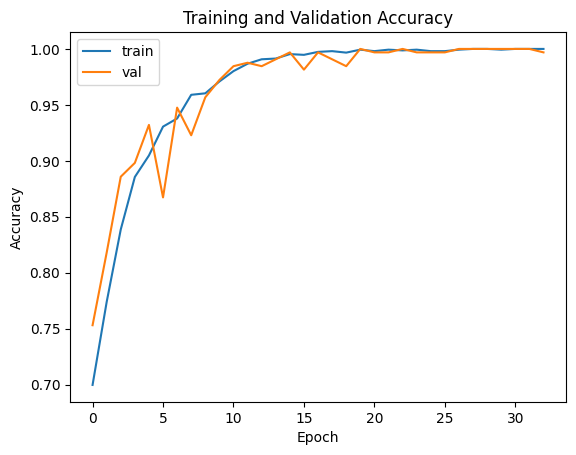

learning rate:  0.001 batch size:  64 image shape:  128
Epoch 1/400
24/24 [==============================] - 5s 80ms/step - loss: 0.7910 - accuracy: 0.6554 - val_loss: 0.5606 - val_accuracy: 0.7438
Epoch 2/400
24/24 [==============================] - 1s 37ms/step - loss: 0.4561 - accuracy: 0.7976 - val_loss: 0.3875 - val_accuracy: 0.8364
Epoch 3/400
24/24 [==============================] - 1s 37ms/step - loss: 0.3700 - accuracy: 0.8525 - val_loss: 0.3172 - val_accuracy: 0.8858
Epoch 4/400
24/24 [==============================] - 1s 38ms/step - loss: 0.3161 - accuracy: 0.8849 - val_loss: 0.2668 - val_accuracy: 0.9105
Epoch 5/400
24/24 [==============================] - 1s 37ms/step - loss: 0.2596 - accuracy: 0.9134 - val_loss: 0.2419 - val_accuracy: 0.9198
Epoch 6/400
24/24 [==============================] - 1s 38ms/step - loss: 0.2350 - accuracy: 0.9187 - val_loss: 0.1869 - val_accuracy: 0.9383
Epoch 7/400
24/24 [==============================] - 1s 38ms/step - loss: 0.1821 - accuracy:

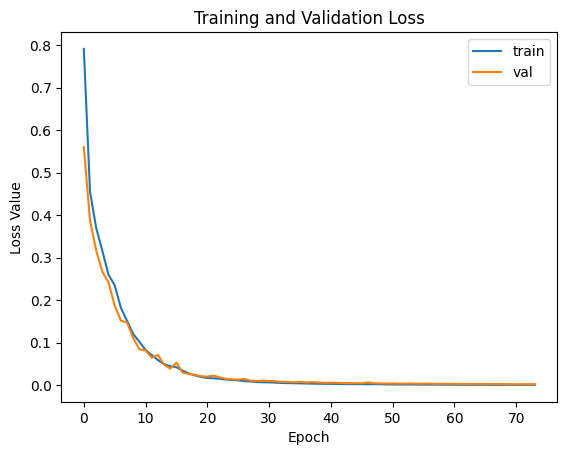

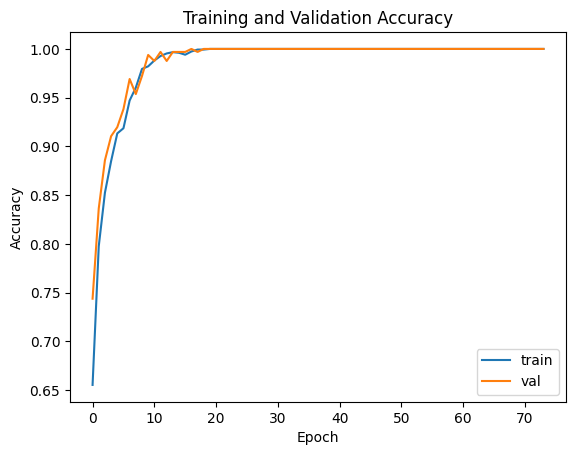

learning rate:  0.001 batch size:  64 image shape:  64
Epoch 1/400
24/24 [==============================] - 4s 60ms/step - loss: 0.7091 - accuracy: 0.7057 - val_loss: 0.3421 - val_accuracy: 0.8488
Epoch 2/400
24/24 [==============================] - 0s 17ms/step - loss: 0.2432 - accuracy: 0.9134 - val_loss: 0.2235 - val_accuracy: 0.9228
Epoch 3/400
24/24 [==============================] - 0s 16ms/step - loss: 0.1336 - accuracy: 0.9709 - val_loss: 0.1761 - val_accuracy: 0.9475
Epoch 4/400
24/24 [==============================] - 0s 16ms/step - loss: 0.0844 - accuracy: 0.9874 - val_loss: 0.1396 - val_accuracy: 0.9599
Epoch 5/400
24/24 [==============================] - 0s 15ms/step - loss: 0.0509 - accuracy: 0.9940 - val_loss: 0.1501 - val_accuracy: 0.9414
Epoch 6/400
24/24 [==============================] - 0s 16ms/step - loss: 0.0370 - accuracy: 0.9954 - val_loss: 0.1175 - val_accuracy: 0.9599
Epoch 7/400
24/24 [==============================] - 0s 16ms/step - loss: 0.0277 - accuracy: 

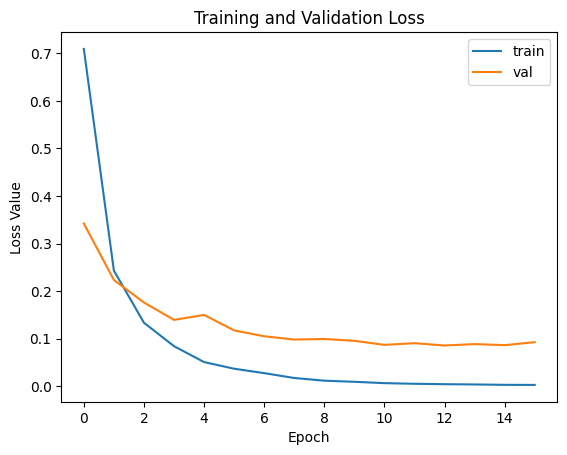

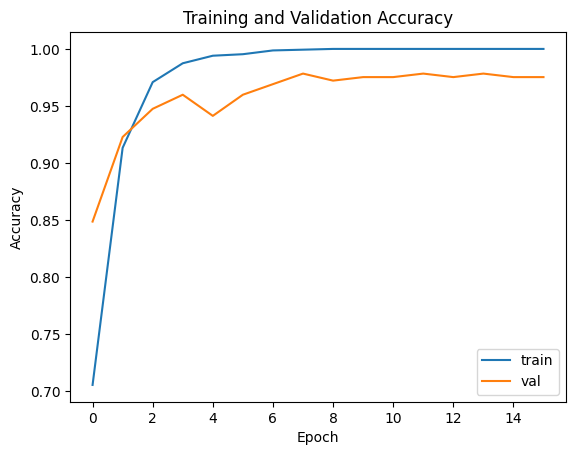

learning rate:  0.001 batch size:  64 image shape:  32
Epoch 1/400
24/24 [==============================] - 4s 49ms/step - loss: 0.6440 - accuracy: 0.6634 - val_loss: 0.6201 - val_accuracy: 0.7500
Epoch 2/400
24/24 [==============================] - 0s 13ms/step - loss: 0.5711 - accuracy: 0.7520 - val_loss: 0.5717 - val_accuracy: 0.7438
Epoch 3/400
24/24 [==============================] - 0s 13ms/step - loss: 0.5320 - accuracy: 0.7672 - val_loss: 0.5482 - val_accuracy: 0.7438
Epoch 4/400
24/24 [==============================] - 0s 12ms/step - loss: 0.5031 - accuracy: 0.7791 - val_loss: 0.5405 - val_accuracy: 0.7438
Epoch 5/400
24/24 [==============================] - 0s 12ms/step - loss: 0.4836 - accuracy: 0.7937 - val_loss: 0.5194 - val_accuracy: 0.7623
Epoch 6/400
24/24 [==============================] - 0s 11ms/step - loss: 0.4668 - accuracy: 0.8075 - val_loss: 0.5146 - val_accuracy: 0.7747
Epoch 7/400
24/24 [==============================] - 0s 11ms/step - loss: 0.4474 - accuracy: 

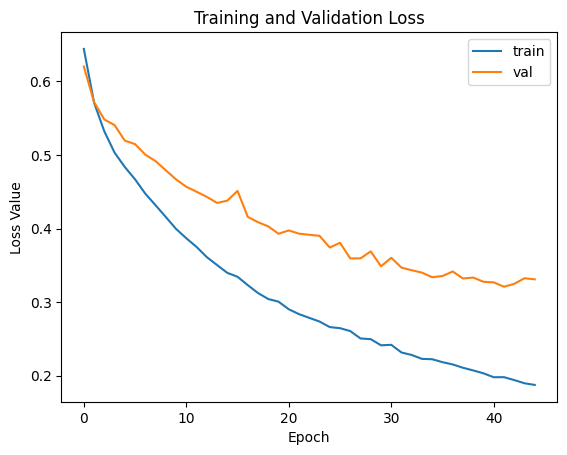

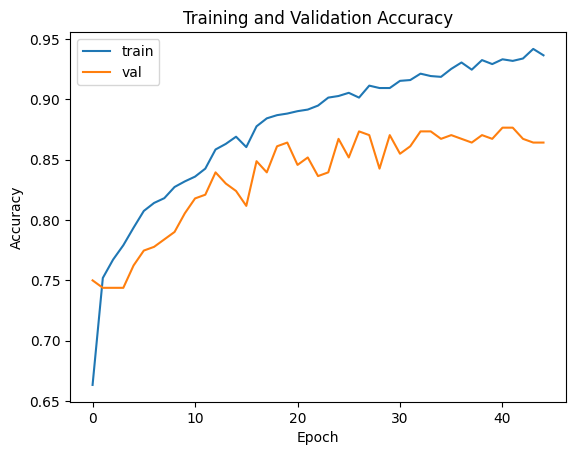

learning rate:  0.001 batch size:  128 image shape:  256
Epoch 1/400
12/12 [==============================] - 7s 382ms/step - loss: 0.9474 - accuracy: 0.5886 - val_loss: 0.5346 - val_accuracy: 0.7531
Epoch 2/400
12/12 [==============================] - 3s 252ms/step - loss: 0.5759 - accuracy: 0.7136 - val_loss: 0.5404 - val_accuracy: 0.7253
Epoch 3/400
12/12 [==============================] - 3s 253ms/step - loss: 0.5512 - accuracy: 0.7487 - val_loss: 0.4837 - val_accuracy: 0.8117
Epoch 4/400
12/12 [==============================] - 3s 254ms/step - loss: 0.4828 - accuracy: 0.7983 - val_loss: 0.4455 - val_accuracy: 0.8333
Epoch 5/400
12/12 [==============================] - 3s 252ms/step - loss: 0.4553 - accuracy: 0.8082 - val_loss: 0.4207 - val_accuracy: 0.8426
Epoch 6/400
12/12 [==============================] - 3s 252ms/step - loss: 0.4288 - accuracy: 0.8161 - val_loss: 0.3957 - val_accuracy: 0.8395
Epoch 7/400
12/12 [==============================] - 3s 253ms/step - loss: 0.4039 - a

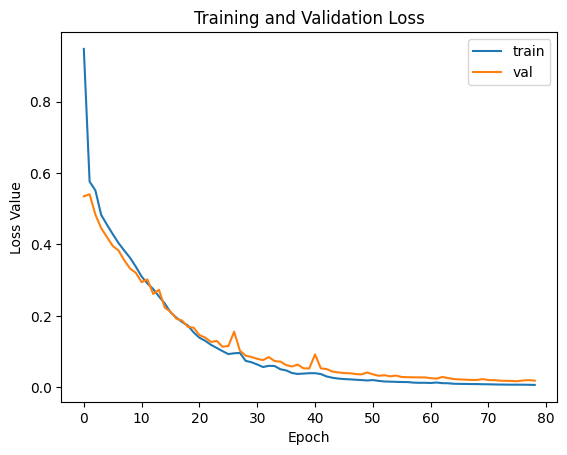

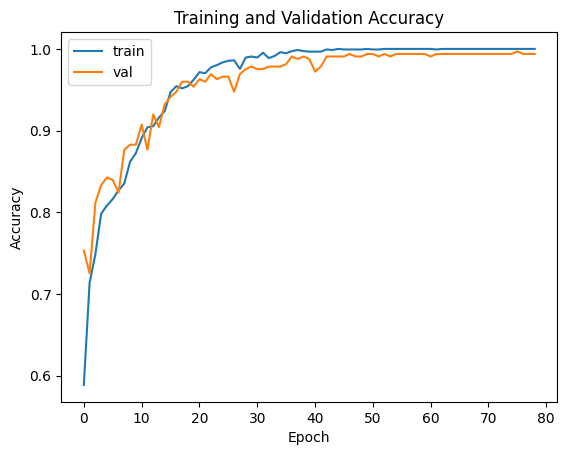

learning rate:  0.001 batch size:  128 image shape:  128
Epoch 1/400
12/12 [==============================] - 5s 162ms/step - loss: 0.9854 - accuracy: 0.5886 - val_loss: 0.5979 - val_accuracy: 0.6883
Epoch 2/400
12/12 [==============================] - 1s 71ms/step - loss: 0.5548 - accuracy: 0.7348 - val_loss: 0.4329 - val_accuracy: 0.8488
Epoch 3/400
12/12 [==============================] - 1s 73ms/step - loss: 0.4555 - accuracy: 0.8075 - val_loss: 0.3814 - val_accuracy: 0.8673
Epoch 4/400
12/12 [==============================] - 1s 73ms/step - loss: 0.4003 - accuracy: 0.8360 - val_loss: 0.3646 - val_accuracy: 0.8611
Epoch 5/400
12/12 [==============================] - 1s 71ms/step - loss: 0.3731 - accuracy: 0.8466 - val_loss: 0.3251 - val_accuracy: 0.8981
Epoch 6/400
12/12 [==============================] - 1s 71ms/step - loss: 0.3328 - accuracy: 0.8836 - val_loss: 0.3141 - val_accuracy: 0.8981
Epoch 7/400
12/12 [==============================] - 1s 72ms/step - loss: 0.3023 - accurac

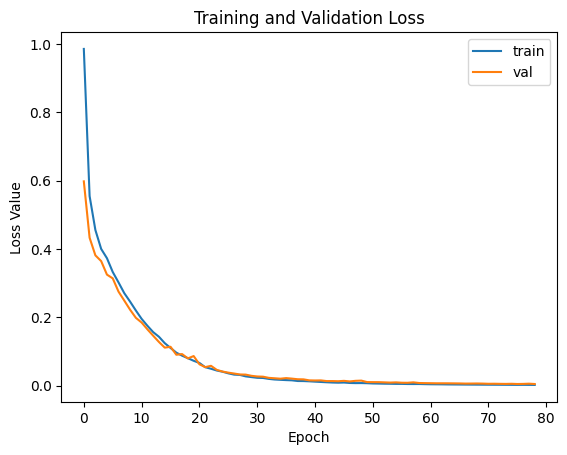

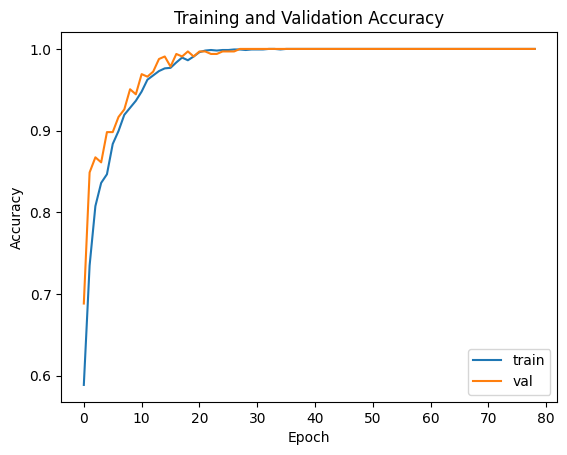

learning rate:  0.001 batch size:  128 image shape:  64
Epoch 1/400
12/12 [==============================] - 5s 235ms/step - loss: 1.0821 - accuracy: 0.6382 - val_loss: 0.6375 - val_accuracy: 0.7253
Epoch 2/400
12/12 [==============================] - 0s 33ms/step - loss: 0.4624 - accuracy: 0.7937 - val_loss: 0.4136 - val_accuracy: 0.8148
Epoch 3/400
12/12 [==============================] - 0s 27ms/step - loss: 0.2898 - accuracy: 0.8862 - val_loss: 0.2937 - val_accuracy: 0.8827
Epoch 4/400
12/12 [==============================] - 0s 27ms/step - loss: 0.1877 - accuracy: 0.9471 - val_loss: 0.2084 - val_accuracy: 0.9383
Epoch 5/400
12/12 [==============================] - 0s 27ms/step - loss: 0.1368 - accuracy: 0.9649 - val_loss: 0.1800 - val_accuracy: 0.9444
Epoch 6/400
12/12 [==============================] - 0s 27ms/step - loss: 0.1019 - accuracy: 0.9821 - val_loss: 0.1545 - val_accuracy: 0.9568
Epoch 7/400
12/12 [==============================] - 0s 27ms/step - loss: 0.0785 - accuracy

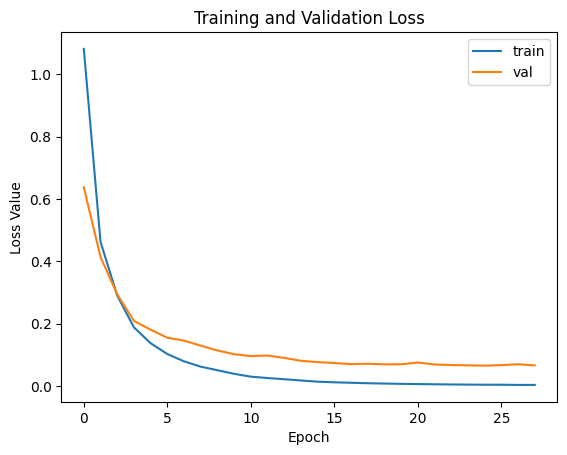

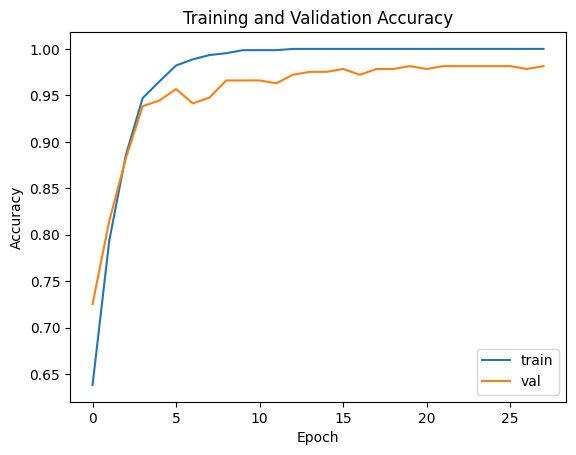

learning rate:  0.001 batch size:  128 image shape:  32
Epoch 1/400
12/12 [==============================] - 4s 98ms/step - loss: 0.6637 - accuracy: 0.6058 - val_loss: 0.6429 - val_accuracy: 0.7160
Epoch 2/400
12/12 [==============================] - 0s 24ms/step - loss: 0.6084 - accuracy: 0.7394 - val_loss: 0.6034 - val_accuracy: 0.7438
Epoch 3/400
12/12 [==============================] - 0s 18ms/step - loss: 0.5708 - accuracy: 0.7507 - val_loss: 0.5766 - val_accuracy: 0.7346
Epoch 4/400
12/12 [==============================] - 0s 16ms/step - loss: 0.5434 - accuracy: 0.7639 - val_loss: 0.5623 - val_accuracy: 0.7623
Epoch 5/400
12/12 [==============================] - 0s 15ms/step - loss: 0.5220 - accuracy: 0.7672 - val_loss: 0.5399 - val_accuracy: 0.7562
Epoch 6/400
12/12 [==============================] - 0s 16ms/step - loss: 0.5079 - accuracy: 0.7665 - val_loss: 0.5494 - val_accuracy: 0.7500
Epoch 7/400
12/12 [==============================] - 0s 17ms/step - loss: 0.4918 - accuracy:

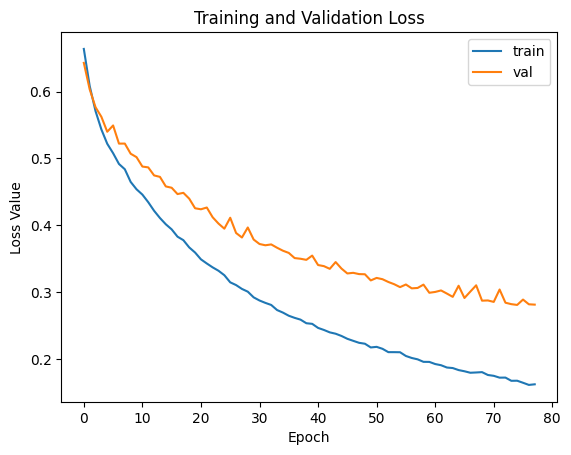

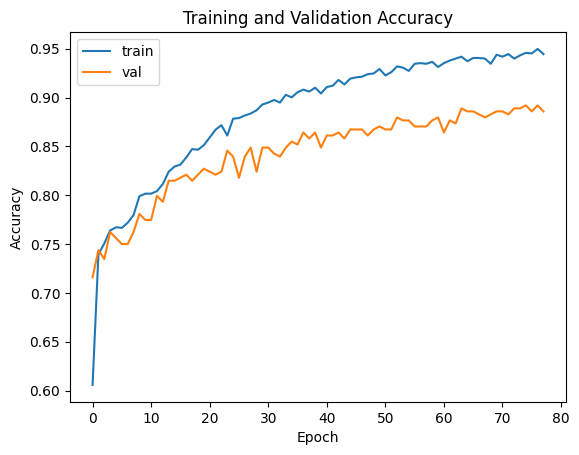

learning rate:  0.01 batch size:  16 image shape:  256
Epoch 1/400
95/95 [==============================] - 8s 53ms/step - loss: 1.2098 - accuracy: 0.6640 - val_loss: 0.4918 - val_accuracy: 0.8025
Epoch 2/400
95/95 [==============================] - 3s 36ms/step - loss: 0.5143 - accuracy: 0.7639 - val_loss: 0.5331 - val_accuracy: 0.7222
Epoch 3/400
95/95 [==============================] - 4s 37ms/step - loss: 0.4214 - accuracy: 0.8128 - val_loss: 0.4618 - val_accuracy: 0.7809
Epoch 4/400
95/95 [==============================] - 3s 37ms/step - loss: 0.3501 - accuracy: 0.8604 - val_loss: 0.2648 - val_accuracy: 0.9136
Epoch 5/400
95/95 [==============================] - 4s 37ms/step - loss: 0.3153 - accuracy: 0.8664 - val_loss: 0.3500 - val_accuracy: 0.8519
Epoch 6/400
95/95 [==============================] - 4s 38ms/step - loss: 0.2357 - accuracy: 0.9087 - val_loss: 0.2299 - val_accuracy: 0.8951
Epoch 7/400
95/95 [==============================] - 4s 38ms/step - loss: 0.1683 - accuracy: 

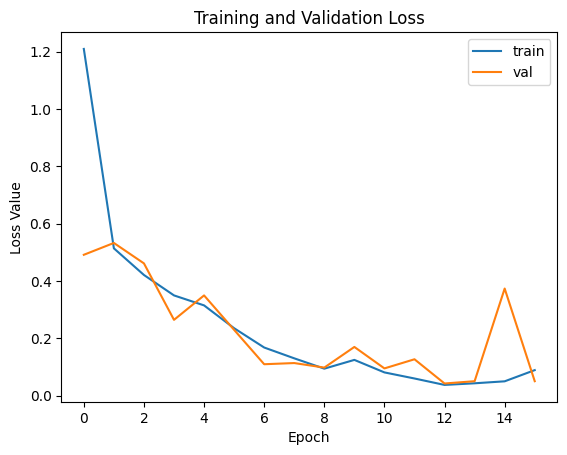

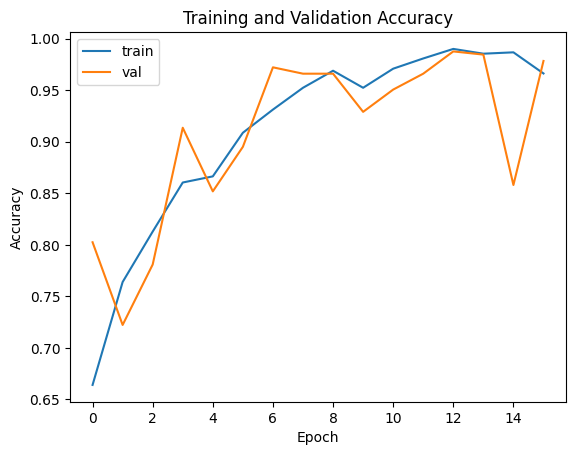

learning rate:  0.01 batch size:  16 image shape:  128
Epoch 1/400
95/95 [==============================] - 5s 25ms/step - loss: 0.9051 - accuracy: 0.7302 - val_loss: 0.3369 - val_accuracy: 0.8765
Epoch 2/400
95/95 [==============================] - 1s 13ms/step - loss: 0.4054 - accuracy: 0.8194 - val_loss: 0.3072 - val_accuracy: 0.8981
Epoch 3/400
95/95 [==============================] - 1s 13ms/step - loss: 0.3093 - accuracy: 0.8690 - val_loss: 0.2037 - val_accuracy: 0.9321
Epoch 4/400
95/95 [==============================] - 1s 13ms/step - loss: 0.1905 - accuracy: 0.9286 - val_loss: 0.7416 - val_accuracy: 0.7099
Epoch 5/400
95/95 [==============================] - 1s 13ms/step - loss: 0.1806 - accuracy: 0.9266 - val_loss: 0.1003 - val_accuracy: 0.9630
Epoch 6/400
95/95 [==============================] - 1s 13ms/step - loss: 0.1241 - accuracy: 0.9497 - val_loss: 0.1237 - val_accuracy: 0.9444
Epoch 7/400
95/95 [==============================] - 1s 13ms/step - loss: 0.1016 - accuracy: 

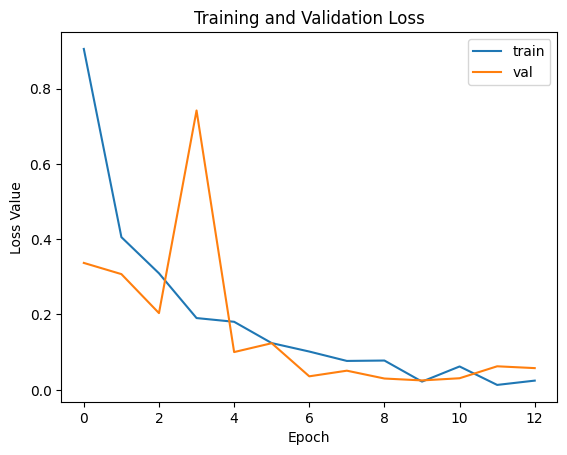

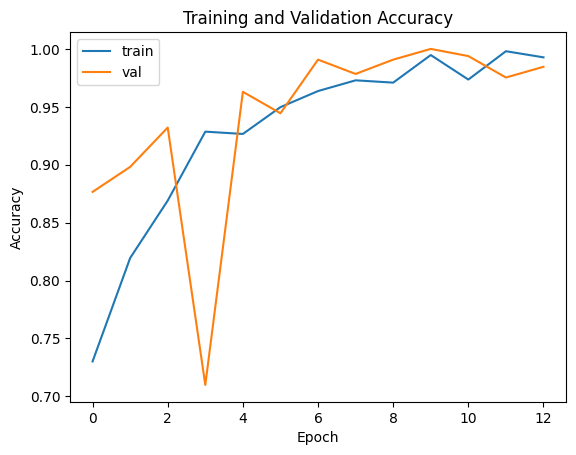

learning rate:  0.01 batch size:  16 image shape:  64
Epoch 1/400
95/95 [==============================] - 5s 20ms/step - loss: 1.5267 - accuracy: 0.7037 - val_loss: 0.3681 - val_accuracy: 0.8488
Epoch 2/400
95/95 [==============================] - 1s 10ms/step - loss: 0.3307 - accuracy: 0.8657 - val_loss: 0.2794 - val_accuracy: 0.8765
Epoch 3/400
95/95 [==============================] - 1s 9ms/step - loss: 0.2803 - accuracy: 0.8790 - val_loss: 0.2876 - val_accuracy: 0.8920
Epoch 4/400
95/95 [==============================] - 1s 9ms/step - loss: 0.1771 - accuracy: 0.9266 - val_loss: 0.2348 - val_accuracy: 0.9352
Epoch 5/400
95/95 [==============================] - 1s 9ms/step - loss: 0.1610 - accuracy: 0.9411 - val_loss: 0.2209 - val_accuracy: 0.9198
Epoch 6/400
95/95 [==============================] - 1s 9ms/step - loss: 0.1251 - accuracy: 0.9491 - val_loss: 0.2259 - val_accuracy: 0.9290
Epoch 7/400
95/95 [==============================] - 1s 9ms/step - loss: 0.0816 - accuracy: 0.9716

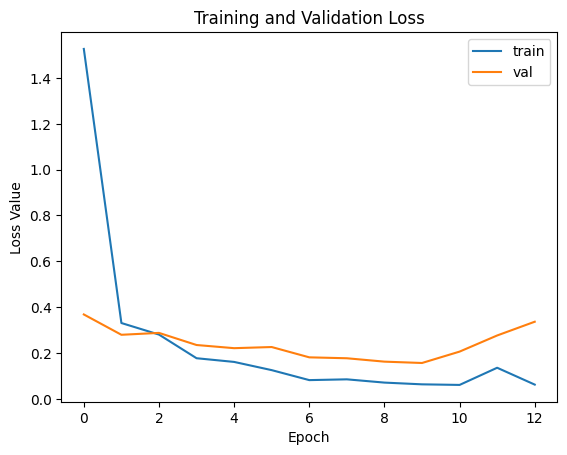

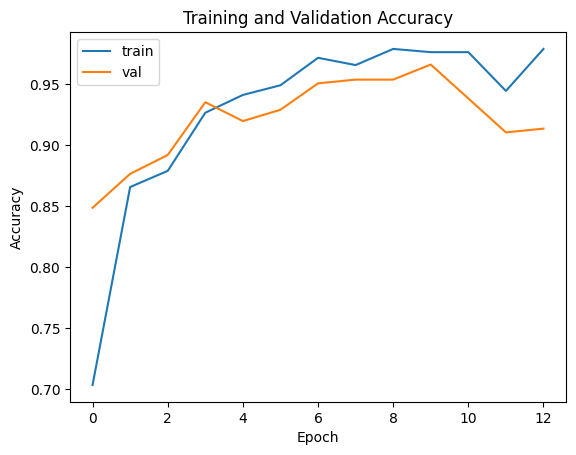

learning rate:  0.01 batch size:  16 image shape:  32
Epoch 1/400
95/95 [==============================] - 5s 18ms/step - loss: 0.5667 - accuracy: 0.7083 - val_loss: 0.4964 - val_accuracy: 0.7500
Epoch 2/400
95/95 [==============================] - 1s 9ms/step - loss: 0.4497 - accuracy: 0.7804 - val_loss: 0.4164 - val_accuracy: 0.8148
Epoch 3/400
95/95 [==============================] - 1s 9ms/step - loss: 0.3790 - accuracy: 0.8221 - val_loss: 0.3903 - val_accuracy: 0.8241
Epoch 4/400
95/95 [==============================] - 1s 9ms/step - loss: 0.3269 - accuracy: 0.8413 - val_loss: 0.3792 - val_accuracy: 0.8395
Epoch 5/400
95/95 [==============================] - 1s 9ms/step - loss: 0.2900 - accuracy: 0.8763 - val_loss: 0.3366 - val_accuracy: 0.8611
Epoch 6/400
95/95 [==============================] - 1s 10ms/step - loss: 0.2532 - accuracy: 0.8896 - val_loss: 0.3325 - val_accuracy: 0.8642
Epoch 7/400
95/95 [==============================] - 1s 9ms/step - loss: 0.2424 - accuracy: 0.9021

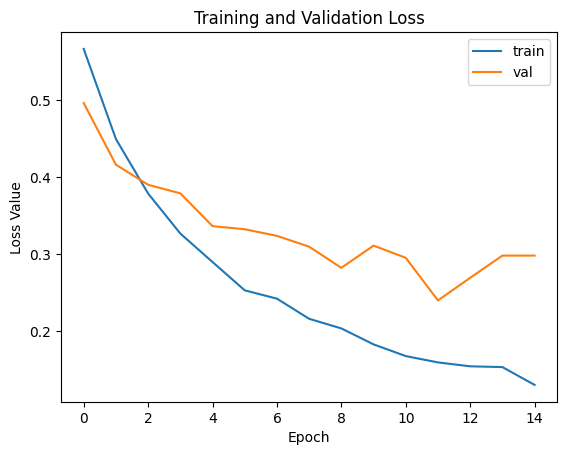

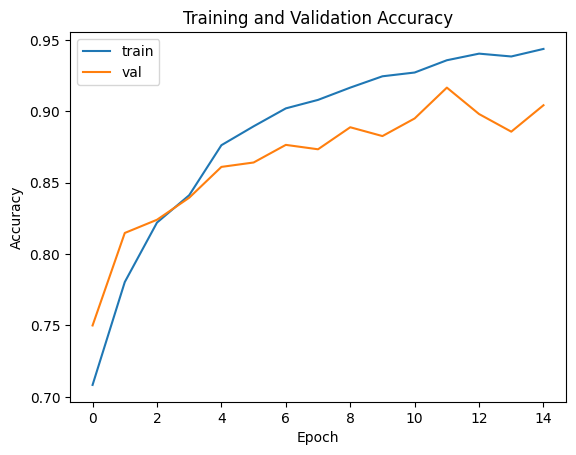

learning rate:  0.01 batch size:  32 image shape:  256
Epoch 1/400
48/48 [==============================] - 8s 100ms/step - loss: 1.7168 - accuracy: 0.6396 - val_loss: 0.5069 - val_accuracy: 0.8025
Epoch 2/400
48/48 [==============================] - 3s 69ms/step - loss: 0.5130 - accuracy: 0.7665 - val_loss: 0.4543 - val_accuracy: 0.8210
Epoch 3/400
48/48 [==============================] - 3s 68ms/step - loss: 0.4437 - accuracy: 0.8029 - val_loss: 0.4037 - val_accuracy: 0.7932
Epoch 4/400
48/48 [==============================] - 3s 68ms/step - loss: 0.3895 - accuracy: 0.8439 - val_loss: 0.3115 - val_accuracy: 0.8951
Epoch 5/400
48/48 [==============================] - 3s 68ms/step - loss: 0.3447 - accuracy: 0.8386 - val_loss: 0.2467 - val_accuracy: 0.9136
Epoch 6/400
48/48 [==============================] - 3s 68ms/step - loss: 0.2475 - accuracy: 0.9114 - val_loss: 0.2342 - val_accuracy: 0.9136
Epoch 7/400
48/48 [==============================] - 3s 69ms/step - loss: 0.2282 - accuracy:

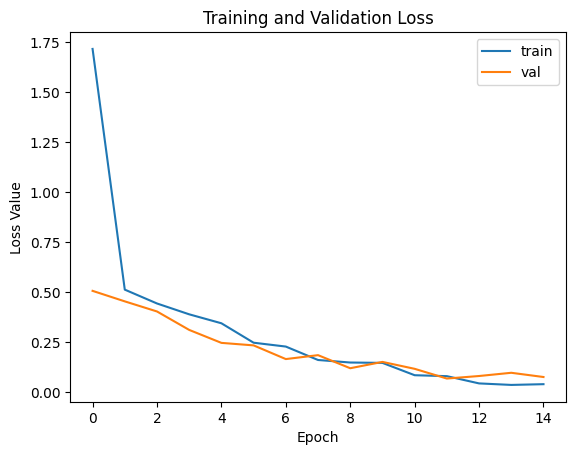

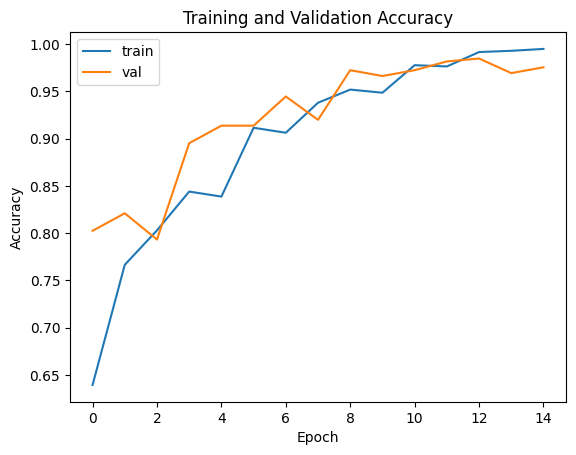

learning rate:  0.01 batch size:  32 image shape:  128
Epoch 1/400
48/48 [==============================] - 5s 45ms/step - loss: 1.5697 - accuracy: 0.6581 - val_loss: 0.4215 - val_accuracy: 0.8426
Epoch 2/400
48/48 [==============================] - 1s 22ms/step - loss: 0.4399 - accuracy: 0.7983 - val_loss: 0.3352 - val_accuracy: 0.8704
Epoch 3/400
48/48 [==============================] - 1s 22ms/step - loss: 0.3383 - accuracy: 0.8624 - val_loss: 0.2396 - val_accuracy: 0.9228
Epoch 4/400
48/48 [==============================] - 1s 22ms/step - loss: 0.2614 - accuracy: 0.9054 - val_loss: 0.3800 - val_accuracy: 0.7870
Epoch 5/400
48/48 [==============================] - 1s 22ms/step - loss: 0.2012 - accuracy: 0.9266 - val_loss: 0.1453 - val_accuracy: 0.9630
Epoch 6/400
48/48 [==============================] - 1s 22ms/step - loss: 0.1217 - accuracy: 0.9676 - val_loss: 0.1884 - val_accuracy: 0.9383
Epoch 7/400
48/48 [==============================] - 1s 22ms/step - loss: 0.1677 - accuracy: 

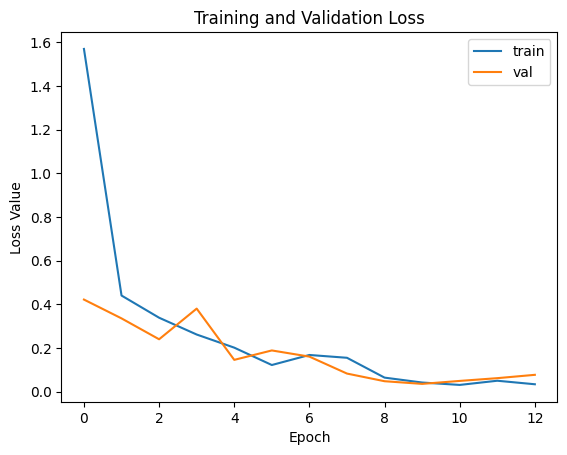

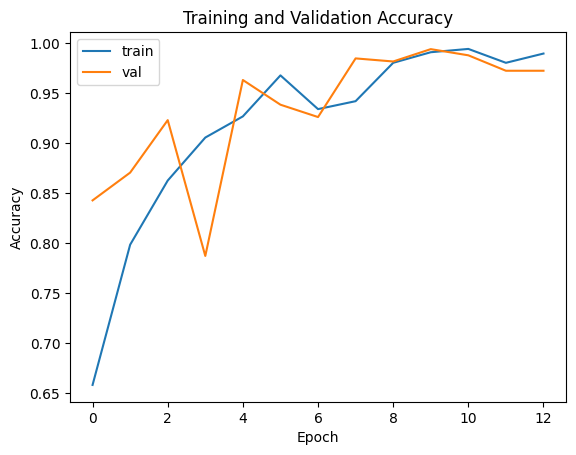

learning rate:  0.01 batch size:  32 image shape:  64
Epoch 1/400
48/48 [==============================] - 4s 32ms/step - loss: 1.3066 - accuracy: 0.7275 - val_loss: 0.4133 - val_accuracy: 0.8457
Epoch 2/400
48/48 [==============================] - 1s 12ms/step - loss: 0.3008 - accuracy: 0.8783 - val_loss: 0.2561 - val_accuracy: 0.9136
Epoch 3/400
48/48 [==============================] - 1s 12ms/step - loss: 0.2112 - accuracy: 0.9134 - val_loss: 0.4375 - val_accuracy: 0.8117
Epoch 4/400
48/48 [==============================] - 1s 11ms/step - loss: 0.1686 - accuracy: 0.9332 - val_loss: 0.1475 - val_accuracy: 0.9414
Epoch 5/400
48/48 [==============================] - 1s 11ms/step - loss: 0.0938 - accuracy: 0.9623 - val_loss: 0.1261 - val_accuracy: 0.9475
Epoch 6/400
48/48 [==============================] - 1s 11ms/step - loss: 0.0788 - accuracy: 0.9716 - val_loss: 0.1396 - val_accuracy: 0.9537
Epoch 7/400
48/48 [==============================] - 1s 12ms/step - loss: 0.0646 - accuracy: 0

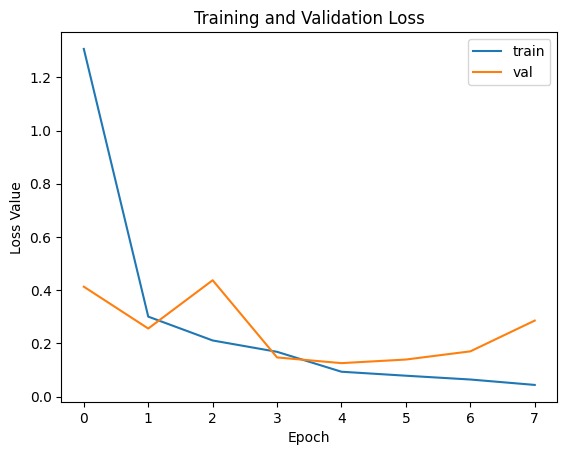

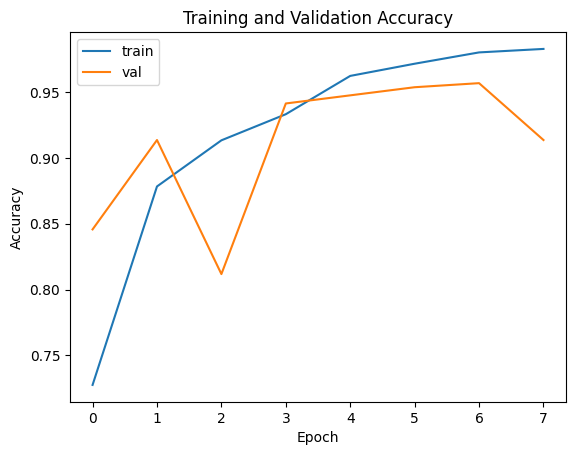

learning rate:  0.01 batch size:  32 image shape:  32
Epoch 1/400
48/48 [==============================] - 6s 30ms/step - loss: 0.5894 - accuracy: 0.7024 - val_loss: 0.5244 - val_accuracy: 0.7500
Epoch 2/400
48/48 [==============================] - 1s 11ms/step - loss: 0.4601 - accuracy: 0.7864 - val_loss: 0.4472 - val_accuracy: 0.7840
Epoch 3/400
48/48 [==============================] - 1s 11ms/step - loss: 0.3860 - accuracy: 0.8208 - val_loss: 0.4235 - val_accuracy: 0.7809
Epoch 4/400
48/48 [==============================] - 1s 11ms/step - loss: 0.3498 - accuracy: 0.8366 - val_loss: 0.3677 - val_accuracy: 0.8302
Epoch 5/400
48/48 [==============================] - 0s 10ms/step - loss: 0.3029 - accuracy: 0.8743 - val_loss: 0.3724 - val_accuracy: 0.8457
Epoch 6/400
48/48 [==============================] - 0s 10ms/step - loss: 0.2645 - accuracy: 0.8915 - val_loss: 0.3296 - val_accuracy: 0.8704
Epoch 7/400
48/48 [==============================] - 0s 10ms/step - loss: 0.2443 - accuracy: 0

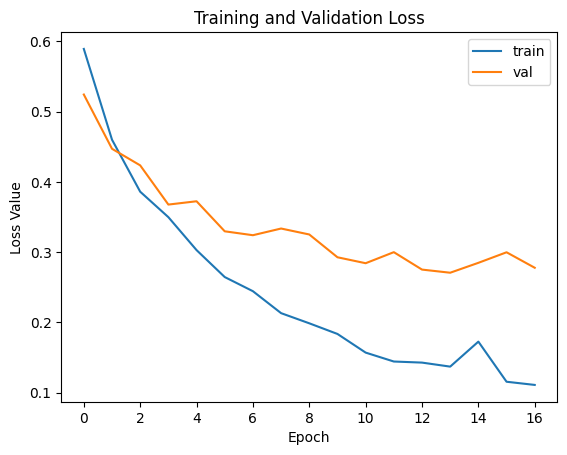

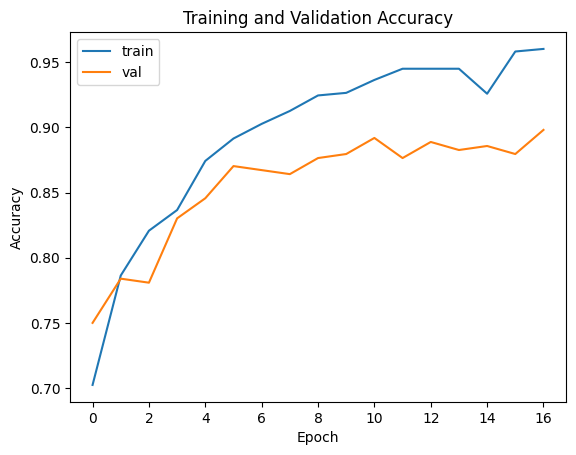

learning rate:  0.01 batch size:  64 image shape:  256
Epoch 1/400
24/24 [==============================] - 7s 193ms/step - loss: 3.5441 - accuracy: 0.5668 - val_loss: 0.8399 - val_accuracy: 0.6327
Epoch 2/400
24/24 [==============================] - 3s 129ms/step - loss: 0.6187 - accuracy: 0.6931 - val_loss: 0.5045 - val_accuracy: 0.7747
Epoch 3/400
24/24 [==============================] - 3s 129ms/step - loss: 0.5250 - accuracy: 0.7659 - val_loss: 0.4574 - val_accuracy: 0.7994
Epoch 4/400
24/24 [==============================] - 3s 130ms/step - loss: 0.4976 - accuracy: 0.7751 - val_loss: 0.4383 - val_accuracy: 0.8117
Epoch 5/400
24/24 [==============================] - 3s 129ms/step - loss: 0.4507 - accuracy: 0.7956 - val_loss: 0.3909 - val_accuracy: 0.8302
Epoch 6/400
24/24 [==============================] - 3s 130ms/step - loss: 0.4116 - accuracy: 0.8280 - val_loss: 0.3657 - val_accuracy: 0.8364
Epoch 7/400
24/24 [==============================] - 3s 131ms/step - loss: 0.3524 - acc

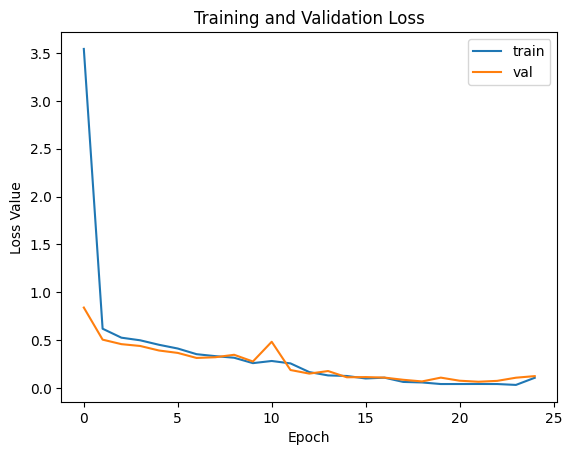

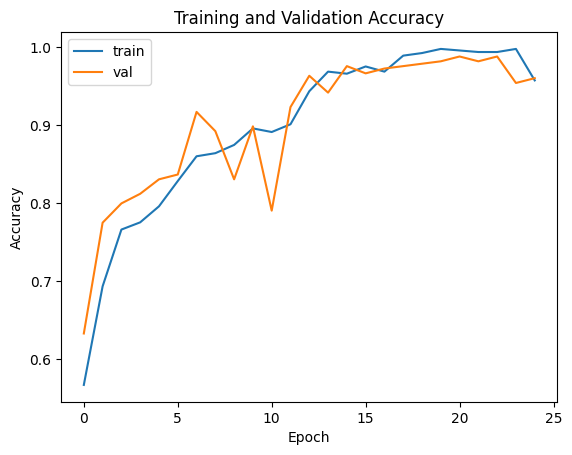

learning rate:  0.01 batch size:  64 image shape:  128
Epoch 1/400
24/24 [==============================] - 5s 84ms/step - loss: 1.9894 - accuracy: 0.6164 - val_loss: 0.4723 - val_accuracy: 0.8148
Epoch 2/400
24/24 [==============================] - 1s 38ms/step - loss: 0.4804 - accuracy: 0.7851 - val_loss: 0.4153 - val_accuracy: 0.8580
Epoch 3/400
24/24 [==============================] - 1s 38ms/step - loss: 0.4198 - accuracy: 0.8142 - val_loss: 0.3565 - val_accuracy: 0.8704
Epoch 4/400
24/24 [==============================] - 1s 38ms/step - loss: 0.3324 - accuracy: 0.8671 - val_loss: 0.2727 - val_accuracy: 0.9105
Epoch 5/400
24/24 [==============================] - 1s 38ms/step - loss: 0.2393 - accuracy: 0.9200 - val_loss: 0.2323 - val_accuracy: 0.9105
Epoch 6/400
24/24 [==============================] - 1s 38ms/step - loss: 0.2013 - accuracy: 0.9306 - val_loss: 0.1839 - val_accuracy: 0.9259
Epoch 7/400
24/24 [==============================] - 1s 38ms/step - loss: 0.1241 - accuracy: 

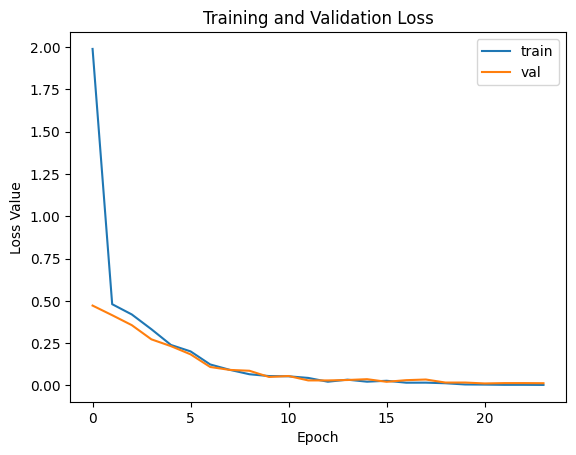

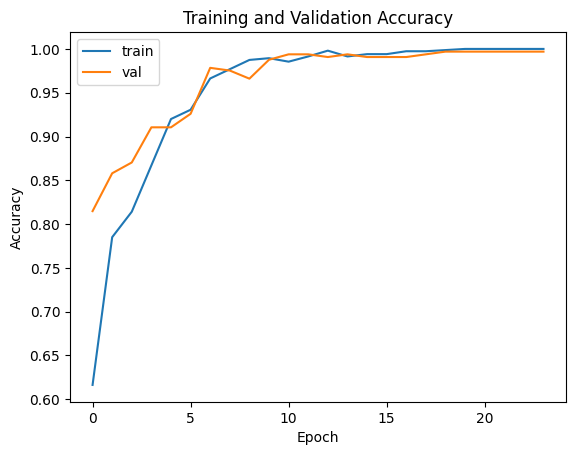

learning rate:  0.01 batch size:  64 image shape:  64
Epoch 1/400
24/24 [==============================] - 4s 57ms/step - loss: 2.3518 - accuracy: 0.6759 - val_loss: 0.4099 - val_accuracy: 0.8179
Epoch 2/400
24/24 [==============================] - 0s 17ms/step - loss: 0.3717 - accuracy: 0.8360 - val_loss: 0.3053 - val_accuracy: 0.8796
Epoch 3/400
24/24 [==============================] - 0s 17ms/step - loss: 0.2426 - accuracy: 0.9001 - val_loss: 0.2491 - val_accuracy: 0.9012
Epoch 4/400
24/24 [==============================] - 0s 16ms/step - loss: 0.1732 - accuracy: 0.9345 - val_loss: 0.2287 - val_accuracy: 0.9136
Epoch 5/400
24/24 [==============================] - 0s 16ms/step - loss: 0.1352 - accuracy: 0.9478 - val_loss: 0.1541 - val_accuracy: 0.9352
Epoch 6/400
24/24 [==============================] - 0s 17ms/step - loss: 0.2245 - accuracy: 0.8981 - val_loss: 0.2014 - val_accuracy: 0.9290
Epoch 7/400
24/24 [==============================] - 0s 17ms/step - loss: 0.1707 - accuracy: 0

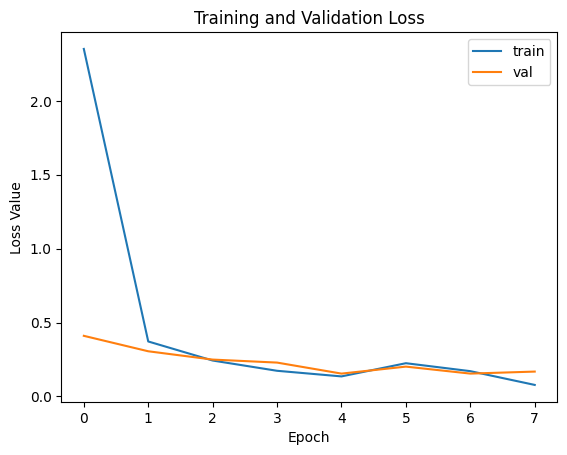

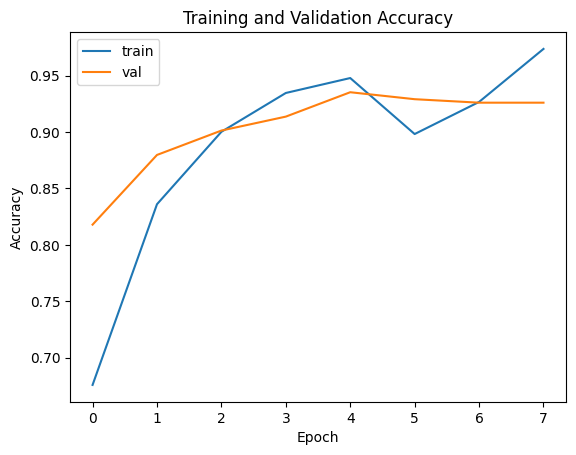

learning rate:  0.01 batch size:  64 image shape:  32
Epoch 1/400
24/24 [==============================] - 4s 50ms/step - loss: 0.6233 - accuracy: 0.6495 - val_loss: 0.5272 - val_accuracy: 0.7654
Epoch 2/400
24/24 [==============================] - 0s 14ms/step - loss: 0.4760 - accuracy: 0.7738 - val_loss: 0.4678 - val_accuracy: 0.7623
Epoch 3/400
24/24 [==============================] - 0s 12ms/step - loss: 0.4180 - accuracy: 0.8049 - val_loss: 0.4372 - val_accuracy: 0.7901
Epoch 4/400
24/24 [==============================] - 0s 11ms/step - loss: 0.3815 - accuracy: 0.8267 - val_loss: 0.3895 - val_accuracy: 0.8086
Epoch 5/400
24/24 [==============================] - 0s 11ms/step - loss: 0.3373 - accuracy: 0.8472 - val_loss: 0.3585 - val_accuracy: 0.8364
Epoch 6/400
24/24 [==============================] - 0s 11ms/step - loss: 0.3001 - accuracy: 0.8783 - val_loss: 0.3437 - val_accuracy: 0.8426
Epoch 7/400
24/24 [==============================] - 0s 11ms/step - loss: 0.2717 - accuracy: 0

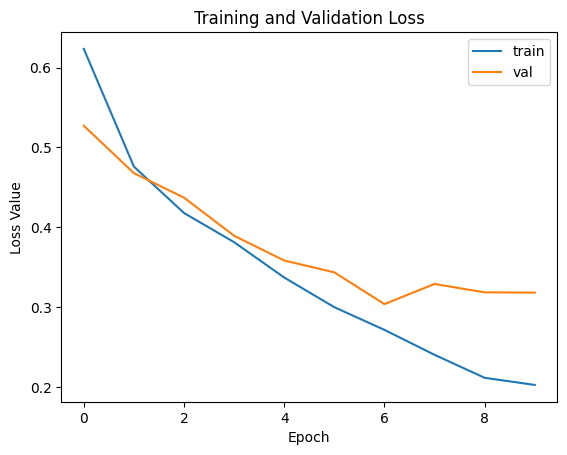

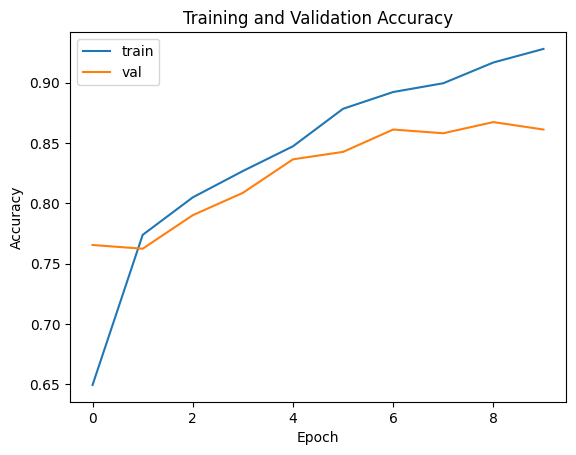

learning rate:  0.01 batch size:  128 image shape:  256
Epoch 1/400
12/12 [==============================] - 7s 385ms/step - loss: 2.7111 - accuracy: 0.5913 - val_loss: 0.6319 - val_accuracy: 0.7562
Epoch 2/400
12/12 [==============================] - 3s 253ms/step - loss: 0.6169 - accuracy: 0.7050 - val_loss: 0.5295 - val_accuracy: 0.7870
Epoch 3/400
12/12 [==============================] - 3s 254ms/step - loss: 0.5213 - accuracy: 0.7791 - val_loss: 0.4774 - val_accuracy: 0.7901
Epoch 4/400
12/12 [==============================] - 3s 254ms/step - loss: 0.4915 - accuracy: 0.7910 - val_loss: 0.4441 - val_accuracy: 0.8025
Epoch 5/400
12/12 [==============================] - 3s 254ms/step - loss: 0.4757 - accuracy: 0.7890 - val_loss: 0.4125 - val_accuracy: 0.8179
Epoch 6/400
12/12 [==============================] - 3s 255ms/step - loss: 0.4474 - accuracy: 0.8142 - val_loss: 0.3734 - val_accuracy: 0.8673
Epoch 7/400
12/12 [==============================] - 3s 256ms/step - loss: 0.4236 - ac

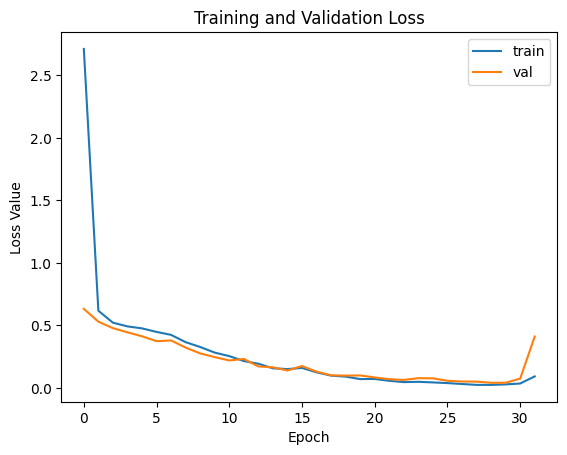

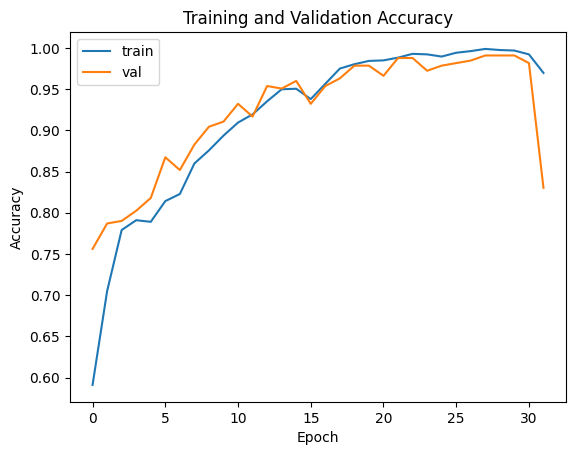

learning rate:  0.01 batch size:  128 image shape:  128
Epoch 1/400
12/12 [==============================] - 5s 166ms/step - loss: 3.6375 - accuracy: 0.6052 - val_loss: 1.0166 - val_accuracy: 0.6265
Epoch 2/400
12/12 [==============================] - 1s 73ms/step - loss: 0.6467 - accuracy: 0.6991 - val_loss: 0.5489 - val_accuracy: 0.7377
Epoch 3/400
12/12 [==============================] - 1s 72ms/step - loss: 0.4708 - accuracy: 0.7804 - val_loss: 0.4257 - val_accuracy: 0.8241
Epoch 4/400
12/12 [==============================] - 1s 72ms/step - loss: 0.4232 - accuracy: 0.8069 - val_loss: 0.3855 - val_accuracy: 0.8364
Epoch 5/400
12/12 [==============================] - 1s 74ms/step - loss: 0.3830 - accuracy: 0.8399 - val_loss: 0.3331 - val_accuracy: 0.9043
Epoch 6/400
12/12 [==============================] - 1s 74ms/step - loss: 0.3424 - accuracy: 0.8697 - val_loss: 0.3197 - val_accuracy: 0.8549
Epoch 7/400
12/12 [==============================] - 1s 73ms/step - loss: 0.3001 - accuracy

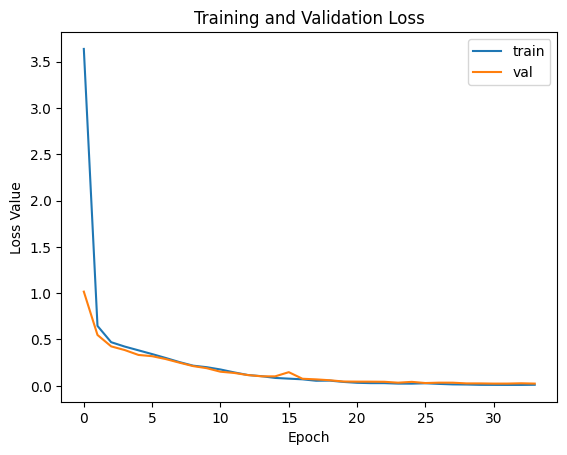

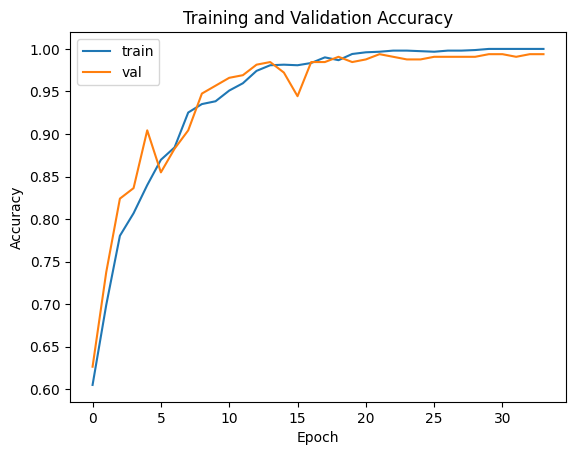

learning rate:  0.01 batch size:  128 image shape:  64
Epoch 1/400
12/12 [==============================] - 4s 113ms/step - loss: 7.4281 - accuracy: 0.5357 - val_loss: 0.9158 - val_accuracy: 0.6019
Epoch 2/400
12/12 [==============================] - 0s 29ms/step - loss: 0.7989 - accuracy: 0.6356 - val_loss: 0.5990 - val_accuracy: 0.6481
Epoch 3/400
12/12 [==============================] - 0s 27ms/step - loss: 0.5251 - accuracy: 0.7077 - val_loss: 0.4615 - val_accuracy: 0.7654
Epoch 4/400
12/12 [==============================] - 0s 27ms/step - loss: 0.3818 - accuracy: 0.8214 - val_loss: 0.3598 - val_accuracy: 0.8457
Epoch 5/400
12/12 [==============================] - 0s 27ms/step - loss: 0.2734 - accuracy: 0.8796 - val_loss: 0.2636 - val_accuracy: 0.8858
Epoch 6/400
12/12 [==============================] - 0s 27ms/step - loss: 0.2081 - accuracy: 0.9087 - val_loss: 0.2991 - val_accuracy: 0.8765
Epoch 7/400
12/12 [==============================] - 0s 27ms/step - loss: 0.1743 - accuracy:

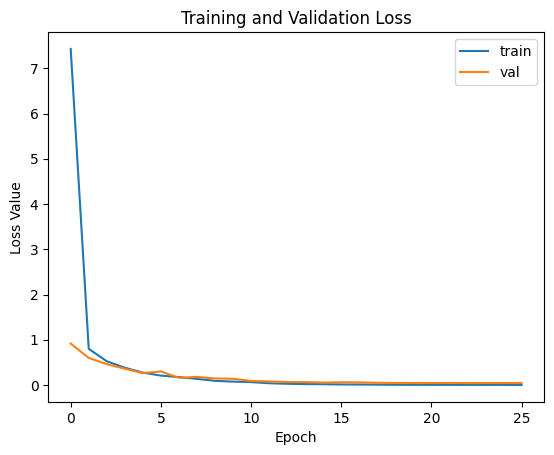

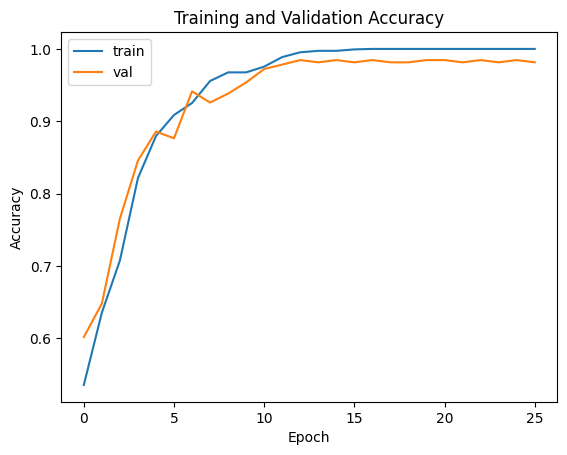

learning rate:  0.01 batch size:  128 image shape:  32
Epoch 1/400
12/12 [==============================] - 4s 98ms/step - loss: 0.6204 - accuracy: 0.6601 - val_loss: 0.5586 - val_accuracy: 0.7593
Epoch 2/400
12/12 [==============================] - 0s 20ms/step - loss: 0.5241 - accuracy: 0.7447 - val_loss: 0.4896 - val_accuracy: 0.7716
Epoch 3/400
12/12 [==============================] - 0s 17ms/step - loss: 0.4638 - accuracy: 0.7791 - val_loss: 0.4645 - val_accuracy: 0.7932
Epoch 4/400
12/12 [==============================] - 0s 16ms/step - loss: 0.4298 - accuracy: 0.7970 - val_loss: 0.4537 - val_accuracy: 0.7932
Epoch 5/400
12/12 [==============================] - 0s 17ms/step - loss: 0.3867 - accuracy: 0.8320 - val_loss: 0.3869 - val_accuracy: 0.8179
Epoch 6/400
12/12 [==============================] - 0s 16ms/step - loss: 0.3532 - accuracy: 0.8439 - val_loss: 0.3819 - val_accuracy: 0.8272
Epoch 7/400
12/12 [==============================] - 0s 16ms/step - loss: 0.3209 - accuracy: 

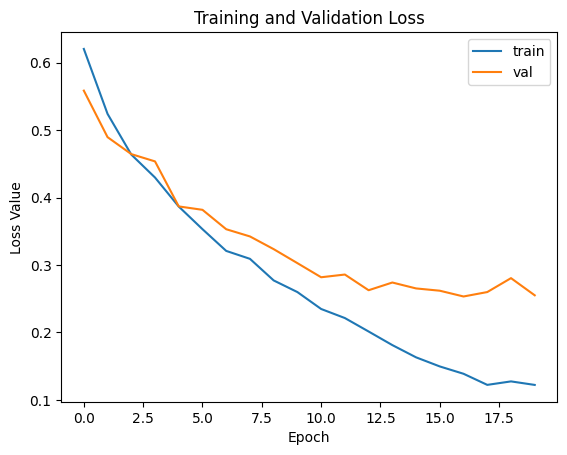

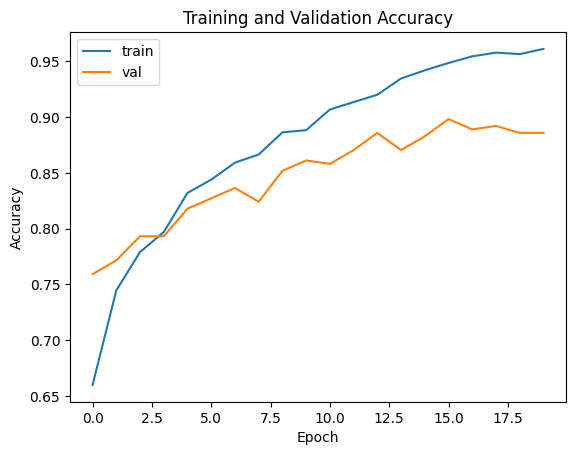

learning rate:  0.1 batch size:  16 image shape:  256
Epoch 1/400
95/95 [==============================] - 8s 54ms/step - loss: 7.1183 - accuracy: 0.5985 - val_loss: 0.5530 - val_accuracy: 0.7500
Epoch 2/400
95/95 [==============================] - 4s 37ms/step - loss: 0.6350 - accuracy: 0.6700 - val_loss: 0.7004 - val_accuracy: 0.4877
Epoch 3/400
95/95 [==============================] - 4s 37ms/step - loss: 0.6923 - accuracy: 0.5179 - val_loss: 0.6864 - val_accuracy: 0.5247
Epoch 4/400
95/95 [==============================] - 4s 38ms/step - loss: 0.6849 - accuracy: 0.5589 - val_loss: 0.7109 - val_accuracy: 0.4877


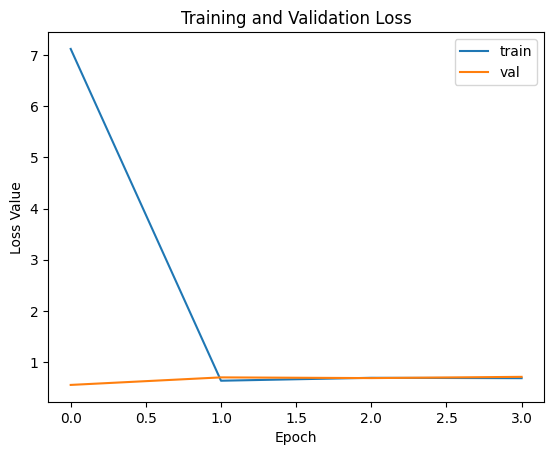

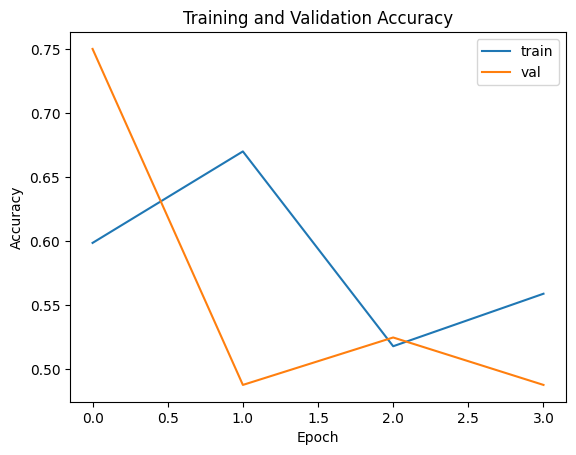

learning rate:  0.1 batch size:  16 image shape:  128
Epoch 1/400
95/95 [==============================] - 7s 26ms/step - loss: 9.5694 - accuracy: 0.6687 - val_loss: 0.5738 - val_accuracy: 0.7377
Epoch 2/400
95/95 [==============================] - 1s 14ms/step - loss: 0.5615 - accuracy: 0.7017 - val_loss: 0.4251 - val_accuracy: 0.7716
Epoch 3/400
95/95 [==============================] - 1s 14ms/step - loss: 0.4898 - accuracy: 0.7526 - val_loss: 0.8838 - val_accuracy: 0.7130
Epoch 4/400
95/95 [==============================] - 1s 14ms/step - loss: 0.5244 - accuracy: 0.7520 - val_loss: 0.6412 - val_accuracy: 0.6574
Epoch 5/400
95/95 [==============================] - 1s 14ms/step - loss: 0.4745 - accuracy: 0.7884 - val_loss: 0.4555 - val_accuracy: 0.7994


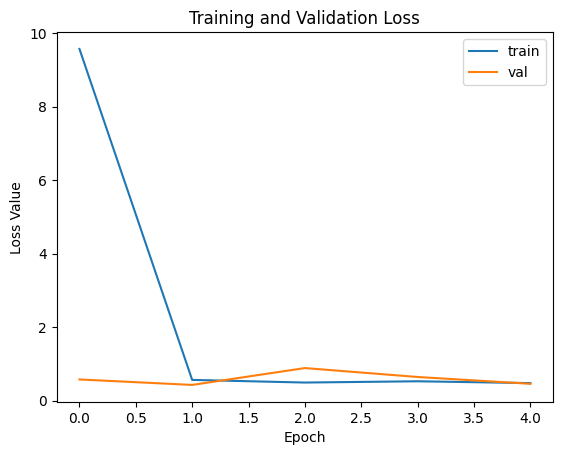

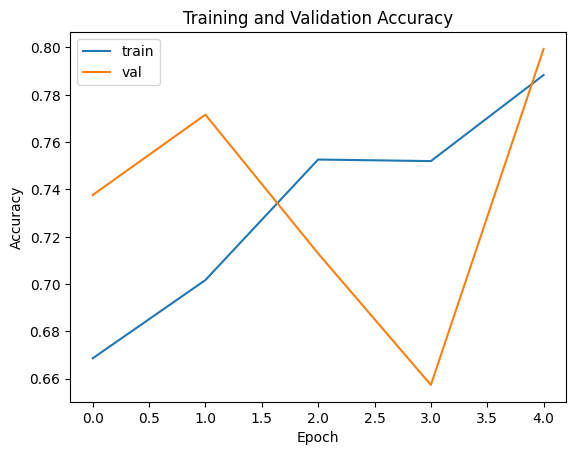

learning rate:  0.1 batch size:  16 image shape:  64
Epoch 1/400
95/95 [==============================] - 5s 21ms/step - loss: 22.5129 - accuracy: 0.6534 - val_loss: 1.2962 - val_accuracy: 0.7006
Epoch 2/400
95/95 [==============================] - 1s 11ms/step - loss: 0.6163 - accuracy: 0.7361 - val_loss: 0.3552 - val_accuracy: 0.8272
Epoch 3/400
95/95 [==============================] - 1s 10ms/step - loss: 0.3624 - accuracy: 0.8479 - val_loss: 0.4443 - val_accuracy: 0.7531
Epoch 4/400
95/95 [==============================] - 1s 10ms/step - loss: 0.3548 - accuracy: 0.8208 - val_loss: 0.5341 - val_accuracy: 0.8611
Epoch 5/400
95/95 [==============================] - 1s 10ms/step - loss: 0.3299 - accuracy: 0.8591 - val_loss: 0.2913 - val_accuracy: 0.8457
Epoch 6/400
95/95 [==============================] - 1s 11ms/step - loss: 0.3229 - accuracy: 0.8307 - val_loss: 0.5245 - val_accuracy: 0.7222
Epoch 7/400
95/95 [==============================] - 1s 11ms/step - loss: 0.3270 - accuracy: 0

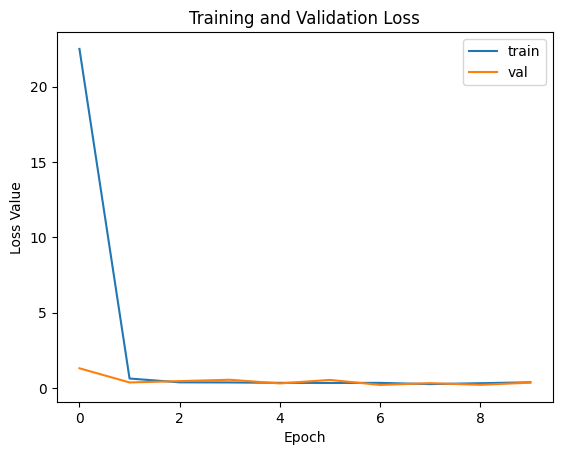

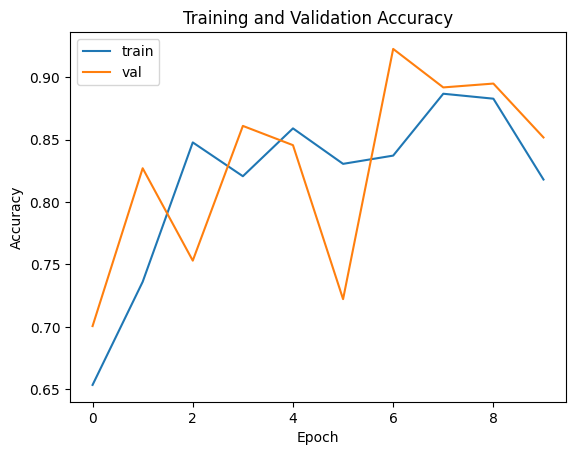

learning rate:  0.1 batch size:  16 image shape:  32
Epoch 1/400
95/95 [==============================] - 5s 19ms/step - loss: 0.7684 - accuracy: 0.6534 - val_loss: 0.5387 - val_accuracy: 0.7500
Epoch 2/400
95/95 [==============================] - 1s 12ms/step - loss: 0.5419 - accuracy: 0.7315 - val_loss: 0.4714 - val_accuracy: 0.7593
Epoch 3/400
95/95 [==============================] - 1s 13ms/step - loss: 0.5014 - accuracy: 0.7434 - val_loss: 0.5393 - val_accuracy: 0.7191
Epoch 4/400
95/95 [==============================] - 1s 12ms/step - loss: 0.4604 - accuracy: 0.7507 - val_loss: 0.4414 - val_accuracy: 0.7932
Epoch 5/400
95/95 [==============================] - 1s 12ms/step - loss: 0.4418 - accuracy: 0.7798 - val_loss: 0.5059 - val_accuracy: 0.7500
Epoch 6/400
95/95 [==============================] - 1s 11ms/step - loss: 0.4138 - accuracy: 0.7784 - val_loss: 0.3956 - val_accuracy: 0.8117
Epoch 7/400
95/95 [==============================] - 1s 11ms/step - loss: 0.4369 - accuracy: 0.

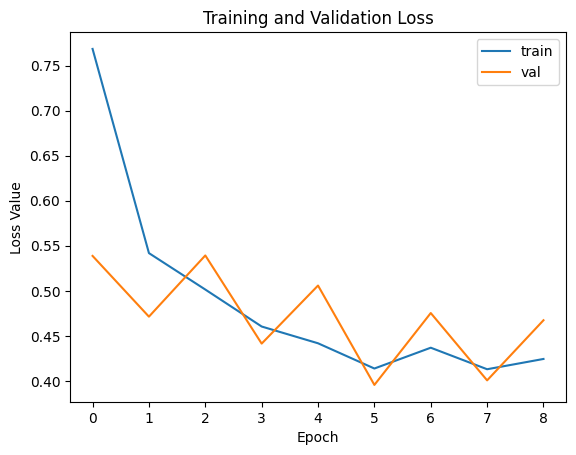

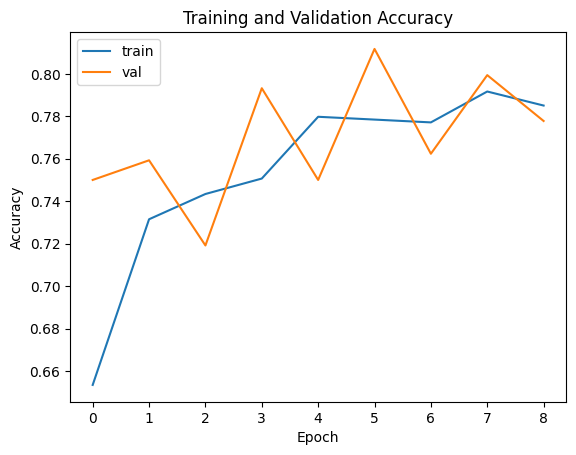

learning rate:  0.1 batch size:  32 image shape:  256
Epoch 1/400
48/48 [==============================] - 8s 100ms/step - loss: 21.2772 - accuracy: 0.5417 - val_loss: 0.5629 - val_accuracy: 0.7562
Epoch 2/400
48/48 [==============================] - 3s 69ms/step - loss: 0.6042 - accuracy: 0.7460 - val_loss: 0.5373 - val_accuracy: 0.7531
Epoch 3/400
48/48 [==============================] - 3s 69ms/step - loss: 0.5181 - accuracy: 0.7751 - val_loss: 0.4741 - val_accuracy: 0.8025
Epoch 4/400
48/48 [==============================] - 3s 70ms/step - loss: 0.4924 - accuracy: 0.7831 - val_loss: 0.4174 - val_accuracy: 0.8302
Epoch 5/400
48/48 [==============================] - 3s 72ms/step - loss: 0.4226 - accuracy: 0.8327 - val_loss: 0.4824 - val_accuracy: 0.7778
Epoch 6/400
48/48 [==============================] - 3s 69ms/step - loss: 0.4442 - accuracy: 0.8082 - val_loss: 0.3613 - val_accuracy: 0.8488
Epoch 7/400
48/48 [==============================] - 3s 70ms/step - loss: 0.3909 - accuracy:

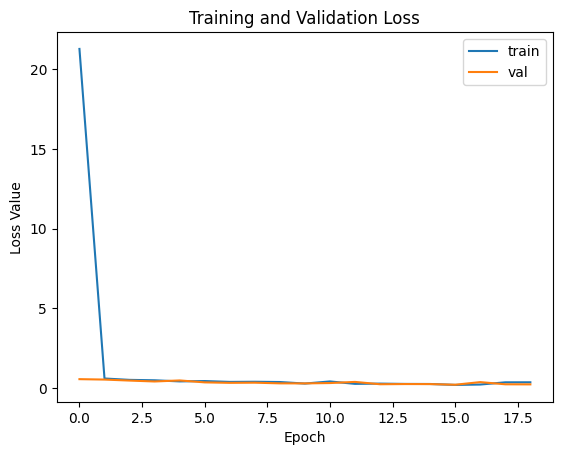

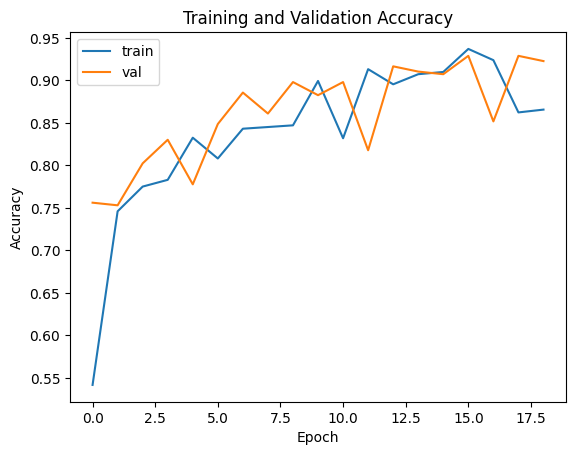

learning rate:  0.1 batch size:  32 image shape:  128
Epoch 1/400
48/48 [==============================] - 5s 45ms/step - loss: 25.8604 - accuracy: 0.6098 - val_loss: 0.5399 - val_accuracy: 0.7901
Epoch 2/400
48/48 [==============================] - 1s 22ms/step - loss: 0.5037 - accuracy: 0.7784 - val_loss: 0.3661 - val_accuracy: 0.8333
Epoch 3/400
48/48 [==============================] - 1s 22ms/step - loss: 0.3892 - accuracy: 0.8406 - val_loss: 0.2491 - val_accuracy: 0.9198
Epoch 4/400
48/48 [==============================] - 1s 22ms/step - loss: 0.3461 - accuracy: 0.8479 - val_loss: 0.2428 - val_accuracy: 0.9321
Epoch 5/400
48/48 [==============================] - 1s 22ms/step - loss: 0.1952 - accuracy: 0.9292 - val_loss: 0.4512 - val_accuracy: 0.7593
Epoch 6/400
48/48 [==============================] - 1s 22ms/step - loss: 0.1758 - accuracy: 0.9345 - val_loss: 0.1700 - val_accuracy: 0.9290
Epoch 7/400
48/48 [==============================] - 1s 22ms/step - loss: 0.2264 - accuracy: 

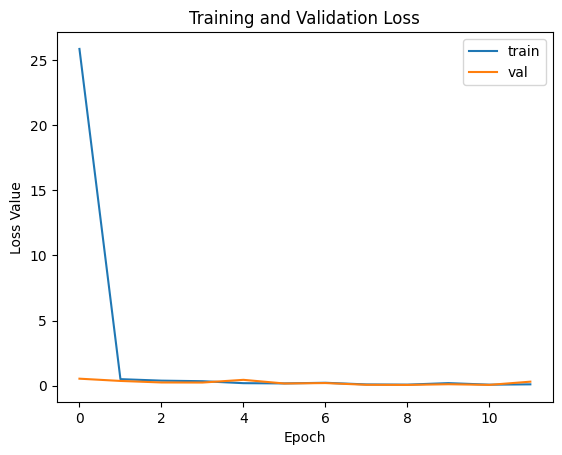

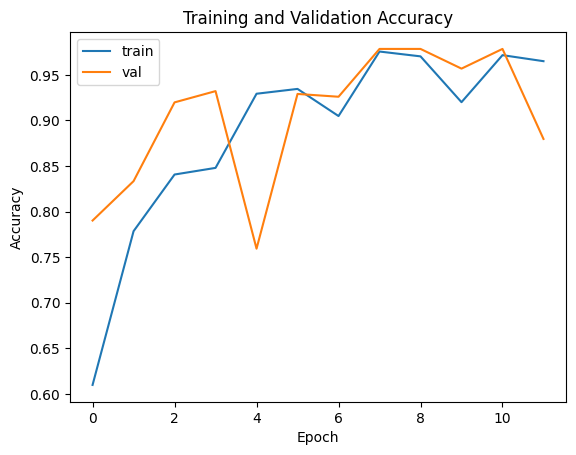

learning rate:  0.1 batch size:  32 image shape:  64
Epoch 1/400
48/48 [==============================] - 4s 34ms/step - loss: 43.1667 - accuracy: 0.6012 - val_loss: 0.5743 - val_accuracy: 0.6975
Epoch 2/400
48/48 [==============================] - 1s 14ms/step - loss: 0.5257 - accuracy: 0.7474 - val_loss: 0.4533 - val_accuracy: 0.7963
Epoch 3/400
48/48 [==============================] - 1s 13ms/step - loss: 0.4471 - accuracy: 0.7996 - val_loss: 0.6128 - val_accuracy: 0.6636
Epoch 4/400
48/48 [==============================] - 1s 12ms/step - loss: 0.4222 - accuracy: 0.8168 - val_loss: 0.3314 - val_accuracy: 0.8796
Epoch 5/400
48/48 [==============================] - 1s 11ms/step - loss: 0.3467 - accuracy: 0.8651 - val_loss: 0.3301 - val_accuracy: 0.8580
Epoch 6/400
48/48 [==============================] - 1s 13ms/step - loss: 0.3023 - accuracy: 0.8816 - val_loss: 0.2870 - val_accuracy: 0.8858
Epoch 7/400
48/48 [==============================] - 1s 11ms/step - loss: 0.2330 - accuracy: 0

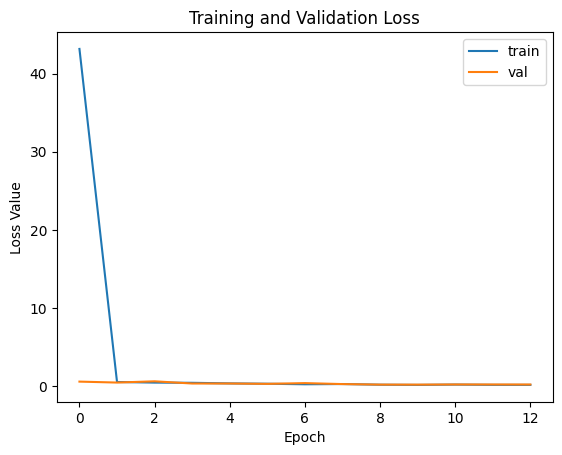

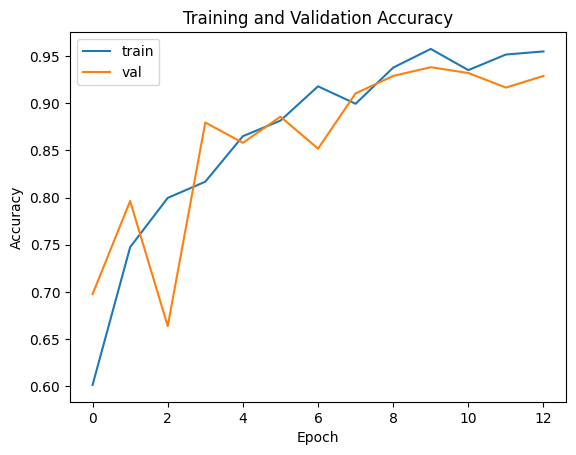

learning rate:  0.1 batch size:  32 image shape:  32
Epoch 1/400
48/48 [==============================] - 4s 30ms/step - loss: 1.2906 - accuracy: 0.5602 - val_loss: 0.5844 - val_accuracy: 0.7037
Epoch 2/400
48/48 [==============================] - 1s 11ms/step - loss: 0.5360 - accuracy: 0.7328 - val_loss: 0.4817 - val_accuracy: 0.7747
Epoch 3/400
48/48 [==============================] - 1s 11ms/step - loss: 0.5083 - accuracy: 0.7381 - val_loss: 0.4857 - val_accuracy: 0.7685
Epoch 4/400
48/48 [==============================] - 0s 10ms/step - loss: 0.4575 - accuracy: 0.7817 - val_loss: 0.4485 - val_accuracy: 0.7901
Epoch 5/400
48/48 [==============================] - 0s 10ms/step - loss: 0.4477 - accuracy: 0.7804 - val_loss: 0.4712 - val_accuracy: 0.7562
Epoch 6/400
48/48 [==============================] - 0s 10ms/step - loss: 0.4386 - accuracy: 0.7897 - val_loss: 0.4467 - val_accuracy: 0.7870
Epoch 7/400
48/48 [==============================] - 0s 10ms/step - loss: 0.4052 - accuracy: 0.

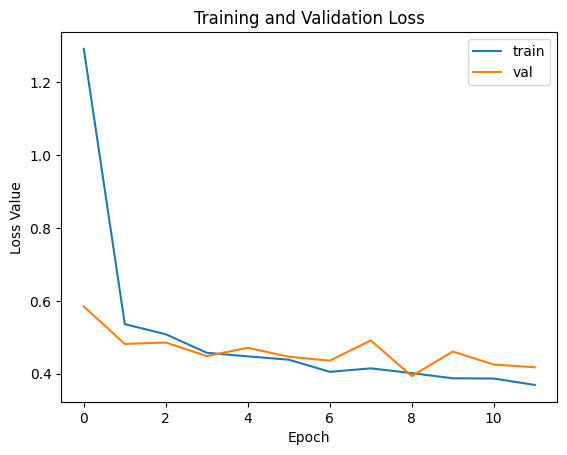

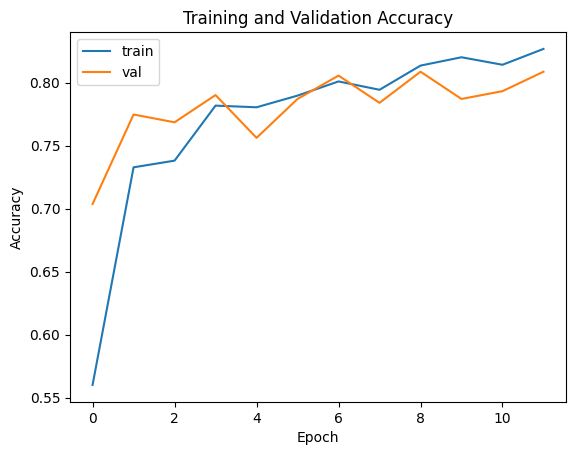

learning rate:  0.1 batch size:  64 image shape:  256
Epoch 1/400
24/24 [==============================] - 7s 193ms/step - loss: 39.9364 - accuracy: 0.4987 - val_loss: 0.6457 - val_accuracy: 0.5123
Epoch 2/400
24/24 [==============================] - 3s 130ms/step - loss: 0.6238 - accuracy: 0.7103 - val_loss: 0.5541 - val_accuracy: 0.7593
Epoch 3/400
24/24 [==============================] - 3s 130ms/step - loss: 0.5556 - accuracy: 0.7573 - val_loss: 0.4979 - val_accuracy: 0.7747
Epoch 4/400
24/24 [==============================] - 3s 130ms/step - loss: 0.5176 - accuracy: 0.7778 - val_loss: 0.4591 - val_accuracy: 0.8272
Epoch 5/400
24/24 [==============================] - 3s 129ms/step - loss: 0.4953 - accuracy: 0.7778 - val_loss: 0.4272 - val_accuracy: 0.8333
Epoch 6/400
24/24 [==============================] - 3s 129ms/step - loss: 0.4574 - accuracy: 0.8155 - val_loss: 0.4266 - val_accuracy: 0.8426
Epoch 7/400
24/24 [==============================] - 3s 130ms/step - loss: 0.4246 - acc

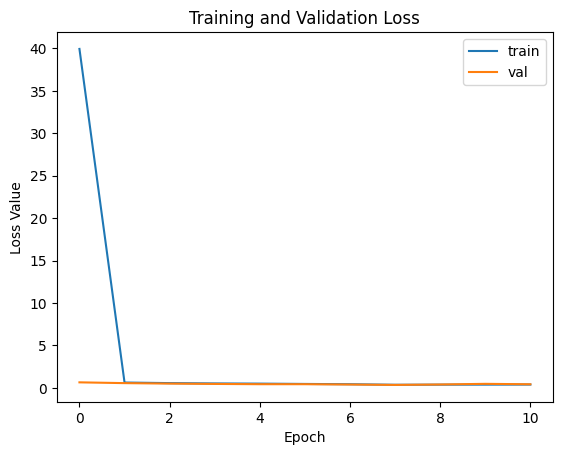

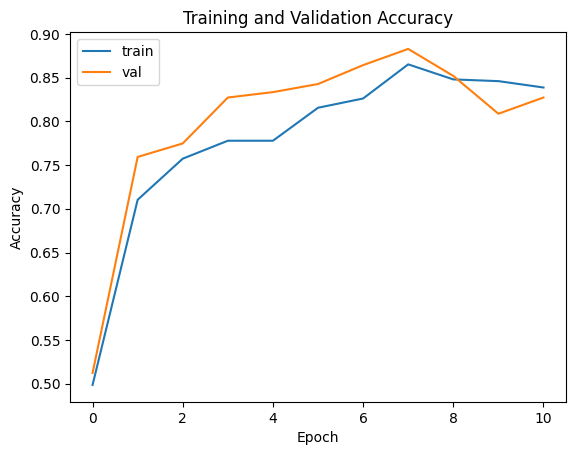

learning rate:  0.1 batch size:  64 image shape:  128
Epoch 1/400
24/24 [==============================] - 5s 83ms/step - loss: 39.8061 - accuracy: 0.5132 - val_loss: 1.5505 - val_accuracy: 0.4877
Epoch 2/400
24/24 [==============================] - 1s 38ms/step - loss: 0.6783 - accuracy: 0.5708 - val_loss: 0.5708 - val_accuracy: 0.7685
Epoch 3/400
24/24 [==============================] - 1s 38ms/step - loss: 0.5566 - accuracy: 0.7328 - val_loss: 0.4818 - val_accuracy: 0.7716
Epoch 4/400
24/24 [==============================] - 1s 39ms/step - loss: 0.4845 - accuracy: 0.7646 - val_loss: 0.4242 - val_accuracy: 0.7901
Epoch 5/400
24/24 [==============================] - 1s 39ms/step - loss: 0.3920 - accuracy: 0.7857 - val_loss: 0.3492 - val_accuracy: 0.8148
Epoch 6/400
24/24 [==============================] - 1s 39ms/step - loss: 0.3190 - accuracy: 0.8340 - val_loss: 0.3359 - val_accuracy: 0.8025
Epoch 7/400
24/24 [==============================] - 1s 39ms/step - loss: 0.2979 - accuracy: 

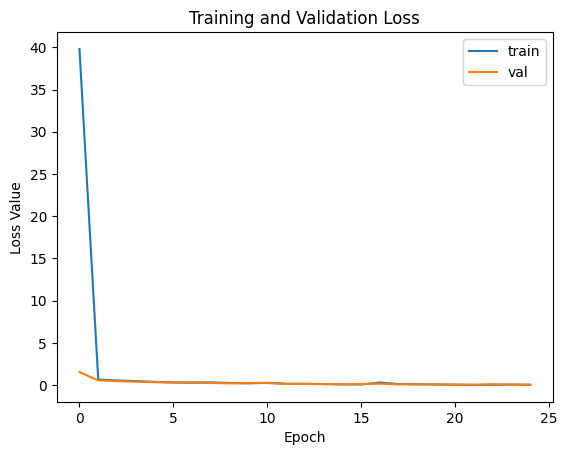

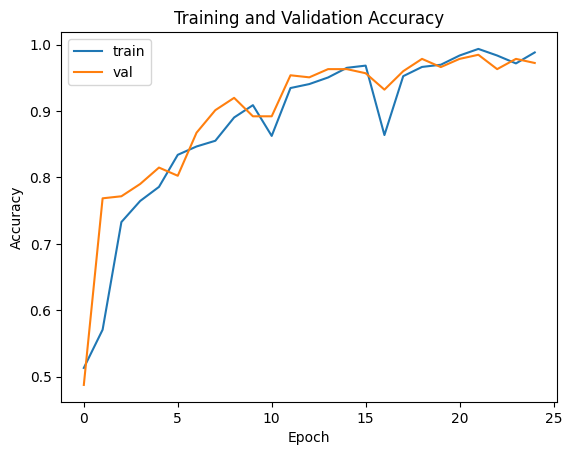

learning rate:  0.1 batch size:  64 image shape:  64
Epoch 1/400
24/24 [==============================] - 4s 58ms/step - loss: 83.8202 - accuracy: 0.5516 - val_loss: 1.1268 - val_accuracy: 0.6142
Epoch 2/400
24/24 [==============================] - 0s 17ms/step - loss: 0.5367 - accuracy: 0.7599 - val_loss: 0.3439 - val_accuracy: 0.8364
Epoch 3/400
24/24 [==============================] - 0s 17ms/step - loss: 0.3894 - accuracy: 0.8280 - val_loss: 0.4242 - val_accuracy: 0.8117
Epoch 4/400
24/24 [==============================] - 0s 17ms/step - loss: 0.2957 - accuracy: 0.8737 - val_loss: 0.2758 - val_accuracy: 0.8580
Epoch 5/400
24/24 [==============================] - 0s 17ms/step - loss: 0.2181 - accuracy: 0.9048 - val_loss: 0.2403 - val_accuracy: 0.8951
Epoch 6/400
24/24 [==============================] - 0s 16ms/step - loss: 0.1791 - accuracy: 0.9233 - val_loss: 0.1888 - val_accuracy: 0.9321
Epoch 7/400
24/24 [==============================] - 0s 16ms/step - loss: 0.1217 - accuracy: 0

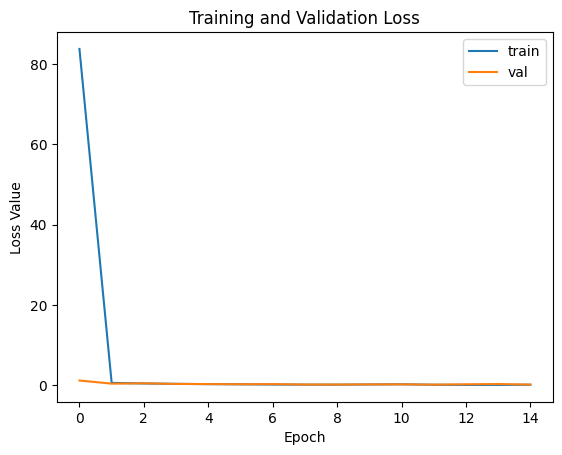

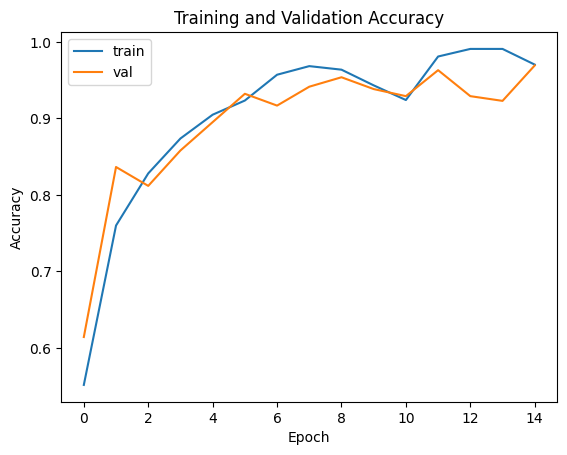

learning rate:  0.1 batch size:  64 image shape:  32
Epoch 1/400
24/24 [==============================] - 4s 52ms/step - loss: 1.7255 - accuracy: 0.5132 - val_loss: 0.6736 - val_accuracy: 0.5123
Epoch 2/400
24/24 [==============================] - 0s 14ms/step - loss: 0.6521 - accuracy: 0.6442 - val_loss: 0.6020 - val_accuracy: 0.6914
Epoch 3/400
24/24 [==============================] - 0s 13ms/step - loss: 0.5772 - accuracy: 0.7229 - val_loss: 0.5349 - val_accuracy: 0.7253
Epoch 4/400
24/24 [==============================] - 0s 13ms/step - loss: 0.5307 - accuracy: 0.7540 - val_loss: 0.5041 - val_accuracy: 0.7531
Epoch 5/400
24/24 [==============================] - 0s 12ms/step - loss: 0.4989 - accuracy: 0.7599 - val_loss: 0.4552 - val_accuracy: 0.7963
Epoch 6/400
24/24 [==============================] - 0s 13ms/step - loss: 0.4616 - accuracy: 0.7857 - val_loss: 0.4423 - val_accuracy: 0.7994
Epoch 7/400
24/24 [==============================] - 0s 12ms/step - loss: 0.4420 - accuracy: 0.

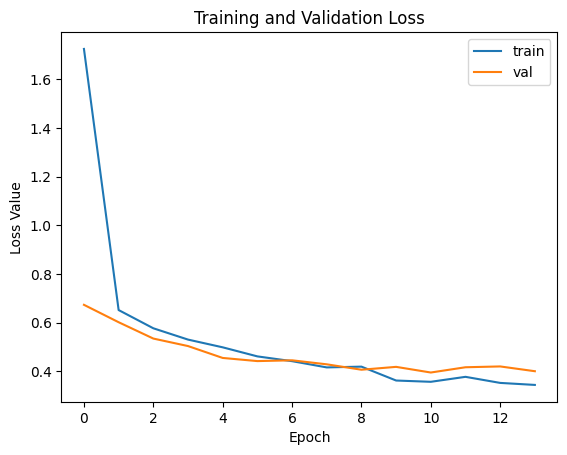

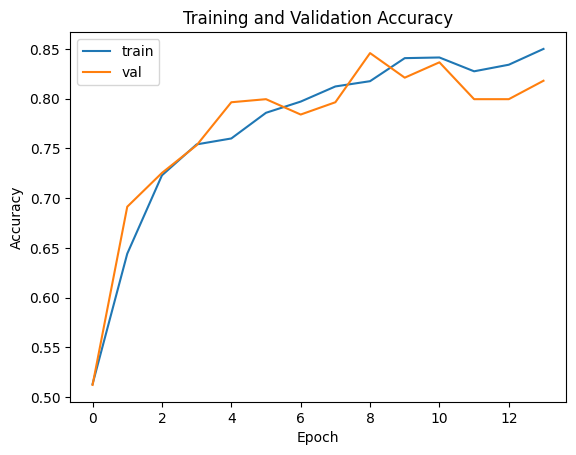

learning rate:  0.1 batch size:  128 image shape:  256
Epoch 1/400
12/12 [==============================] - 7s 386ms/step - loss: 69.4883 - accuracy: 0.5040 - val_loss: 3.0788 - val_accuracy: 0.4167
Epoch 2/400
12/12 [==============================] - 3s 254ms/step - loss: 1.3999 - accuracy: 0.5337 - val_loss: 0.8039 - val_accuracy: 0.4877
Epoch 3/400
12/12 [==============================] - 3s 254ms/step - loss: 0.7360 - accuracy: 0.5251 - val_loss: 0.8029 - val_accuracy: 0.4877
Epoch 4/400
12/12 [==============================] - 3s 254ms/step - loss: 0.6491 - accuracy: 0.6601 - val_loss: 0.5375 - val_accuracy: 0.7438
Epoch 5/400
12/12 [==============================] - 3s 255ms/step - loss: 0.5586 - accuracy: 0.7480 - val_loss: 0.5042 - val_accuracy: 0.7593
Epoch 6/400
12/12 [==============================] - 3s 256ms/step - loss: 0.5180 - accuracy: 0.7646 - val_loss: 0.4891 - val_accuracy: 0.7747
Epoch 7/400
12/12 [==============================] - 3s 256ms/step - loss: 0.4943 - ac

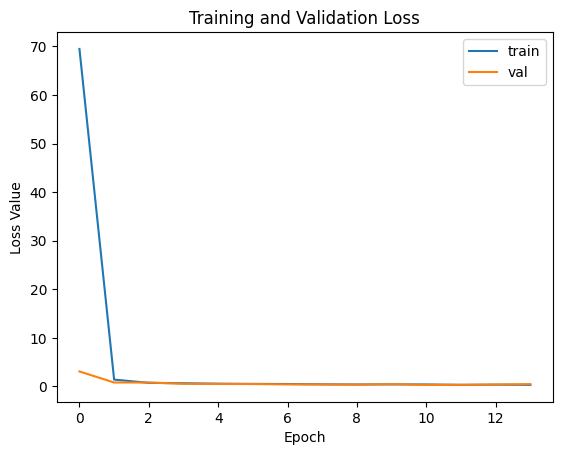

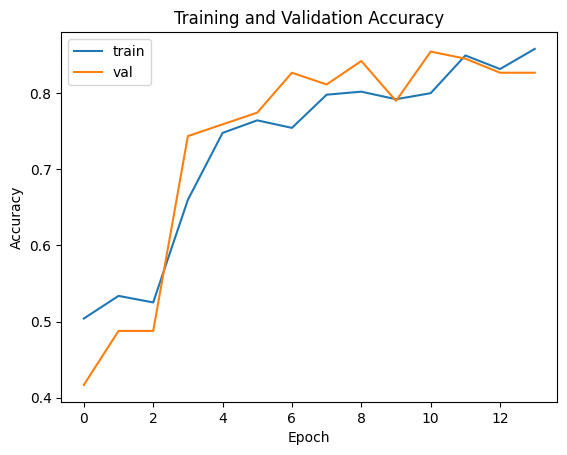

learning rate:  0.1 batch size:  128 image shape:  128
Epoch 1/400
12/12 [==============================] - 5s 165ms/step - loss: 51.4365 - accuracy: 0.5212 - val_loss: 2.8880 - val_accuracy: 0.4877
Epoch 2/400
12/12 [==============================] - 1s 73ms/step - loss: 1.3387 - accuracy: 0.4808 - val_loss: 0.7000 - val_accuracy: 0.4877
Epoch 3/400
12/12 [==============================] - 1s 75ms/step - loss: 0.6915 - accuracy: 0.5311 - val_loss: 0.7049 - val_accuracy: 0.4877
Epoch 4/400
12/12 [==============================] - 1s 73ms/step - loss: 0.6890 - accuracy: 0.5311 - val_loss: 0.6983 - val_accuracy: 0.4877
Epoch 5/400
12/12 [==============================] - 1s 72ms/step - loss: 0.6875 - accuracy: 0.5311 - val_loss: 0.6982 - val_accuracy: 0.4877
Epoch 6/400
12/12 [==============================] - 1s 73ms/step - loss: 0.6816 - accuracy: 0.5311 - val_loss: 0.6992 - val_accuracy: 0.4877
Epoch 7/400
12/12 [==============================] - 1s 73ms/step - loss: 0.6752 - accuracy

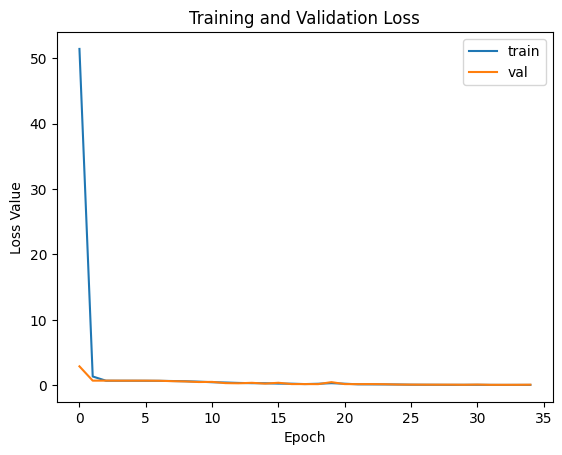

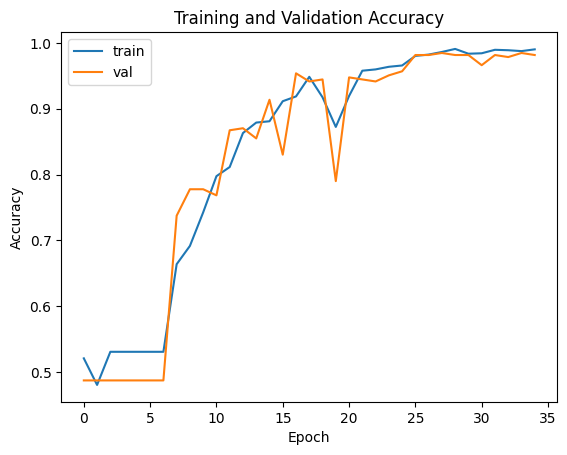

learning rate:  0.1 batch size:  128 image shape:  64
Epoch 1/400
12/12 [==============================] - 4s 109ms/step - loss: 151.7654 - accuracy: 0.4934 - val_loss: 0.7220 - val_accuracy: 0.4877
Epoch 2/400
12/12 [==============================] - 0s 29ms/step - loss: 0.7192 - accuracy: 0.5311 - val_loss: 0.7494 - val_accuracy: 0.4877
Epoch 3/400
12/12 [==============================] - 0s 27ms/step - loss: 0.7108 - accuracy: 0.5311 - val_loss: 0.7118 - val_accuracy: 0.4877
Epoch 4/400
12/12 [==============================] - 0s 27ms/step - loss: 0.6918 - accuracy: 0.5311 - val_loss: 0.6960 - val_accuracy: 0.4877
Epoch 5/400
12/12 [==============================] - 0s 27ms/step - loss: 0.6916 - accuracy: 0.5311 - val_loss: 0.6938 - val_accuracy: 0.4877
Epoch 6/400
12/12 [==============================] - 0s 28ms/step - loss: 0.6920 - accuracy: 0.5311 - val_loss: 0.6948 - val_accuracy: 0.4877
Epoch 7/400
12/12 [==============================] - 0s 27ms/step - loss: 0.6913 - accuracy

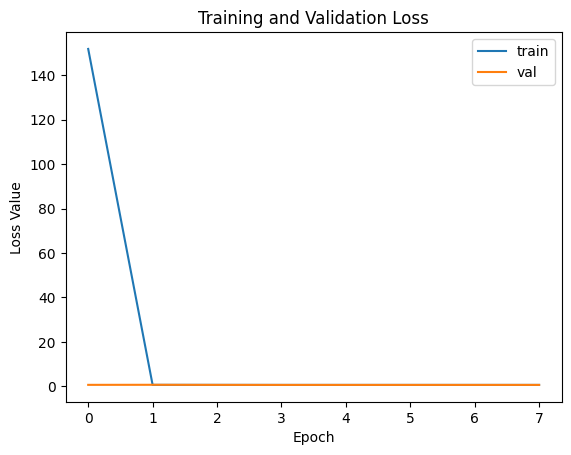

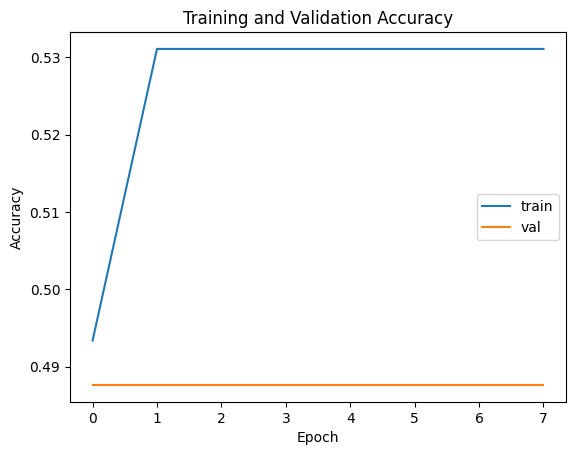

learning rate:  0.1 batch size:  128 image shape:  32
Epoch 1/400
12/12 [==============================] - 4s 102ms/step - loss: 1.8412 - accuracy: 0.5093 - val_loss: 0.6459 - val_accuracy: 0.6389
Epoch 2/400
12/12 [==============================] - 0s 23ms/step - loss: 0.6258 - accuracy: 0.6475 - val_loss: 0.5596 - val_accuracy: 0.7315
Epoch 3/400
12/12 [==============================] - 0s 18ms/step - loss: 0.5397 - accuracy: 0.7282 - val_loss: 0.5021 - val_accuracy: 0.7284
Epoch 4/400
12/12 [==============================] - 0s 17ms/step - loss: 0.4754 - accuracy: 0.7751 - val_loss: 0.4627 - val_accuracy: 0.7994
Epoch 5/400
12/12 [==============================] - 0s 16ms/step - loss: 0.4377 - accuracy: 0.7983 - val_loss: 0.4621 - val_accuracy: 0.7932
Epoch 6/400
12/12 [==============================] - 0s 16ms/step - loss: 0.4142 - accuracy: 0.8089 - val_loss: 0.4130 - val_accuracy: 0.8056
Epoch 7/400
12/12 [==============================] - 0s 17ms/step - loss: 0.4293 - accuracy: 

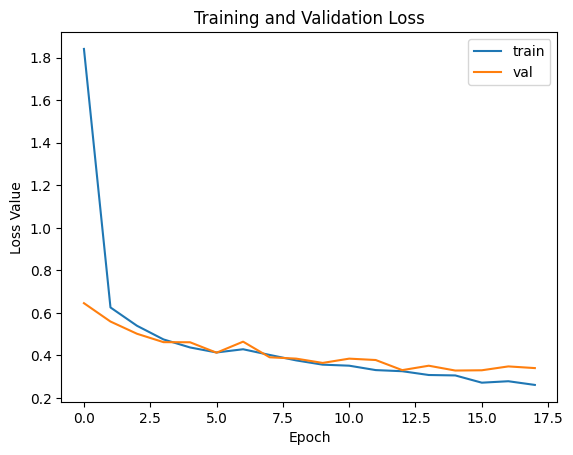

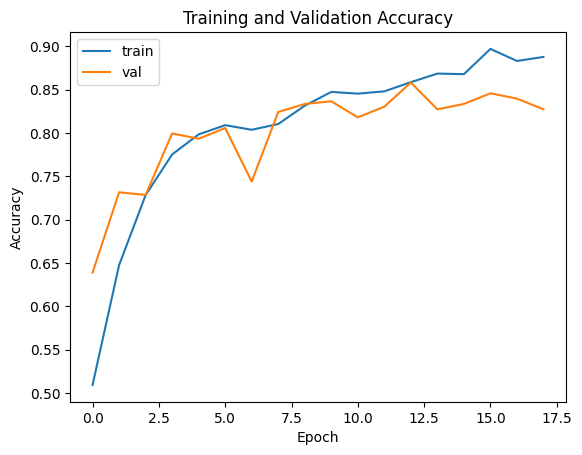

In [ ]:
# try the model with different batch sizes and different learning rates to see the effect on the model performance and plot the results of each model with legend
learning_rates = [0.0001, 0.001, 0.01, 0.1]
batch_sizes    = [16, 32, 64, 128]
image_shape    = [256, 128, 64, 32]
models = []
for lr in learning_rates:
    for bs in batch_sizes:
        for ish in image_shape:
            # Resize the images
            X_train = np.array([resize_image(image, ish) for image in X_train])
            X_test  = np.array([resize_image(image, ish) for image in X_test])
            X_val   = np.array([resize_image(image, ish) for image in X_val])
            base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(ish, ish, 3))
            print('learning rate: ', lr, 'batch size: ', bs, 'image shape: ', ish)
            # Freeze the layers of the base model
            for layer in base_model.layers:
                layer.trainable = False

            # Add custom layers
            x = GlobalAveragePooling2D()(base_model.output)
            x = Dense(512, activation='relu')(x)
            predictions = Dense(1, activation='sigmoid')(x)

            # Define the final model
            MobileNetV2model = tf.keras.Model(inputs=base_model.input, outputs=predictions)

            # Compile the model
            MobileNetV2model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss='binary_crossentropy', metrics=['accuracy'])
            from keras.callbacks import EarlyStopping
            # Define early stopping
            early_stopping = EarlyStopping(monitor='val_loss', patience=3)

            history = MobileNetV2model.fit(X_train, y_train, epochs=400, validation_data=(X_val, y_val), verbose=1, callbacks=[early_stopping],batch_size=bs)
            models.append([lr, bs, ish, history])
            # Plot the training and validation loss
            plt.plot(history.history['loss'], label='train')
            plt.plot(history.history['val_loss'], label='val')
            plt.title('Training and Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss Value')
            plt.legend()
            plt.show()

            # Plot the training and validation accuracy
            plt.plot(history.history['accuracy'], label='train')
            plt.plot(history.history['val_accuracy'], label='val')
            plt.title('Training and Validation Accuracy')
            plt.xlabel('Epoch')
            plt.ylabel('Accuracy')
            plt.legend()
            plt.show()

## Evaluating Learning Rate Impact

### Evaluating the Impact of Different Learning Rates
This cell focuses on observing how varying learning rates affect the performance of the MobileNetV2 model. We keep the batch size constant at 16 and the image size at 128x128, and iterate over different learning rates.

- **Learning Rates Tested**: 0.0001, 0.001, 0.01, 0.1, 0.5

We evaluate the model's training and validation loss and accuracy for each learning rate, providing visual plots to compare the outcomes. The goal is to identify the learning rate that achieves a balance between efficient learning and model accuracy.


Epoch 1/400
95/95 [==============================] - 5s 25ms/step - loss: 0.5726 - accuracy: 0.7229 - val_loss: 0.5179 - val_accuracy: 0.7994
Epoch 2/400
95/95 [==============================] - 1s 13ms/step - loss: 0.4875 - accuracy: 0.7824 - val_loss: 0.4600 - val_accuracy: 0.8086
Epoch 3/400
95/95 [==============================] - 1s 13ms/step - loss: 0.4344 - accuracy: 0.8188 - val_loss: 0.4368 - val_accuracy: 0.8179
Epoch 4/400
95/95 [==============================] - 1s 13ms/step - loss: 0.4037 - accuracy: 0.8366 - val_loss: 0.3793 - val_accuracy: 0.8611
Epoch 5/400
95/95 [==============================] - 1s 14ms/step - loss: 0.3620 - accuracy: 0.8757 - val_loss: 0.3437 - val_accuracy: 0.8735
Epoch 6/400
95/95 [==============================] - 1s 14ms/step - loss: 0.3241 - accuracy: 0.8929 - val_loss: 0.3303 - val_accuracy: 0.8642
Epoch 7/400
95/95 [==============================] - 1s 14ms/step - loss: 0.3049 - accuracy: 0.8968 - val_loss: 0.3071 - val_accuracy: 0.8704
Epoch 

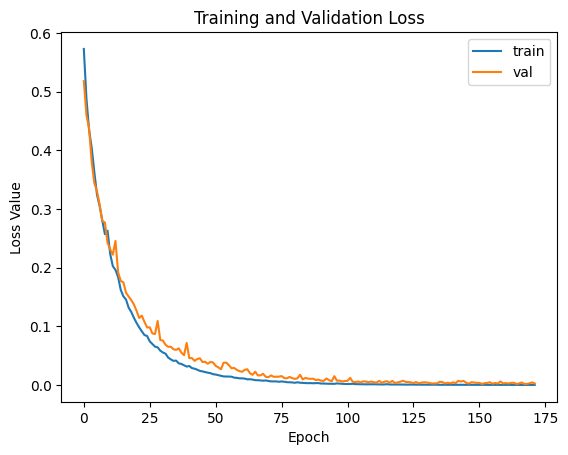

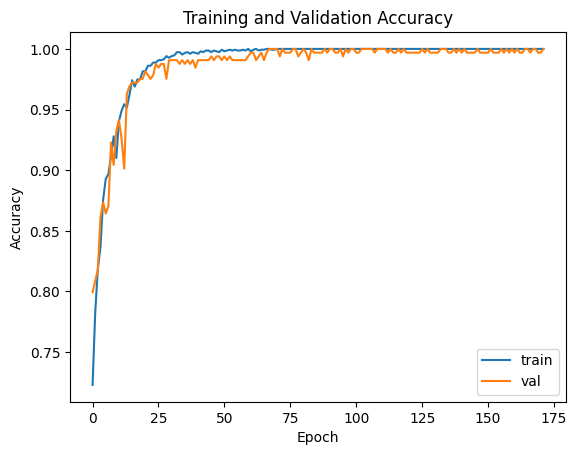

Epoch 1/400
95/95 [==============================] - 5s 26ms/step - loss: 0.5887 - accuracy: 0.7004 - val_loss: 0.5301 - val_accuracy: 0.6543
Epoch 2/400
95/95 [==============================] - 1s 13ms/step - loss: 0.3801 - accuracy: 0.8327 - val_loss: 0.3195 - val_accuracy: 0.8704
Epoch 3/400
95/95 [==============================] - 1s 14ms/step - loss: 0.3194 - accuracy: 0.8671 - val_loss: 0.2561 - val_accuracy: 0.9198
Epoch 4/400
95/95 [==============================] - 1s 13ms/step - loss: 0.2484 - accuracy: 0.9081 - val_loss: 0.2087 - val_accuracy: 0.9198
Epoch 5/400
95/95 [==============================] - 1s 13ms/step - loss: 0.1659 - accuracy: 0.9623 - val_loss: 0.1620 - val_accuracy: 0.9599
Epoch 6/400
95/95 [==============================] - 1s 13ms/step - loss: 0.1832 - accuracy: 0.9292 - val_loss: 0.1628 - val_accuracy: 0.9568
Epoch 7/400
95/95 [==============================] - 1s 14ms/step - loss: 0.1417 - accuracy: 0.9484 - val_loss: 0.1654 - val_accuracy: 0.9506
Epoch 

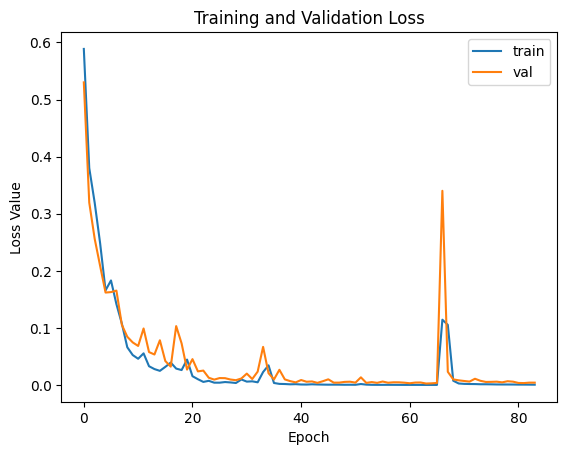

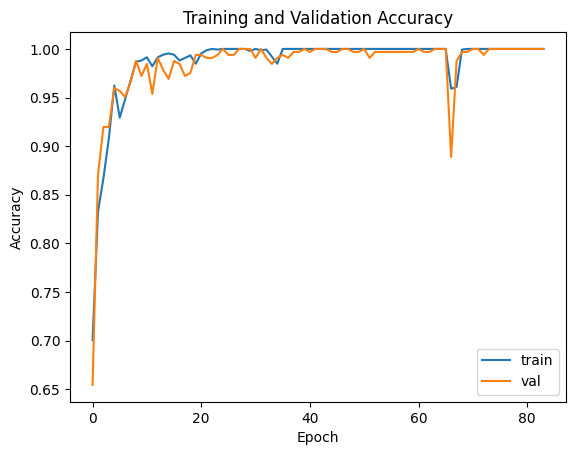

Epoch 1/400
95/95 [==============================] - 5s 25ms/step - loss: 0.9865 - accuracy: 0.6898 - val_loss: 0.4660 - val_accuracy: 0.7901
Epoch 2/400
95/95 [==============================] - 1s 13ms/step - loss: 0.4375 - accuracy: 0.8016 - val_loss: 0.3249 - val_accuracy: 0.8735
Epoch 3/400
95/95 [==============================] - 1s 13ms/step - loss: 0.3692 - accuracy: 0.8413 - val_loss: 0.3660 - val_accuracy: 0.8210
Epoch 4/400
95/95 [==============================] - 1s 14ms/step - loss: 0.2587 - accuracy: 0.8962 - val_loss: 0.3449 - val_accuracy: 0.8148
Epoch 5/400
95/95 [==============================] - 1s 14ms/step - loss: 0.3193 - accuracy: 0.8638 - val_loss: 0.3872 - val_accuracy: 0.7932
Epoch 6/400
95/95 [==============================] - 1s 14ms/step - loss: 0.2083 - accuracy: 0.9213 - val_loss: 0.4626 - val_accuracy: 0.7407
Epoch 7/400
95/95 [==============================] - 1s 13ms/step - loss: 0.1848 - accuracy: 0.9299 - val_loss: 0.1200 - val_accuracy: 0.9691
Epoch 

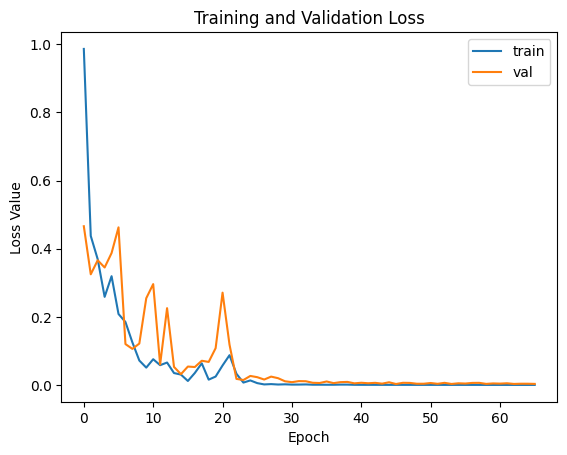

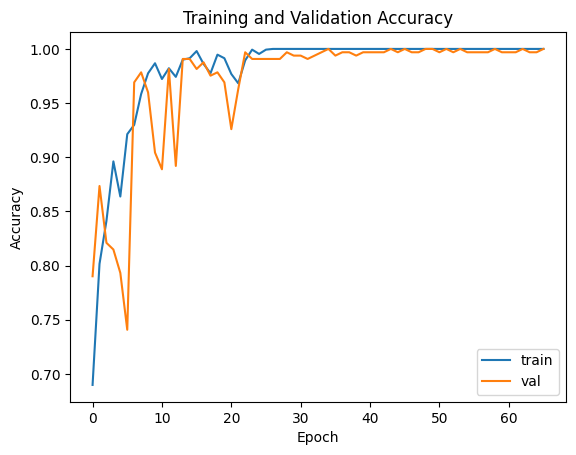

Epoch 1/400
95/95 [==============================] - 5s 25ms/step - loss: 8.8986 - accuracy: 0.5463 - val_loss: 0.6936 - val_accuracy: 0.5123
Epoch 2/400
95/95 [==============================] - 1s 14ms/step - loss: 0.6924 - accuracy: 0.5324 - val_loss: 0.7031 - val_accuracy: 0.4877
Epoch 3/400
95/95 [==============================] - 1s 14ms/step - loss: 0.6937 - accuracy: 0.5165 - val_loss: 0.6991 - val_accuracy: 0.4877
Epoch 4/400
95/95 [==============================] - 1s 14ms/step - loss: 0.6931 - accuracy: 0.5205 - val_loss: 0.6951 - val_accuracy: 0.4877
Epoch 5/400
95/95 [==============================] - 1s 14ms/step - loss: 0.6941 - accuracy: 0.5218 - val_loss: 0.6948 - val_accuracy: 0.4877
Epoch 6/400
95/95 [==============================] - 1s 13ms/step - loss: 0.6942 - accuracy: 0.5245 - val_loss: 0.6968 - val_accuracy: 0.4877
Epoch 7/400
95/95 [==============================] - 1s 14ms/step - loss: 0.6943 - accuracy: 0.5258 - val_loss: 0.6928 - val_accuracy: 0.5123
Epoch 

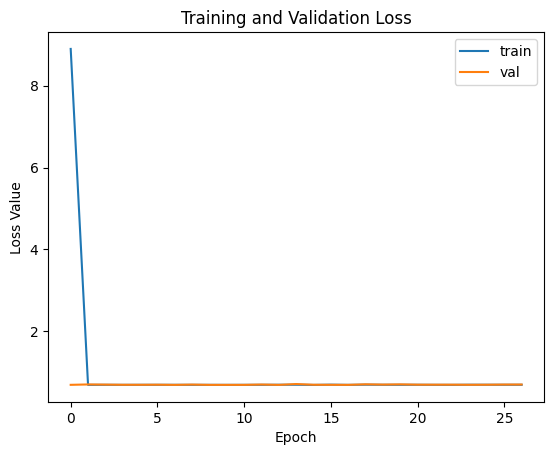

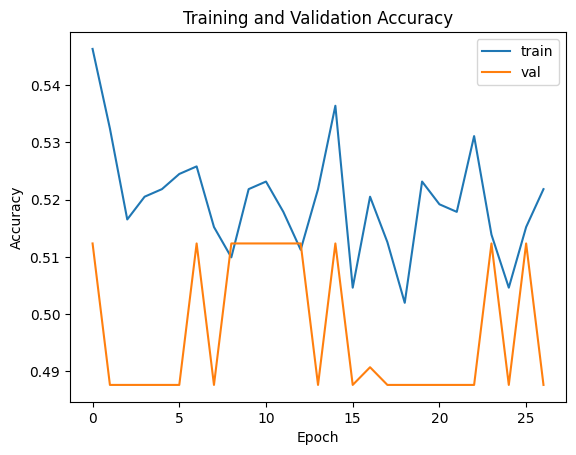

Epoch 1/400
95/95 [==============================] - 5s 25ms/step - loss: 121.7040 - accuracy: 0.5099 - val_loss: 0.7002 - val_accuracy: 0.5062
Epoch 2/400
95/95 [==============================] - 1s 13ms/step - loss: 0.7025 - accuracy: 0.5099 - val_loss: 0.7174 - val_accuracy: 0.4877
Epoch 3/400
95/95 [==============================] - 1s 14ms/step - loss: 0.6990 - accuracy: 0.5099 - val_loss: 0.6941 - val_accuracy: 0.5031
Epoch 4/400
95/95 [==============================] - 1s 14ms/step - loss: 0.7005 - accuracy: 0.5126 - val_loss: 0.7349 - val_accuracy: 0.4877
Epoch 5/400
95/95 [==============================] - 1s 14ms/step - loss: 0.6977 - accuracy: 0.5132 - val_loss: 0.7103 - val_accuracy: 0.4877
Epoch 6/400
95/95 [==============================] - 1s 14ms/step - loss: 0.7153 - accuracy: 0.5205 - val_loss: 0.7424 - val_accuracy: 0.4877
Epoch 7/400
95/95 [==============================] - 1s 13ms/step - loss: 0.7028 - accuracy: 0.5007 - val_loss: 0.7090 - val_accuracy: 0.4877
Epoc

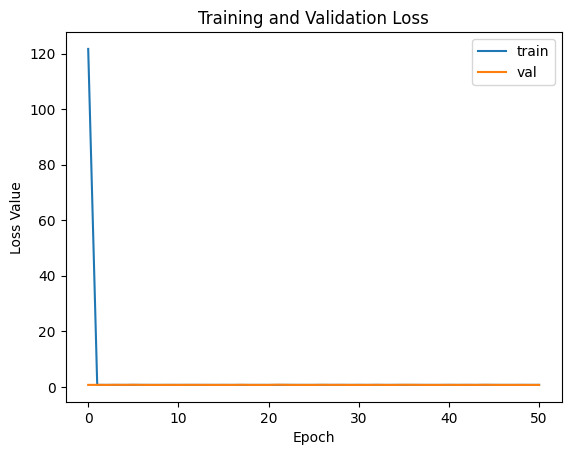

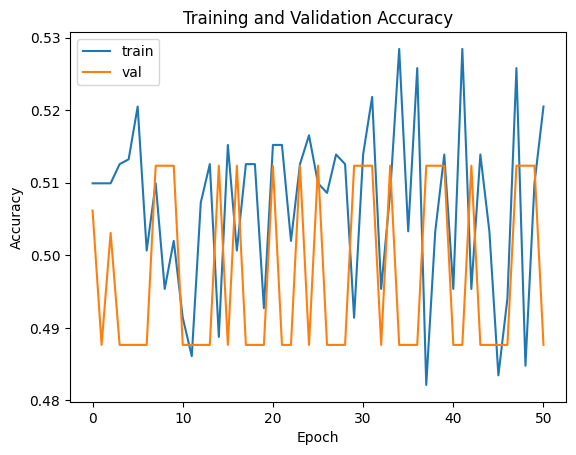

In [ ]:
learning_rates = [0.0001, 0.001, 0.01, 0.1,0.5]
# Resize the images
X_train = np.array([resize_image(image, 128) for image in X_train])
X_test  = np.array([resize_image(image, 128) for image in X_test])
X_val   = np.array([resize_image(image, 128) for image in X_val])
results = []
for lr in learning_rates:
  base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(128, 128, 3))
  # Freeze the layers of the base model
  for layer in base_model.layers:
      layer.trainable = False

  # Add custom layers
  x = GlobalAveragePooling2D()(base_model.output)
  x = Dense(512, activation='relu')(x)
  predictions = Dense(1, activation='sigmoid')(x)

  # Define the final model
  MobileNetV2model = tf.keras.Model(inputs=base_model.input, outputs=predictions)

  # Compile the model
  MobileNetV2model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss='binary_crossentropy', metrics=['accuracy'])
  from keras.callbacks import EarlyStopping
  # Define early stopping
  early_stopping = EarlyStopping(monitor='val_loss', patience=20)
  history = MobileNetV2model.fit(X_train, y_train, epochs=400, validation_data=(X_val, y_val), verbose=1, callbacks=[early_stopping],batch_size=16)
  results.append(history)
  # Plot the training and validation loss
  plt.plot(history.history['loss'], label='train')
  plt.plot(history.history['val_loss'], label='val')
  plt.title('Training and Validation Loss')
  plt.xlabel('Epoch')
  plt.ylabel('Loss Value')
  plt.legend()
  plt.show()

  # Plot the training and validation accuracy
  plt.plot(history.history['accuracy'], label='train')
  plt.plot(history.history['val_accuracy'], label='val')
  plt.title('Training and Validation Accuracy')
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy')
  plt.legend()
  plt.show()



## Correlating Learning Rate with Loss and Epochs

### Correlating Learning Rate with Loss and Number of Epochs
Here, we create a dataframe summarizing the minimum loss values and the number of epochs for each learning rate. Subsequently, we plot these metrics against the learning rates to visualize their relationships.

- **Metrics Plotted**:
    - Learning Rate vs. Loss
    - Learning Rate vs. Number of Epochs

We plot the model loss over a range of epochs for the following learning rates:
- 0.0001
- 0.001
- 0.01
- 0.1
- 0.5

These plots offer insights into the optimal learning rate that minimizes loss while also considering the computational efficiency reflected in the number of epochs needed for convergence.


In [ ]:
df = pd.DataFrame({'lr': [0.0001, 0.001, 0.01, 0.1, 0.5], 'loss': [min(l1), min(l2), min(l3), min(l4), min(l5)], 'epochs': [len(l1), len(l2), len(l3), len(l4), len(l5)]})
df

,lr,loss,epochs
0,0.0001,0.000067,172
1,0.0010,0.000251,84
2,0.0100,0.000096,66
3,0.1000,0.691430,27
4,0.5000,0.693186,51


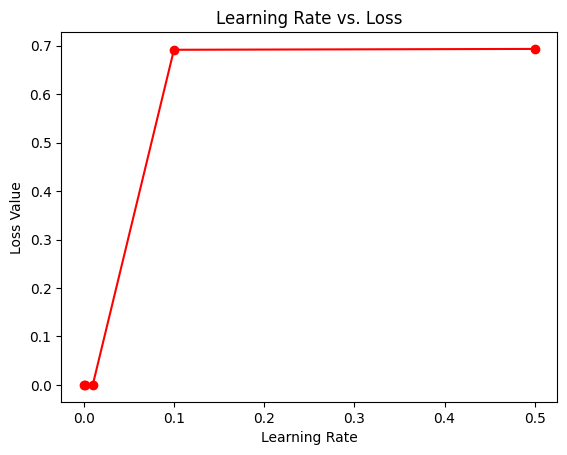

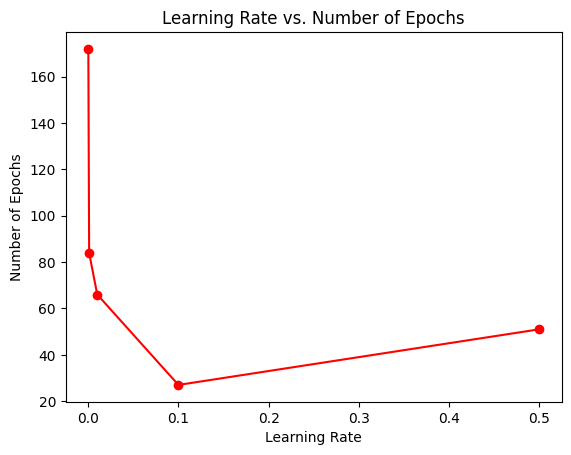

In [ ]:
#plot the loss vs lr
plt.plot(df['lr'], df['loss'], 'ro-')
plt.title('Learning Rate vs. Loss')
plt.xlabel('Learning Rate')
plt.ylabel('Loss Value')
plt.show()

#plot the lr vs epochs
plt.plot(df['lr'], df['epochs'], 'ro-')
plt.title('Learning Rate vs. Number of Epochs')
plt.xlabel('Learning Rate')
plt.ylabel('Number of Epochs')
plt.show()


## Comparing Training Loss Across Different Model Configrations

### Comparative Analysis of Training Loss Across Models
This section presents a comparative view of the training loss for different configrations created during our ablation study. Each model is characterized by a unique combination of learning rate, batch size, and image size.

We plot the training loss for each model configuration to visually assess which combinations lead to the most efficient learning in terms of loss reduction over epochs.


In [ ]:
models_copy = models

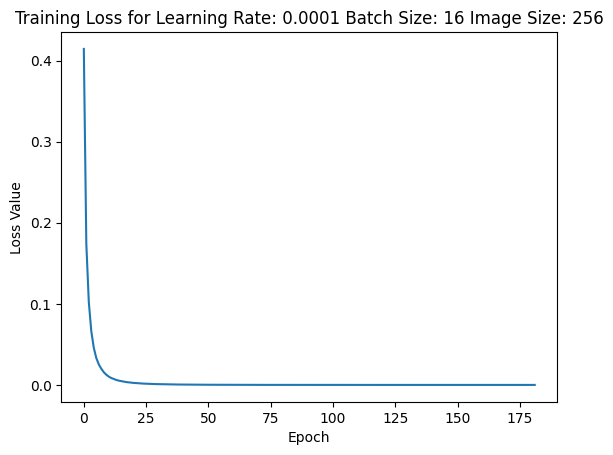

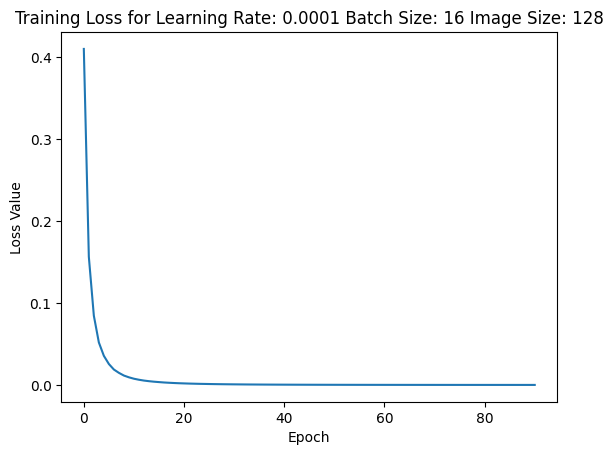

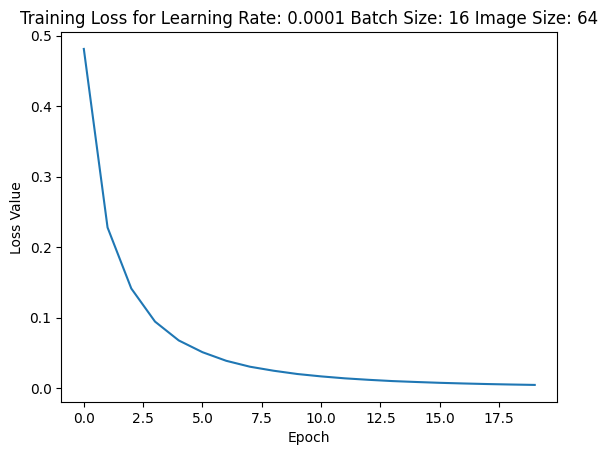

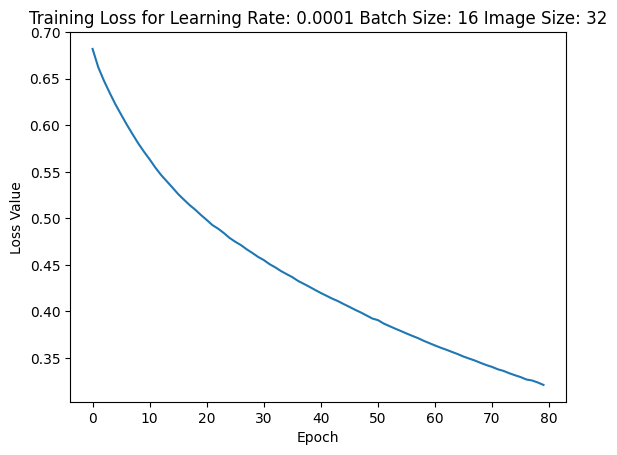

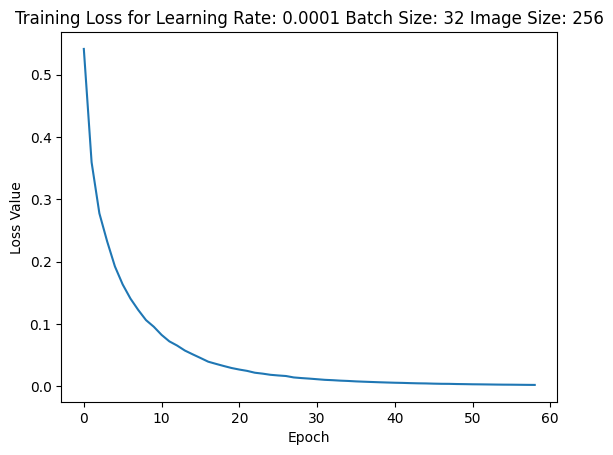

...

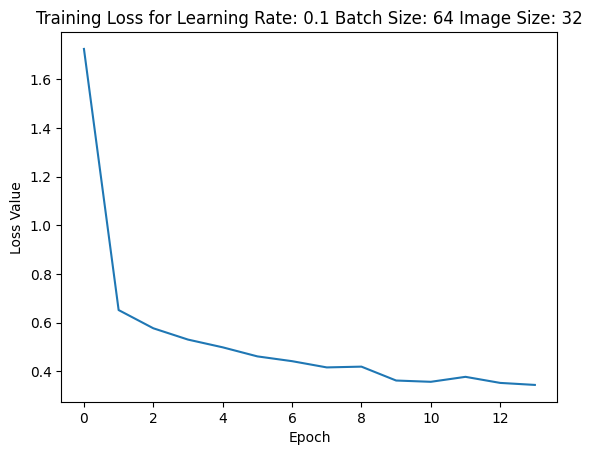

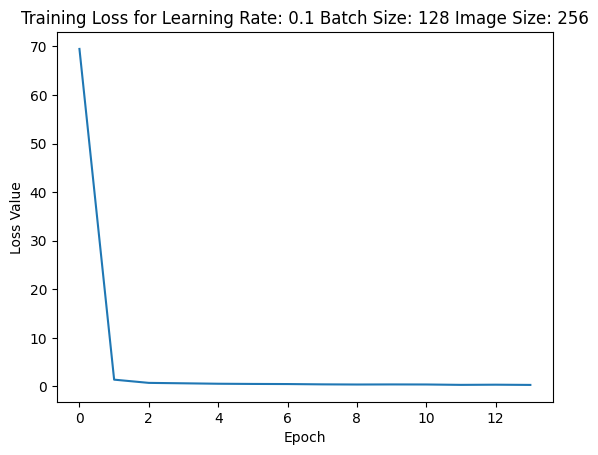

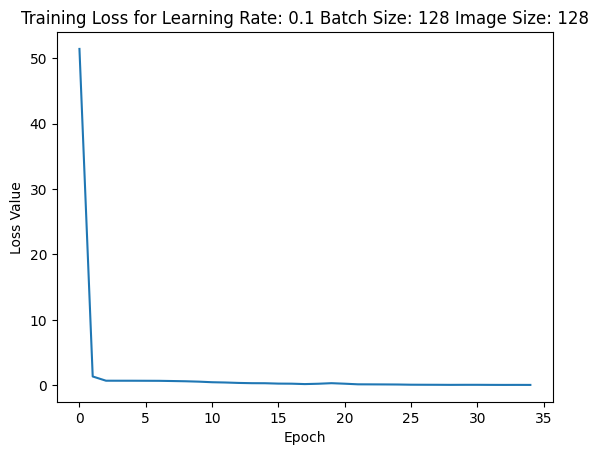

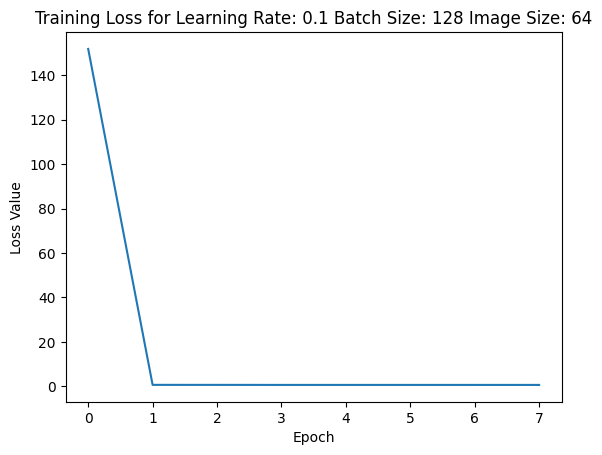

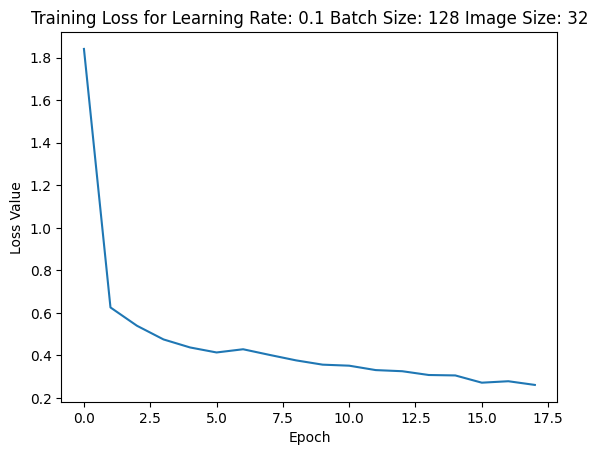

In [ ]:
for model in models_copy:
    plt.plot(model[3].history['loss'], label='lr: ' + str(model[0]) + ' bs: ' + str(model[1]) + ' image size: ' + str(model[2]))
    plt.title('Training Loss for Learning Rate: ' + str(model[0]) + ' Batch Size: ' + str(model[1]) + ' Image Size: ' + str(model[2]))
    plt.xlabel('Epoch')
    plt.ylabel('Loss Value')
    plt.show()




## Creating a DataFrame for Model Comparison

### Organizing Model Data for Comparative Analysis
We construct a DataFrame to systematically organize the data from our different model configurations. This DataFrame includes learning rates, batch sizes, image shapes, and the corresponding minimum loss values for each model.

This structured format allows us to effectively compare and analyze the impact of varying hyperparameters on model performance, laying the groundwork for more detailed visualizations in subsequent cells.


In [ ]:
models_copy[0]

[0.0001, 16, 256, <keras.src.callbacks.History at 0x7f88fcf2cfa0>]

In [ ]:
# make a dataframe with the models
models = pd.DataFrame(models)
models.head()

models.rename(columns={0: 'LR'}, inplace=True)
models.rename(columns={1: 'BS'}, inplace=True)
models.rename(columns={2: 'img_shape'}, inplace=True)
models.rename(columns={3: 'model'}, inplace=True)
models

In [ ]:
res=[]
for index, row in models.iterrows():
  res.append({'lr': row['LR'], 'bs': row['BS'], 'ish': row['img_shape'], 'loss': min(row['model'].history['loss'])})


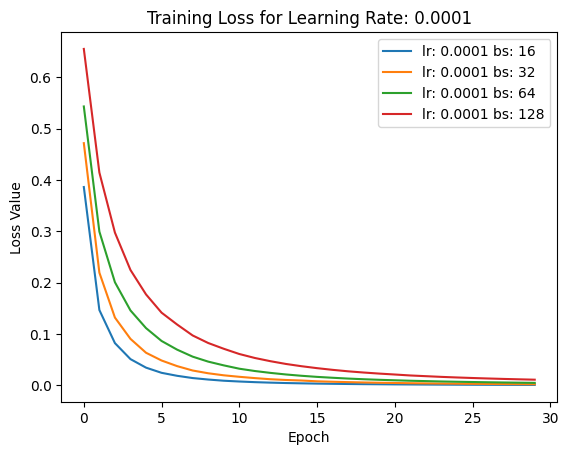

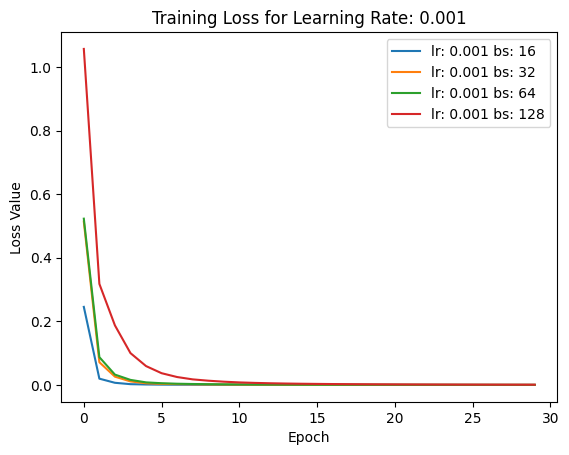

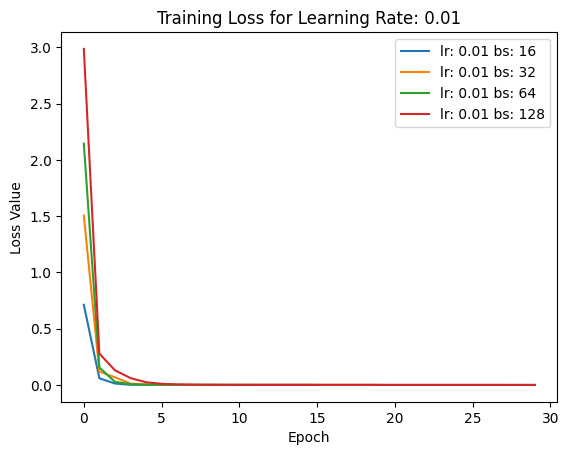

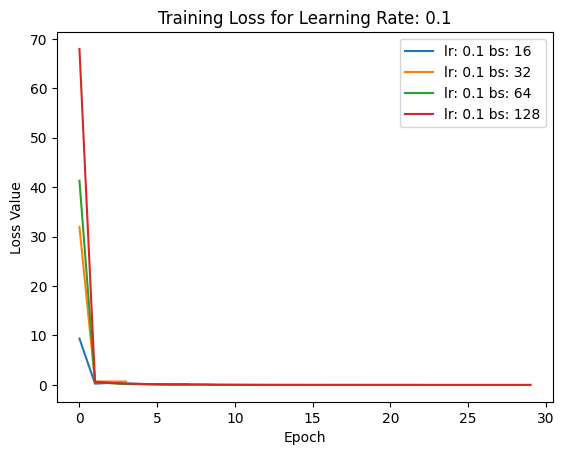

In [ ]:
#split the plot to present each learning rate with its batch sizes
for lr in learning_rates:
    for model in models:
        if model['lr'] == lr:
            plt.plot(model['history'].history['loss'], label='lr: ' + str(model['lr']) + ' bs: ' + str(model['bs']))

    plt.title('Training Loss for Learning Rate: ' + str(lr))
    plt.xlabel('Epoch')
    plt.ylabel('Loss Value')
    plt.legend()
    plt.show()


### Conclusion (Ablation Study)
- Lower learning rates require more epochs to converge but lead to smoother 
optimization and potentially better local minima. Higher rates may prevent the model 
from adequately learning.
- Batch size impacts both training speed and performance, with smaller sizes tending to 
converge faster but being noisier. This effect is magnified at very low learning rates.
- Larger input image sizes provide more visual detail but slow down training. While 
validation metrics may appear better early on, smaller sizes require fewer 
computations to stabilize.